# **Spatial Transformer Networks Tutorial**

### Learn how to augment the network using a visual attention mechanism called spatial transformer networks (STN).

### **Installing the packages**

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np
from six.moves import urllib

plt.ion()   # interactive mode

## **Loading the data**

### **Using the classic MNIST dataset.**

In [ ]:
opener = urllib.request.build_opener()
opener.addheaders = [('User-agent', 'Mozilla/5.0')]
urllib.request.install_opener(opener)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Training dataset
train_loader = torch.utils.data.DataLoader(
    datasets.MNIST(root='.',
                   train=True,
                   download=True,
                   transform=transforms.Compose([
                       transforms.ToTensor(),
                       transforms.Normalize((0.1307,), (0.3081,))
                   ])),
    batch_size=64,
    shuffle=True,
    num_workers=4)

# Test dataset
test_loader = torch.utils.data.DataLoader(
    datasets.MNIST(root='.',
                   train=False,
                   transform=transforms.Compose([
                      transforms.ToTensor(),
                      transforms.Normalize((0.1307,), (0.3081,))
                  ])),
    batch_size=64,
    shuffle=True,
    num_workers=4)

100%|██████████| 9.91M/9.91M [00:00<00:00, 20.5MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 489kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 4.60MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 9.34MB/s]


## **Depicting spatial transformer networks**

Spatial transformer networks boils down to three main components :

* The localization network is a regular CNN which regresses the transformation parameters. The transformation is never learned explicitly from this dataset, instead the network learns automatically the spatial transformations that enhances the global accuracy.

* The grid generator generates a grid of coordinates in the input image corresponding to each pixel from the output image.

* The sampler uses the parameters of the transformation and applies it to the input image.

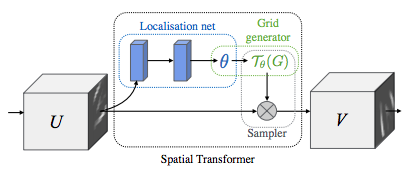

### **Max Pooling Algorithm**

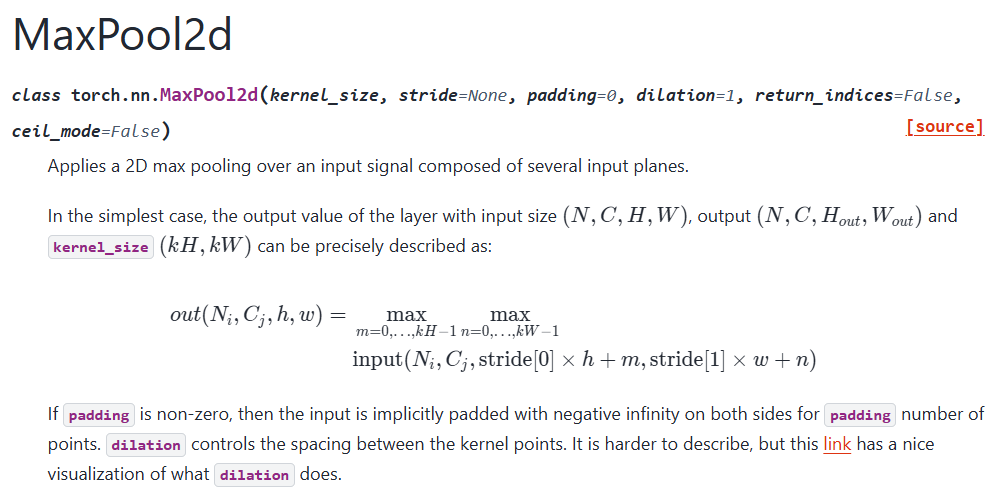

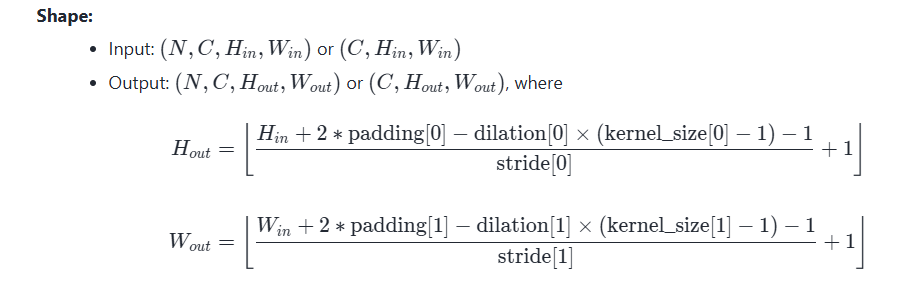

### **Conv2d**

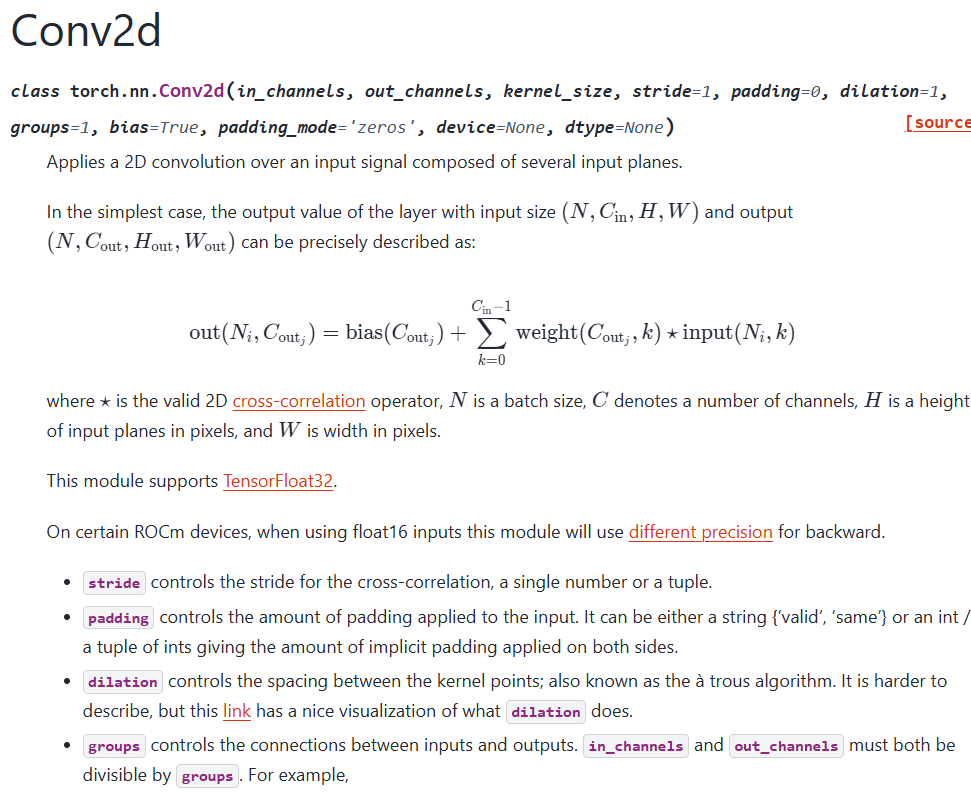

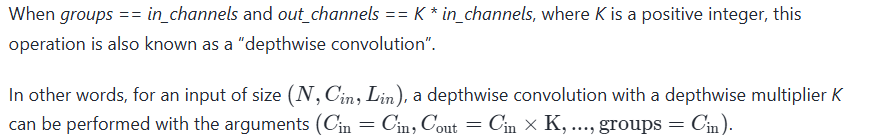

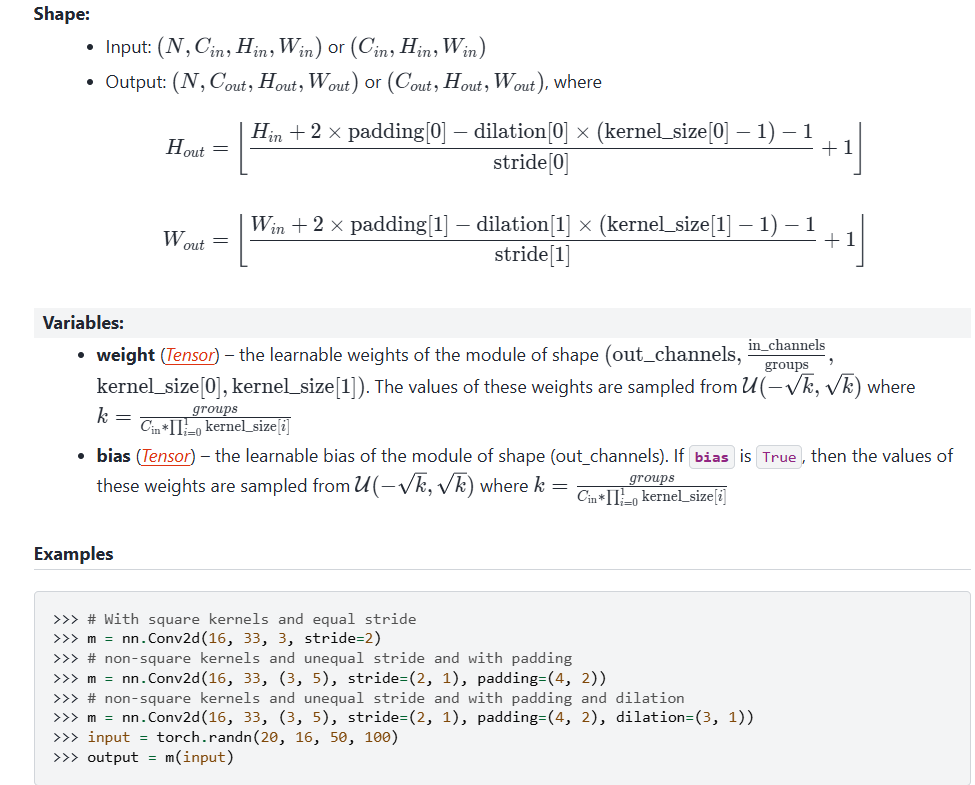

## **Creating model**

In [ ]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(1, 10, kernel_size=5) # применяет 2D-свёртку к входному сигналу, состоящему из нескольких входных плоскостей
        self.conv2 = nn.Conv2d(10, 20, kernel_size=5)
        self.conv2_drop = nn.Dropout2d()
        self.fc1 = nn.Linear(320, 50)
        self.fc2 = nn.Linear(50, 10)

        # Spatial transformer localization-network
        self.localization = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=7),
            nn.MaxPool2d(2, stride=2), # Applies a 2D max pooling over an input signal composed of several input planes.
            nn.ReLU(True),
            nn.Conv2d(8, 10, kernel_size=5),
            nn.MaxPool2d(2, stride=2),
            nn.ReLU(True)
        )

        # Regressor for the 3 * 2 affine matrix
        self.fc_loc = nn.Sequential(
            nn.Linear(10 * 3 * 3, 32),
            nn.ReLU(True),
            nn.Linear(32, 3 * 2)
        )

        # Initialize the weights/bias with identity transformation
        self.fc_loc[2].weight.data.zero_()
        self.fc_loc[2].bias.data.copy_(torch.tensor([1, 0, 0, 0, 1, 0], dtype=torch.float))

    # Spatial transformer network forward function
    def stn(self, x):
        xs = self.localization(x)
        xs = xs.view(-1, 10 * 3 * 3)
        theta = self.fc_loc(xs)
        theta = theta.view(-1, 2, 3)

        grid = F.affine_grid(theta, x.size())
        x = F.grid_sample(x, grid)

        return x

    def forward(self, x):
        # transform the input
        x = self.stn(x)

        # Perform the usual forward pass
        x = F.relu(F.max_pool2d(self.conv1(x), 2))
        x = F.relu(F.max_pool2d(self.conv2_drop(self.conv2(x)), 2))
        x = x.view(-1, 320)
        x = F.relu(self.fc1(x))
        x = F.dropout(x, training=self.training)
        x = self.fc2(x) # Watching the output of 2-nd layer
        return F.log_softmax(x, dim=1)


model = Net().to(device)

## **Training the model**

### **Defining different Optimizers and Loss functions**

In [ ]:
optimizers_config = {
    'SGD': {'optimizer': optim.SGD, 'lr': 0.01},
    'Adam': {'optimizer': optim.Adam, 'lr': 0.001},
    'AdamW': {'optimizer': optim.AdamW, 'lr': 0.001},
    'RMSprop': {'optimizer': optim.RMSprop, 'lr': 0.01},
    'Rprop': {'optimizer': optim.Rprop, 'lr': 0.01},
    'Adagrad': {'optimizer': optim.Adagrad, 'lr': 0.01},
    'Adadelta': {'optimizer': optim.Adadelta, 'lr': 1.0},
    'NAdam': {'optimizer': optim.NAdam, 'lr': 0.001},
    'RAdam': {'optimizer': optim.RAdam, 'lr': 0.001},
    # 'Muon': {'optimizer': optim.Muon, 'lr': 0.001}, - not working in new PyTorch version
    'LBFGS': {'optimizer': optim.LBFGS, 'lr': 1.0},
    'ASGD': {'optimizer': optim.ASGD, 'lr': 0.01},
    'Adamax': {'optimizer': optim.Adamax, 'lr': 0.002},
    'SparseAdam': {'optimizer': optim.SparseAdam, 'lr': 0.001},
    'Adafactor': {'optimizer': optim.Adafactor, 'lr': 0.01},
}

loss_functions = {
    # Основные для классификации
    'CrossEntropy': {'func': F.cross_entropy, 'type': 'classification'},
    'NLLLoss': {'func': F.nll_loss, 'type': 'classification'},

    # Бинарные и мультиклассовые
    'BCE': {'func': F.binary_cross_entropy, 'type': 'binary', 'requires_sigmoid': True},
    'BCEWithLogits': {'func': F.binary_cross_entropy_with_logits, 'type': 'binary'},
    'MultiLabelMargin': {'func': F.multilabel_margin_loss, 'type': 'multilabel'},
    'MultiLabelSoftMargin': {'func': F.multilabel_soft_margin_loss, 'type': 'multilabel'},

    # Регрессионные
    'MSE': {'func': F.mse_loss, 'type': 'regression'},
    'L1': {'func': F.l1_loss, 'type': 'regression'},
    'SmoothL1': {'func': F.smooth_l1_loss, 'type': 'regression'},
    'Huber': {'func': F.huber_loss, 'type': 'regression'},

    # Специальные
    'PoissonNLL': {'func': F.poisson_nll_loss, 'type': 'special'},
    'GaussianNLL': {'func': F.gaussian_nll_loss, 'type': 'special'},
    'KLDiv': {'func': F.kl_div, 'type': 'special', 'requires_log_target': True},
    'CosineEmbedding': {'func': F.cosine_embedding_loss, 'type': 'embedding'},
    'HingeEmbedding': {'func': F.hinge_embedding_loss, 'type': 'embedding'},
    'MarginRanking': {'func': F.margin_ranking_loss, 'type': 'ranking'},
    'MultiMargin': {'func': F.multi_margin_loss, 'type': 'classification'},
    'SoftMargin': {'func': F.soft_margin_loss, 'type': 'binary'},
    'TripletMargin': {'func': F.triplet_margin_loss, 'type': 'triplet'},
    'TripletMarginWithDistance': {'func': F.triplet_margin_with_distance_loss, 'type': 'triplet'},
}

### **A small talk about Loss Functions and Optimizers**

### **Optimizers (torch.optim)**

* ### **Adadelta**

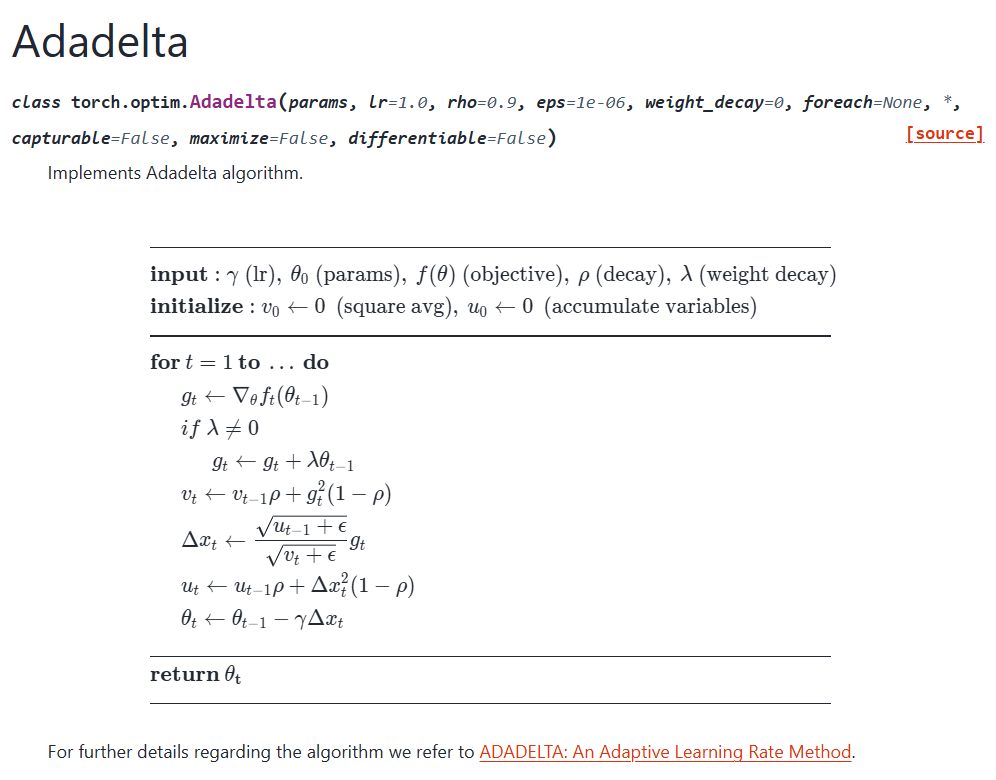

#### Params

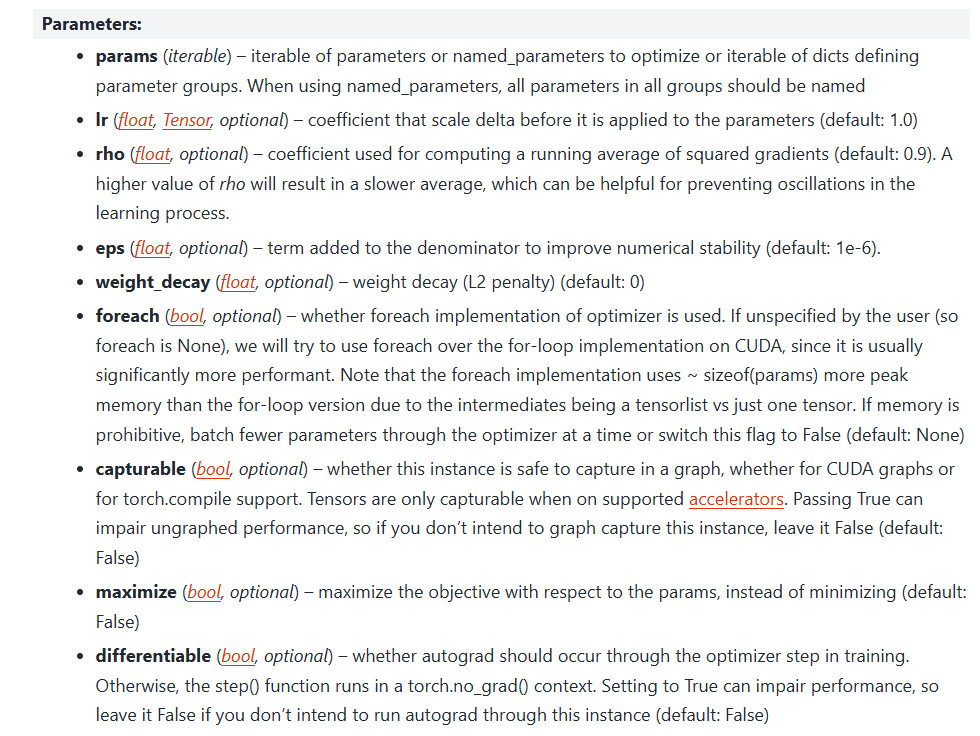

* ### **Adafactor**

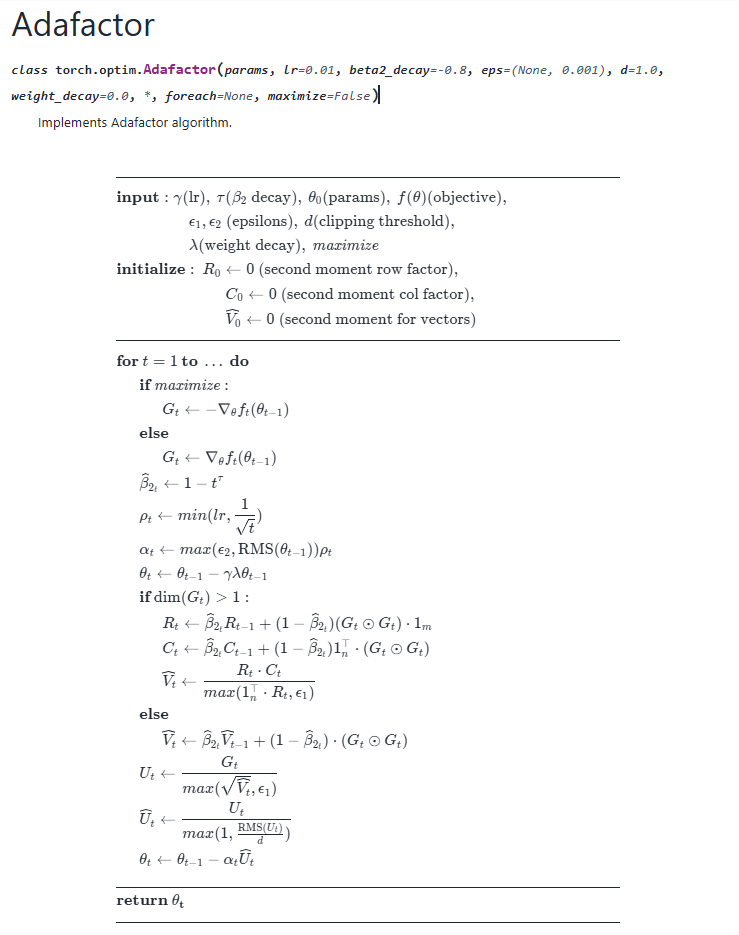

#### Params

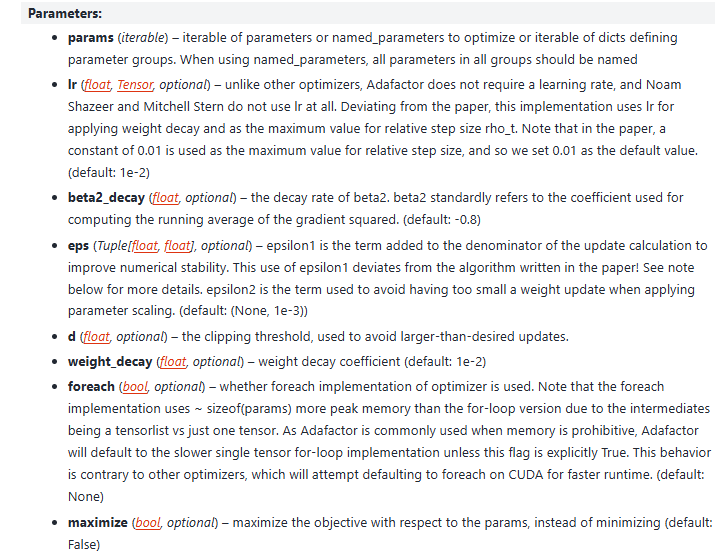

#### Notes

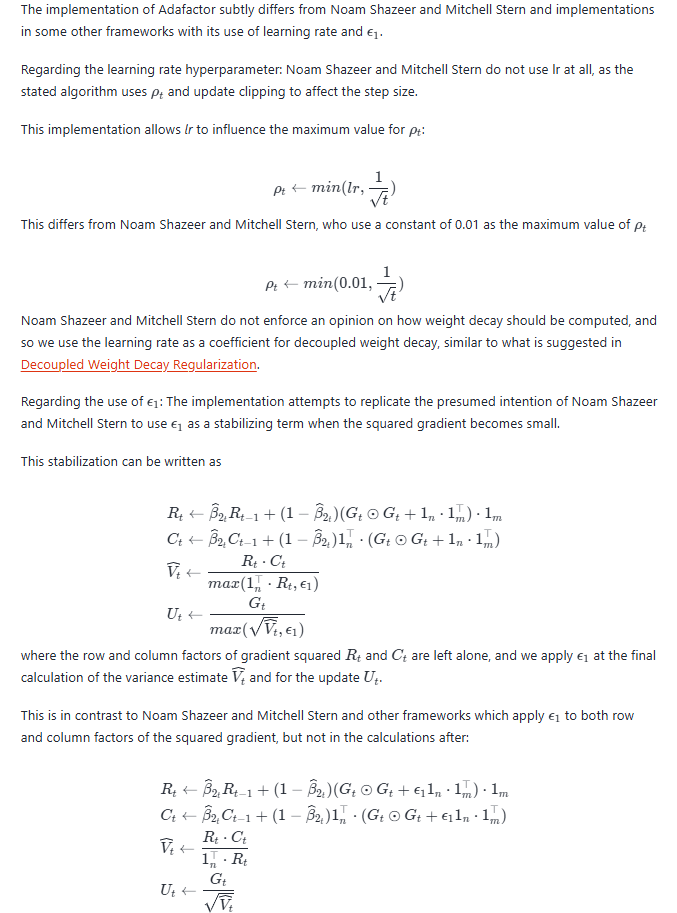

* ### **Adagrad**

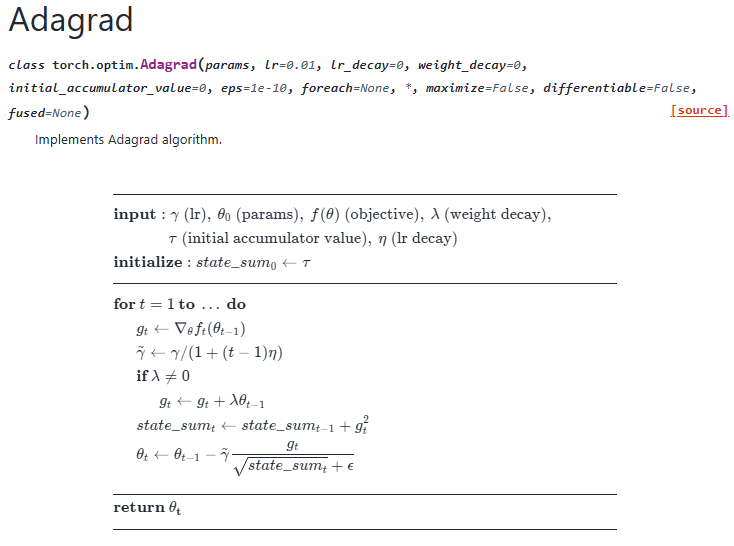

#### Params

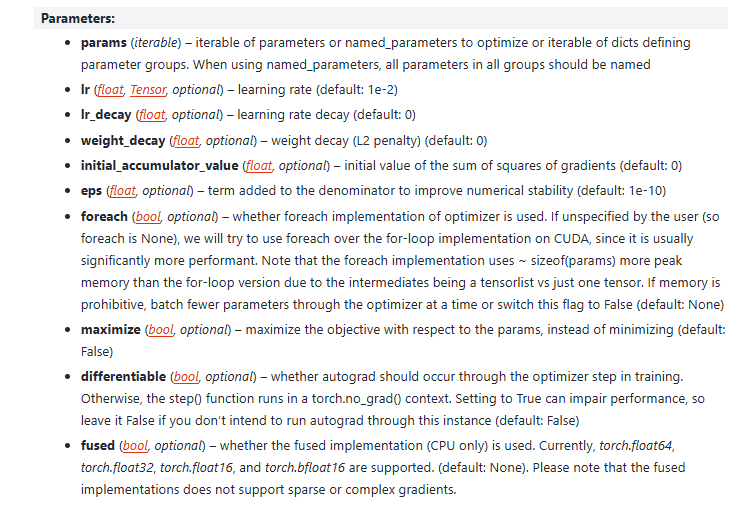

* ### **Adam**

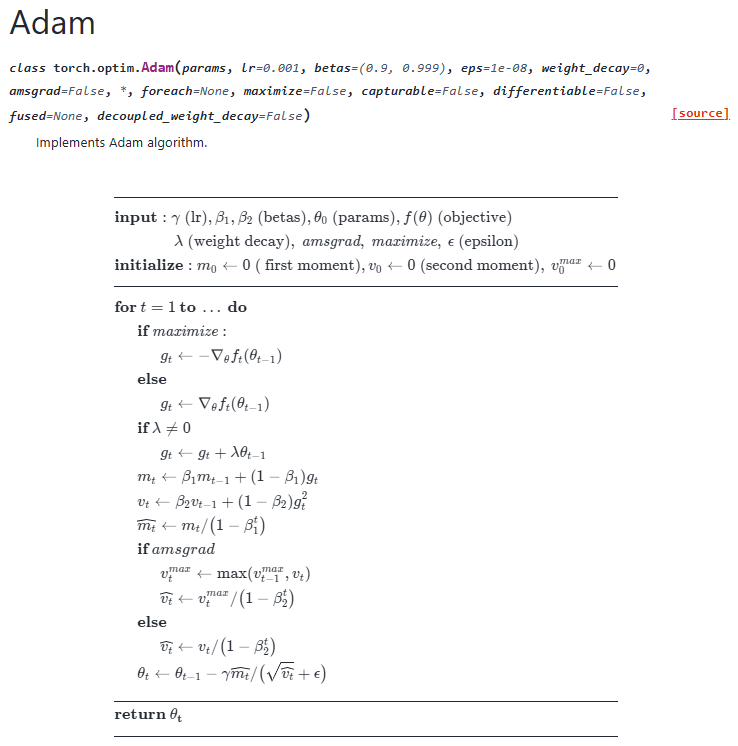

#### Params

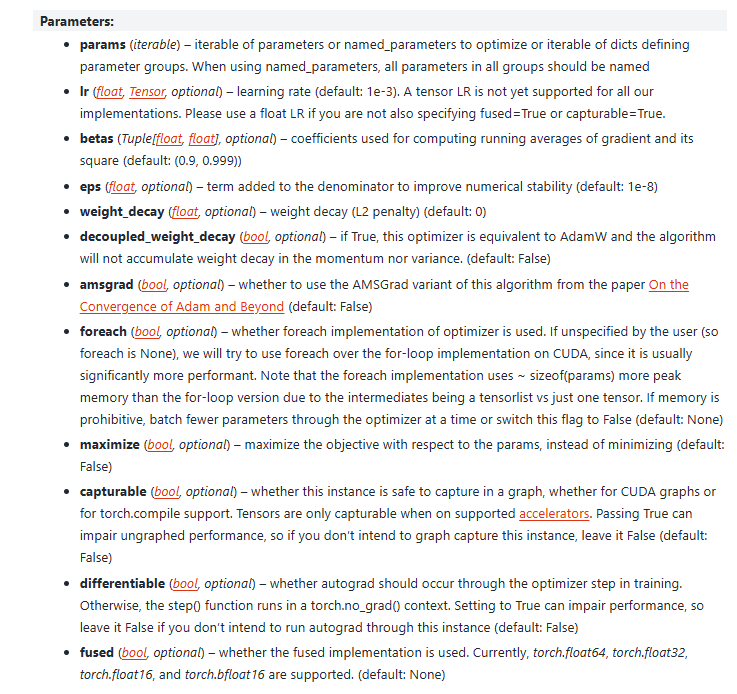

* ### **AdamW**

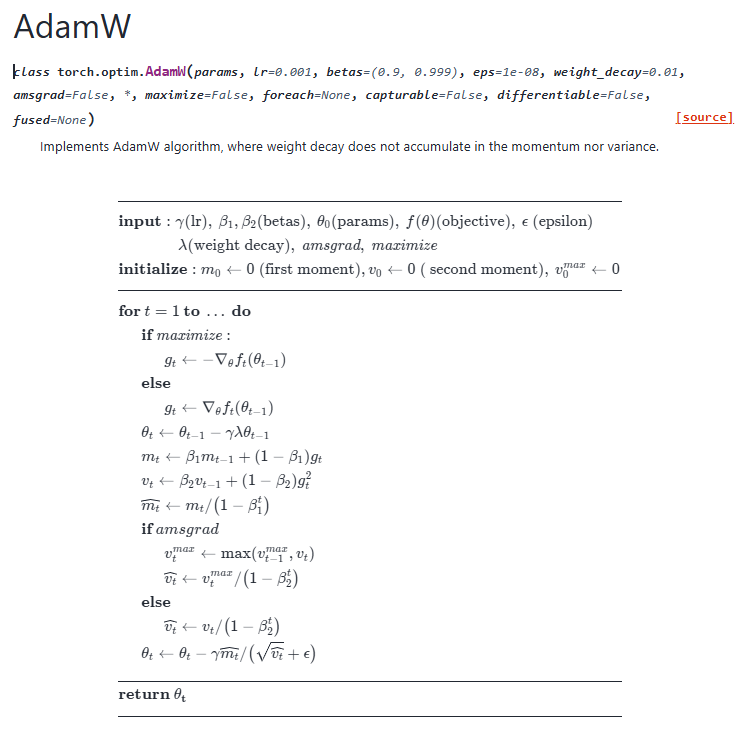

#### Params

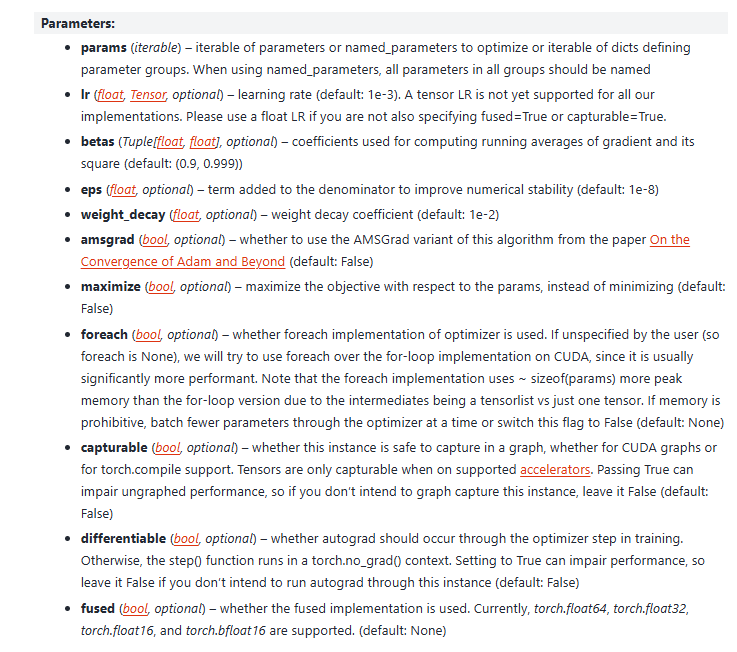

* ### **SparseAdam**

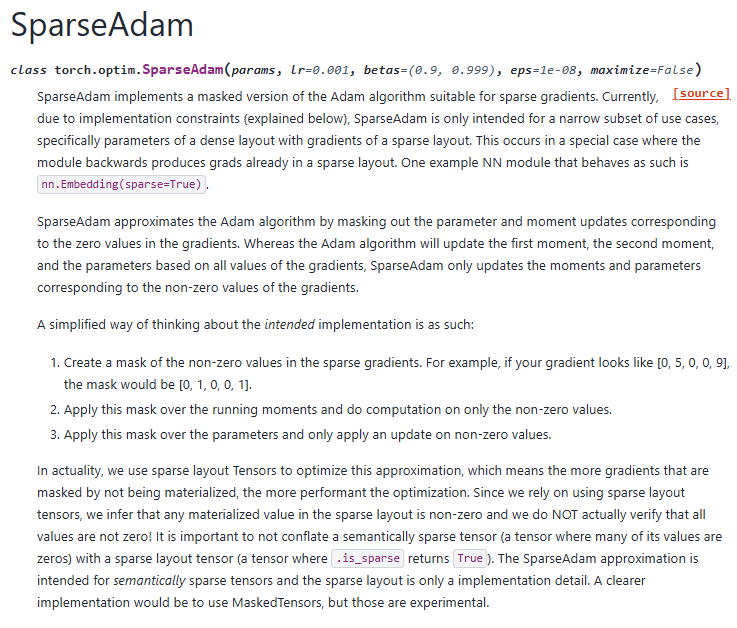

#### Params

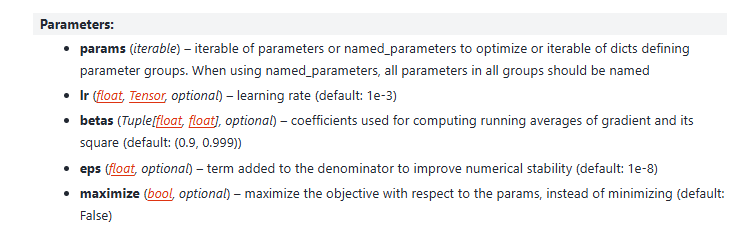

* ### **Adamax**

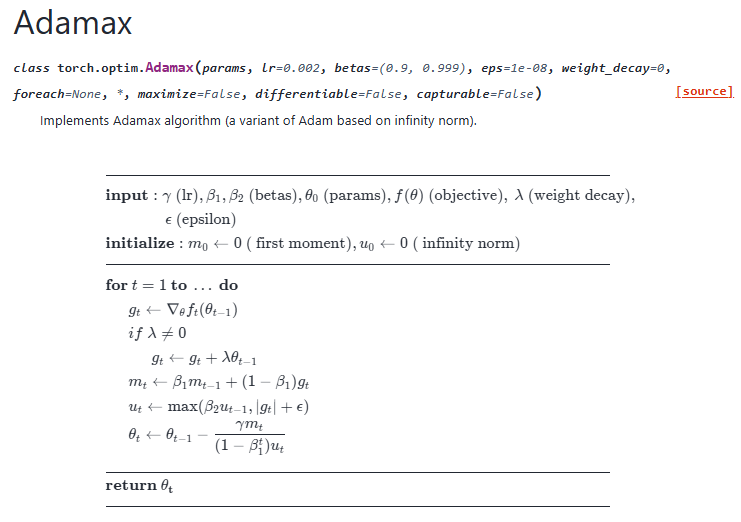

#### Params

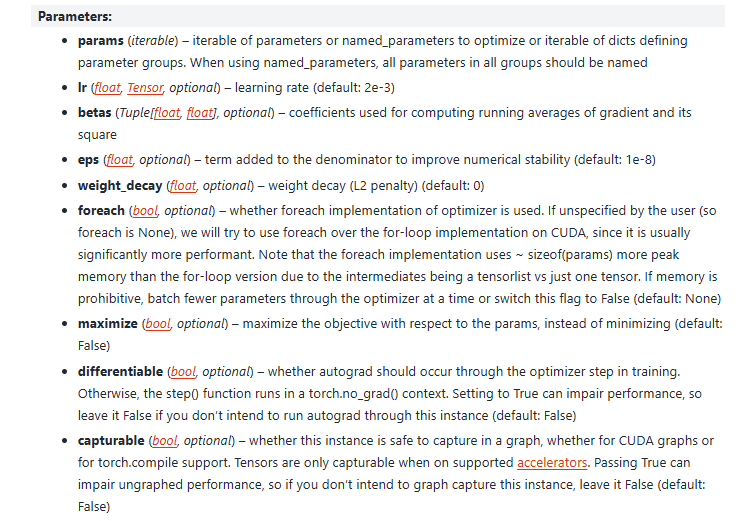

* ### **ASGD**

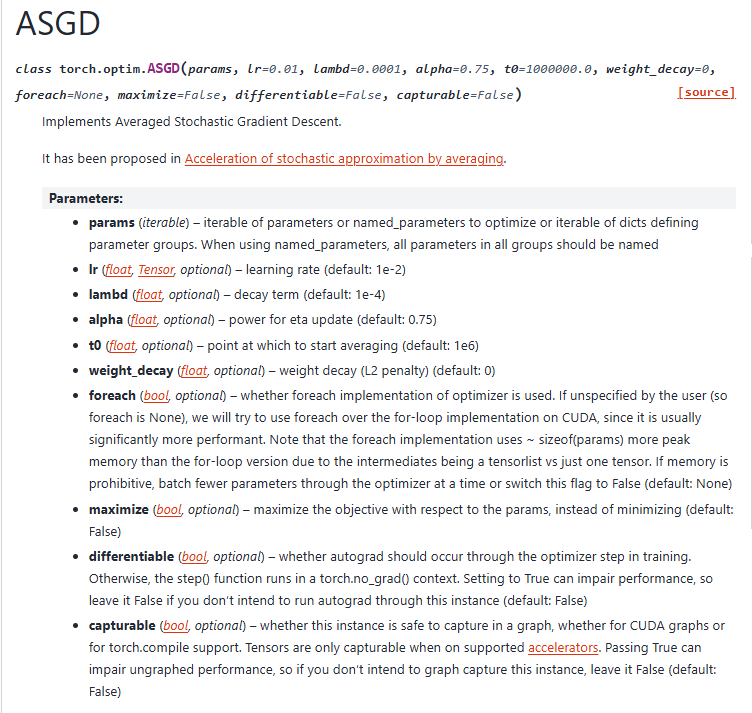

* ### **LBFGS**

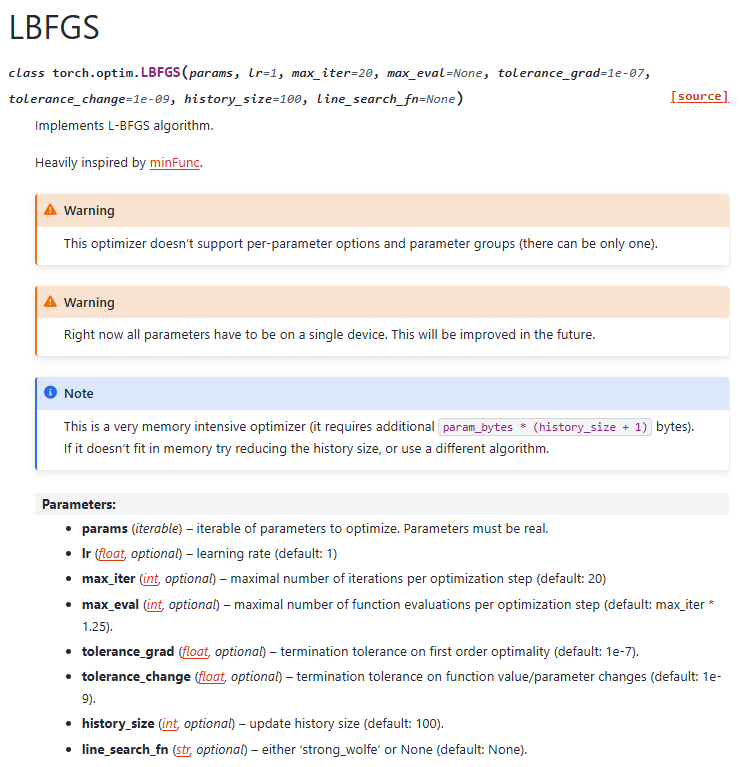

* ### **Muon**

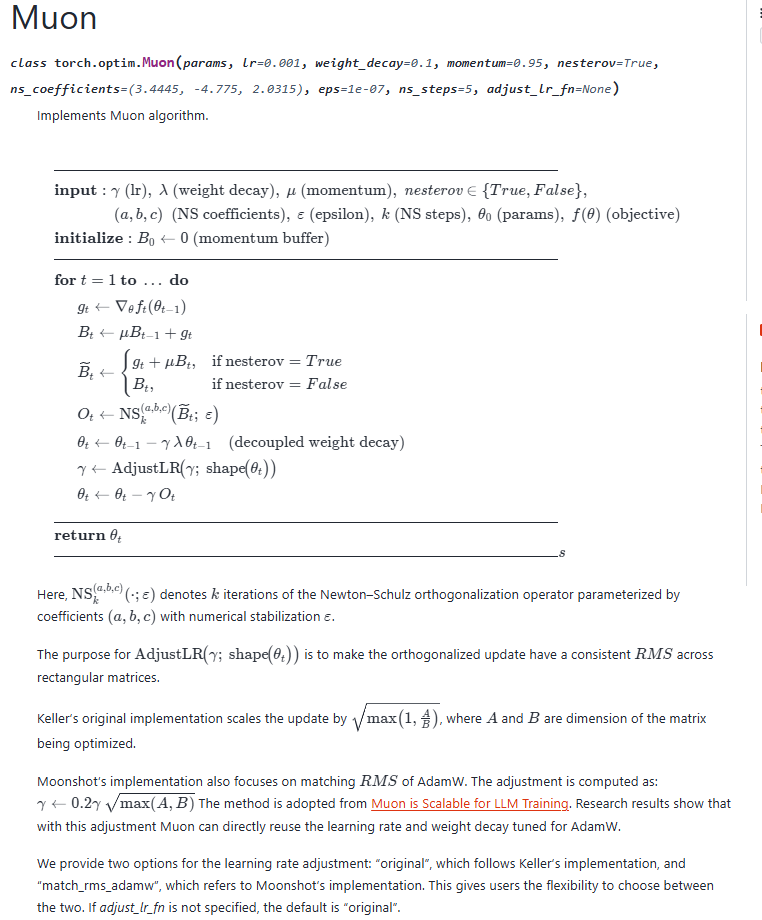

#### Params:

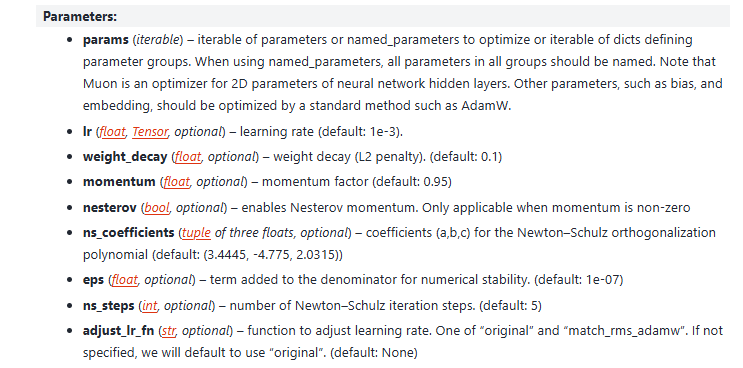

* ### **NAdam**

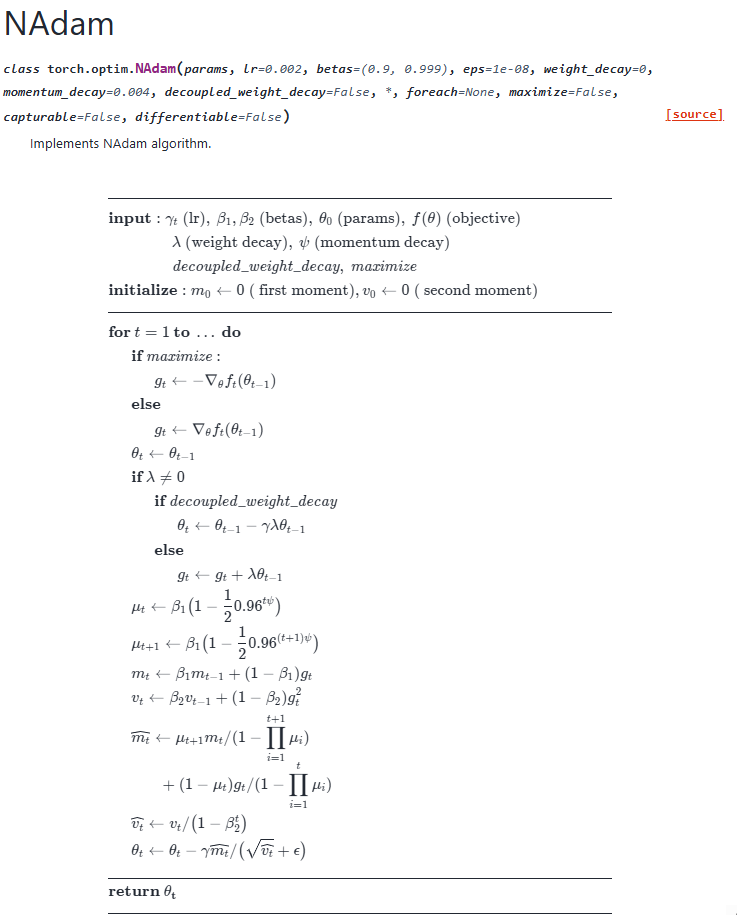

#### Params:

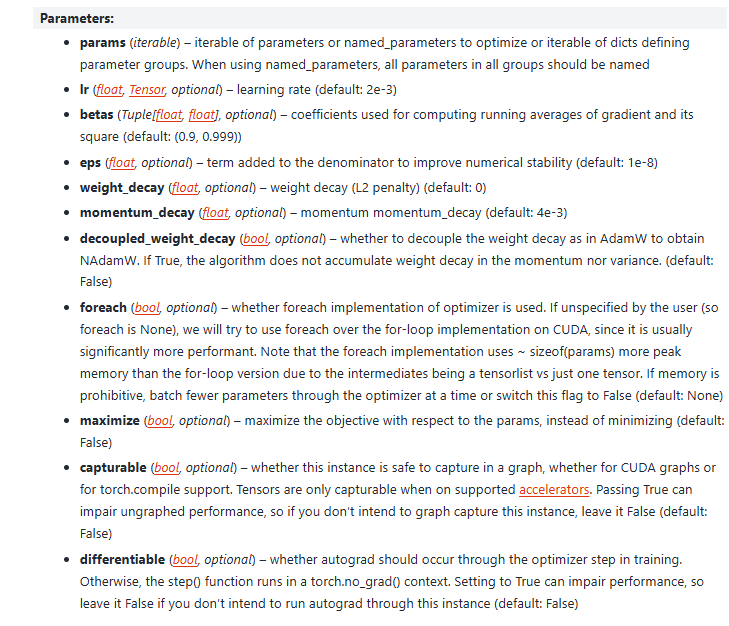

* ### **RAdam**

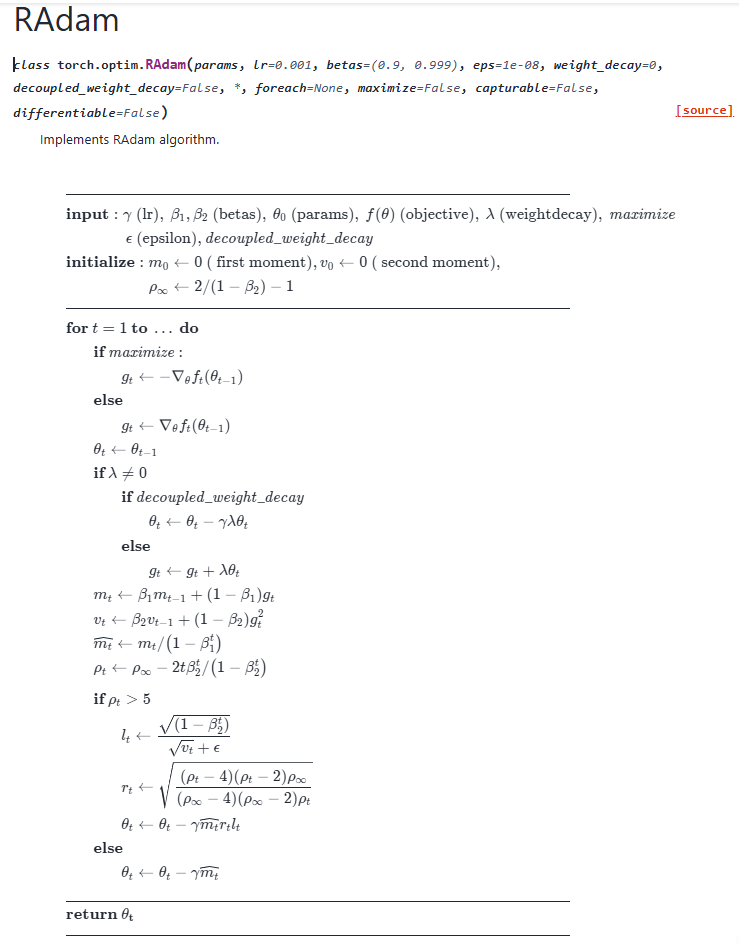

#### Params:

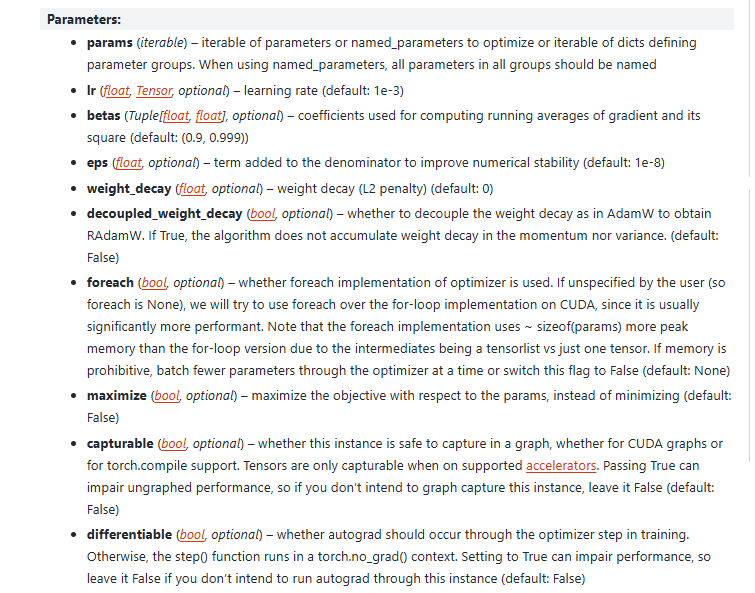

* ### **RMSprop**

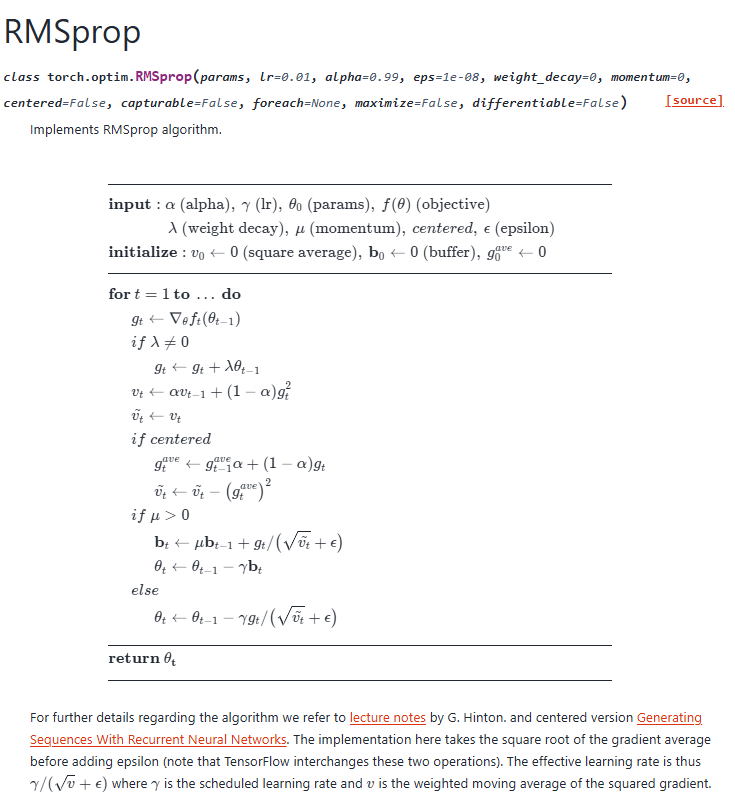

#### Params:

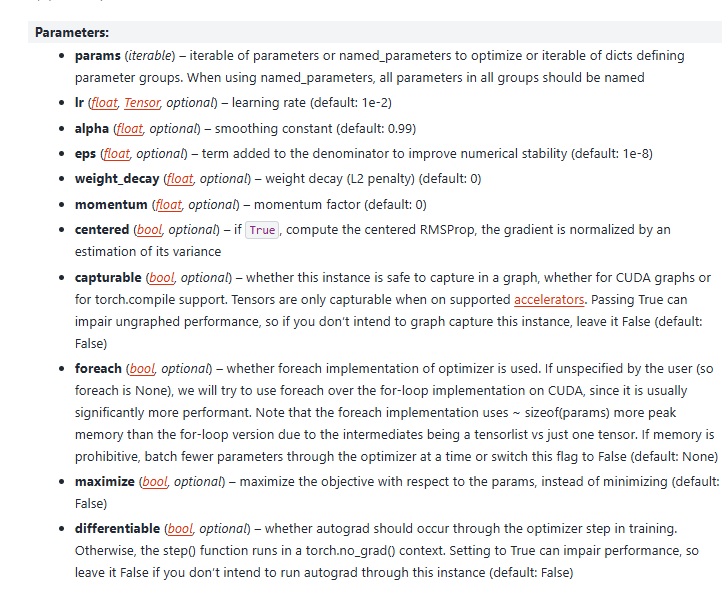

* ### **Rprop**

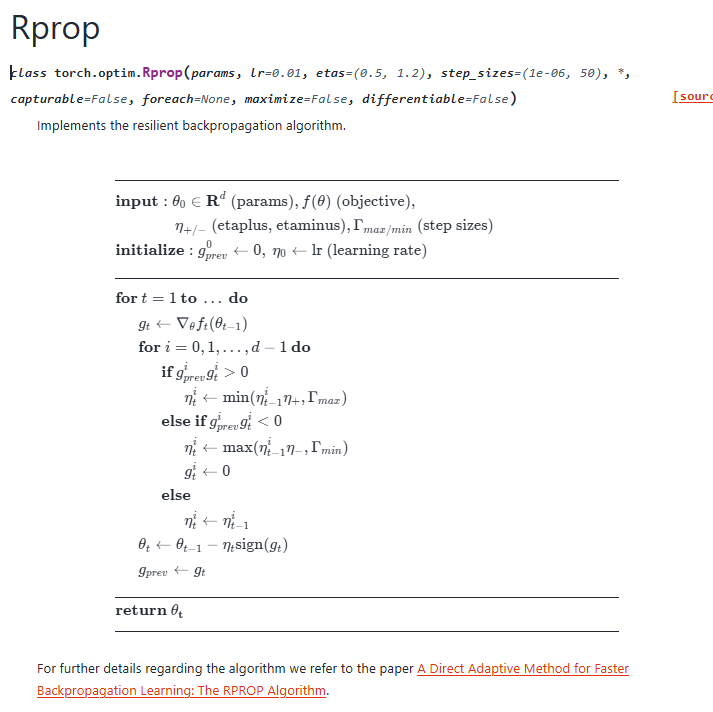

#### Params:

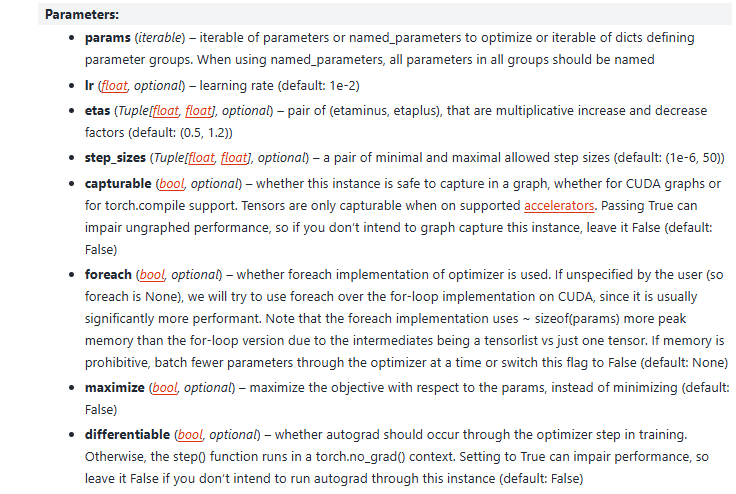

* ### **SGD**

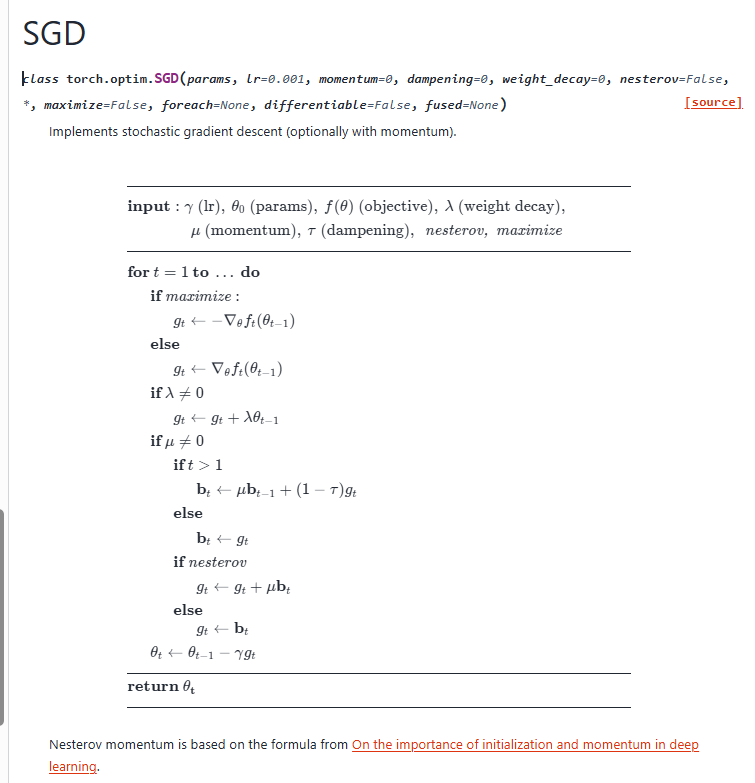

#### Params:

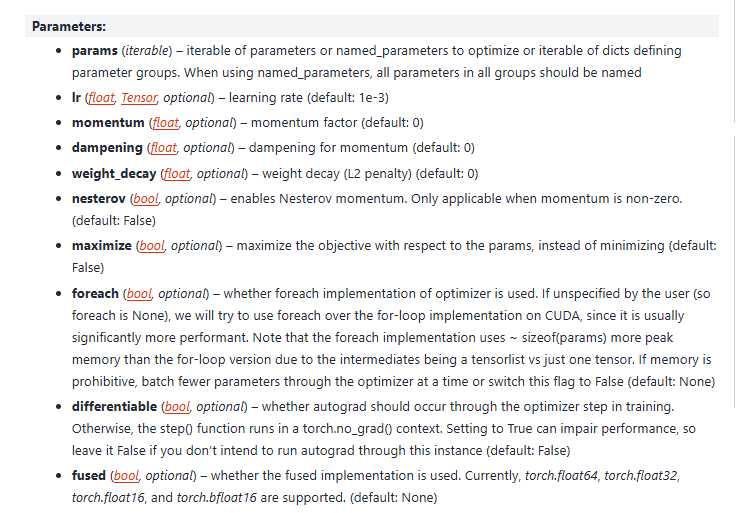

### **LOSS FUNCTIONS**

* ### **Triplet_margin_with_distance_loss**

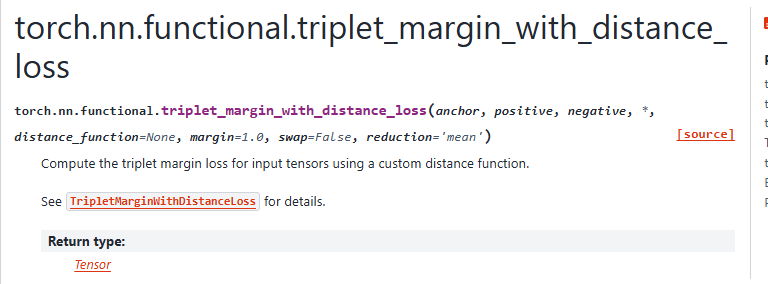

* ### **Triplet_margin_loss**

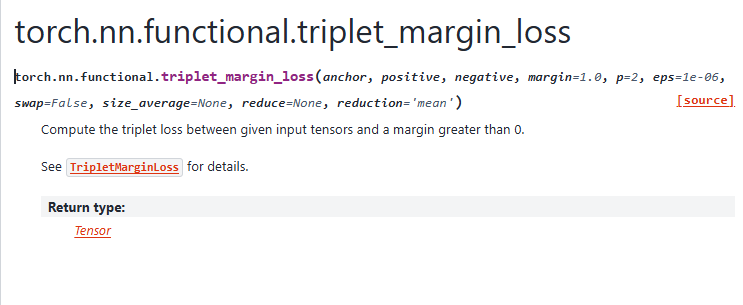

* ### **Soft_margin_loss**

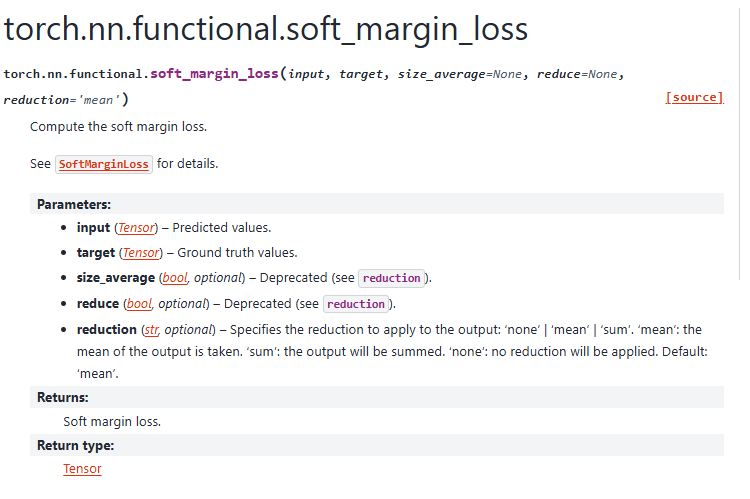

* ### **Smooth_l1_loss**

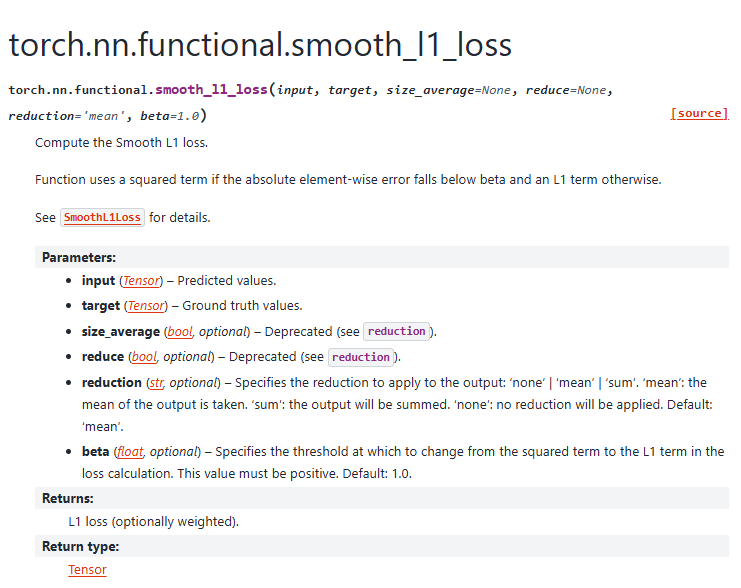

* ### **Huber_l1_loss**

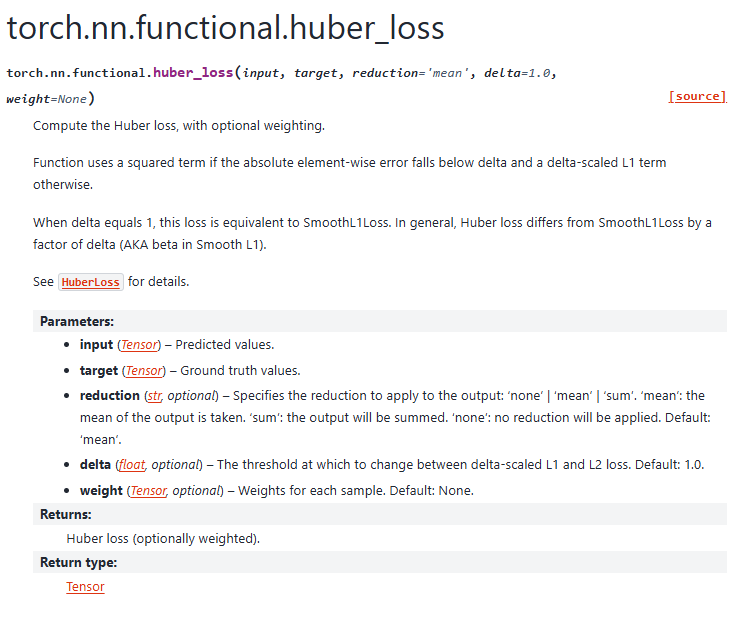

* ### **Nll_loss**

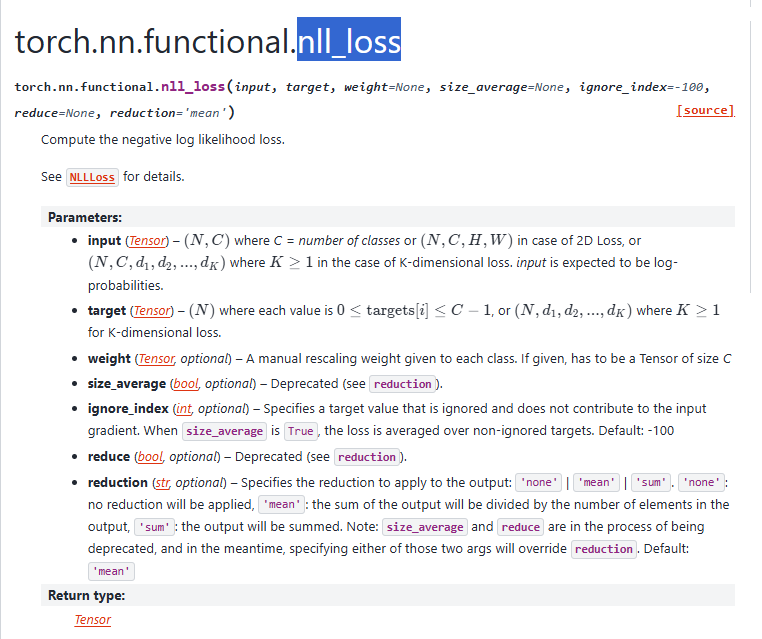

* ### **Multi_margin_loss**

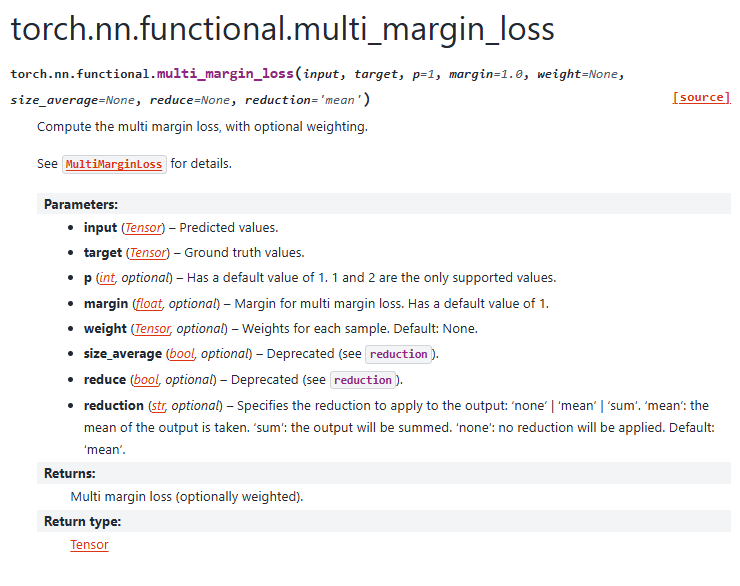

* ### **Multilabel_soft_margin_loss**

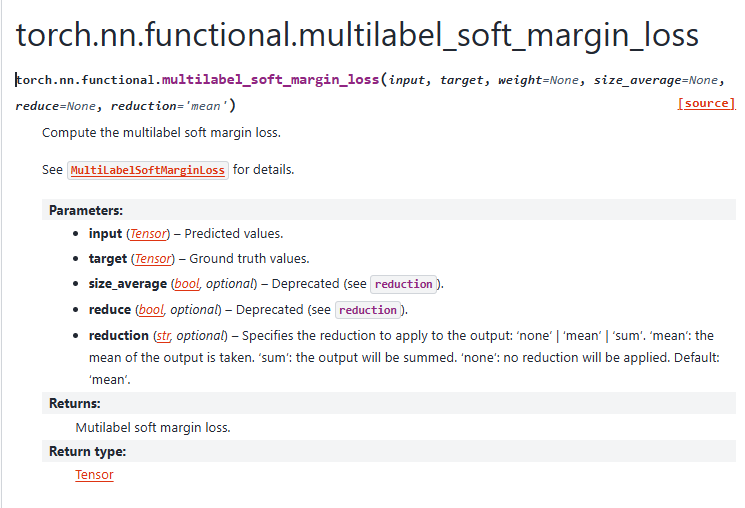

* ### **Multilabel_margin_loss**

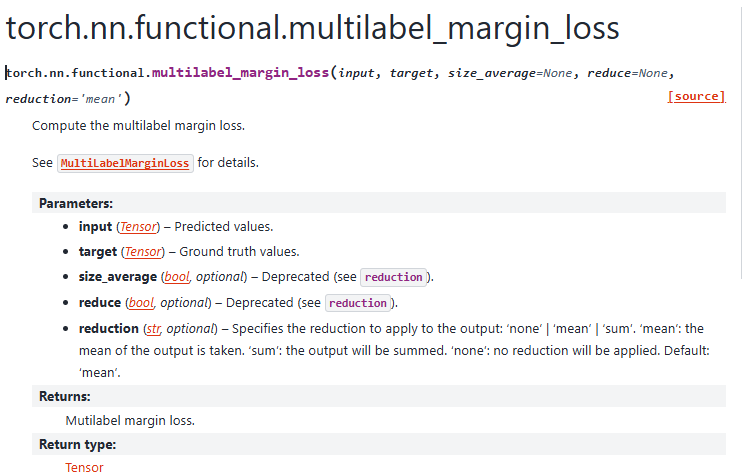

* ### **Margin_ranking_loss**

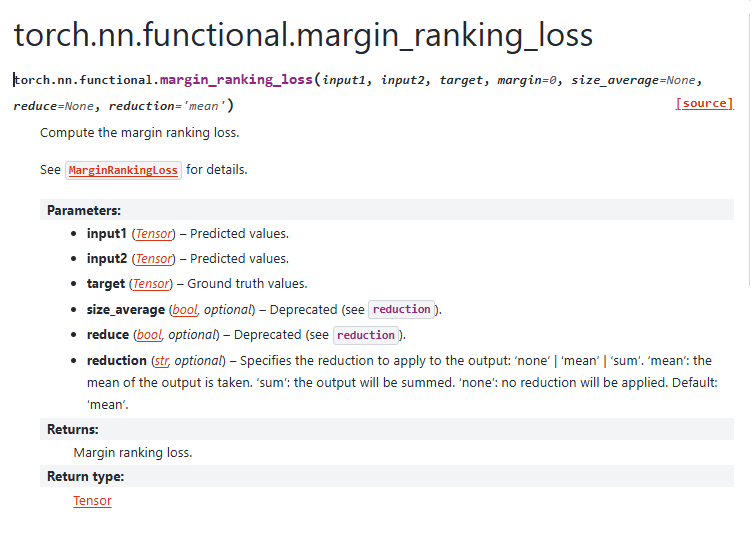

* ### **MSE_ranking_loss**

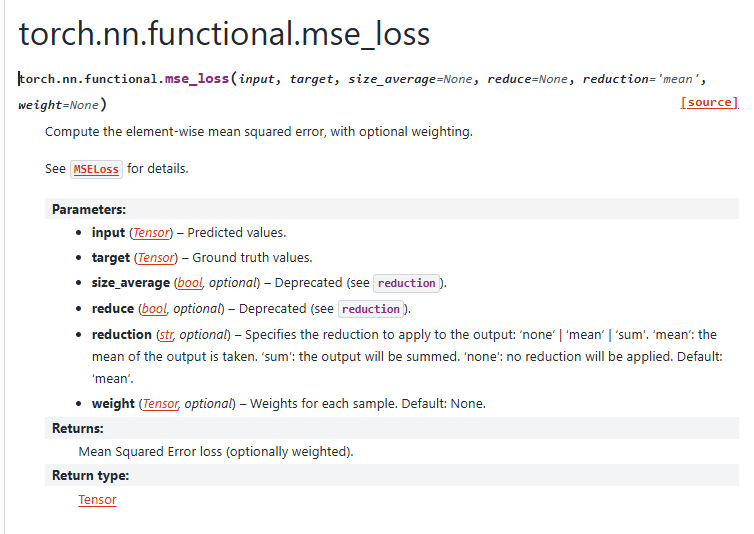

* ### **L1_loss**

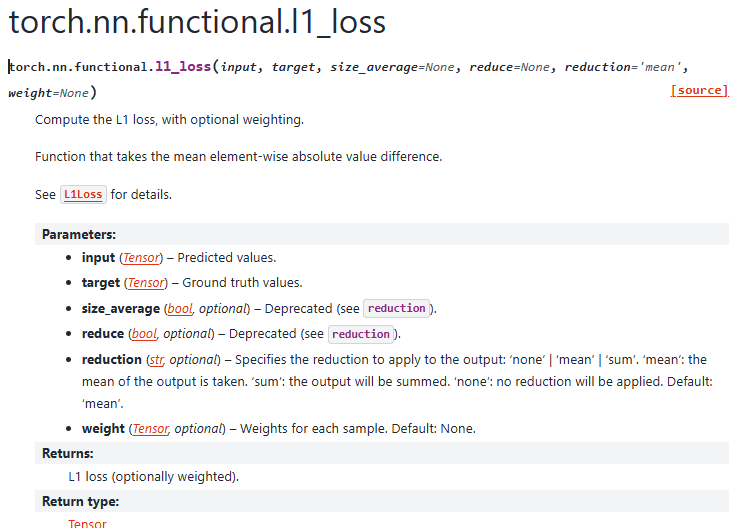

* ### **KL_Div_loss**

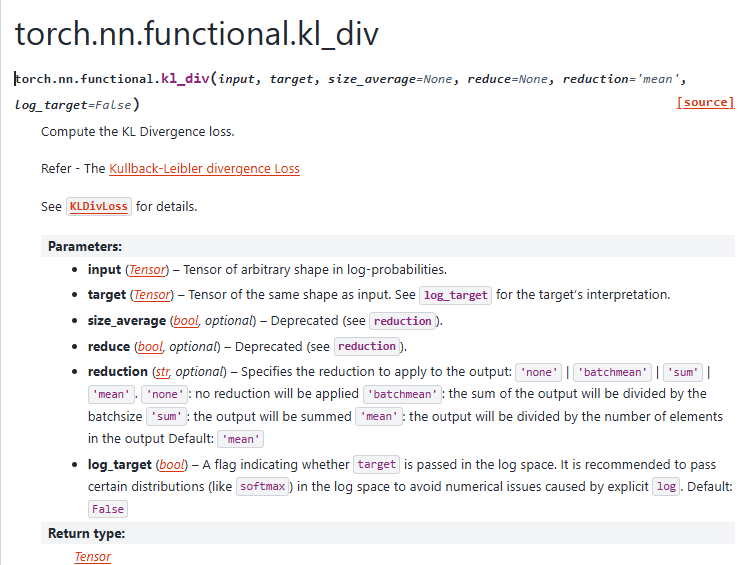

* ### **Hinge_Embedding_loss**

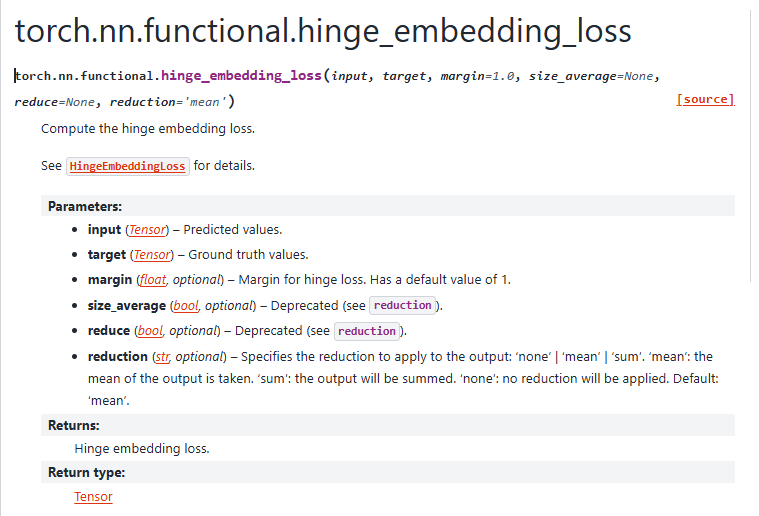

* ### **Gaussian_NLL_loss**

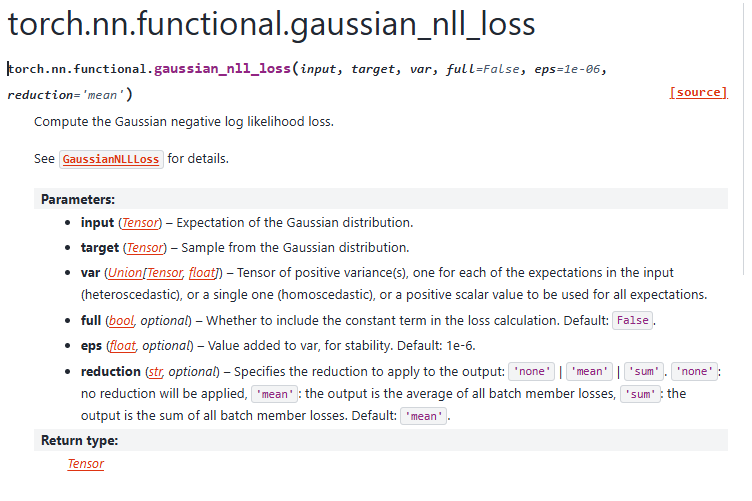

* ### **Cross_entropy_loss**

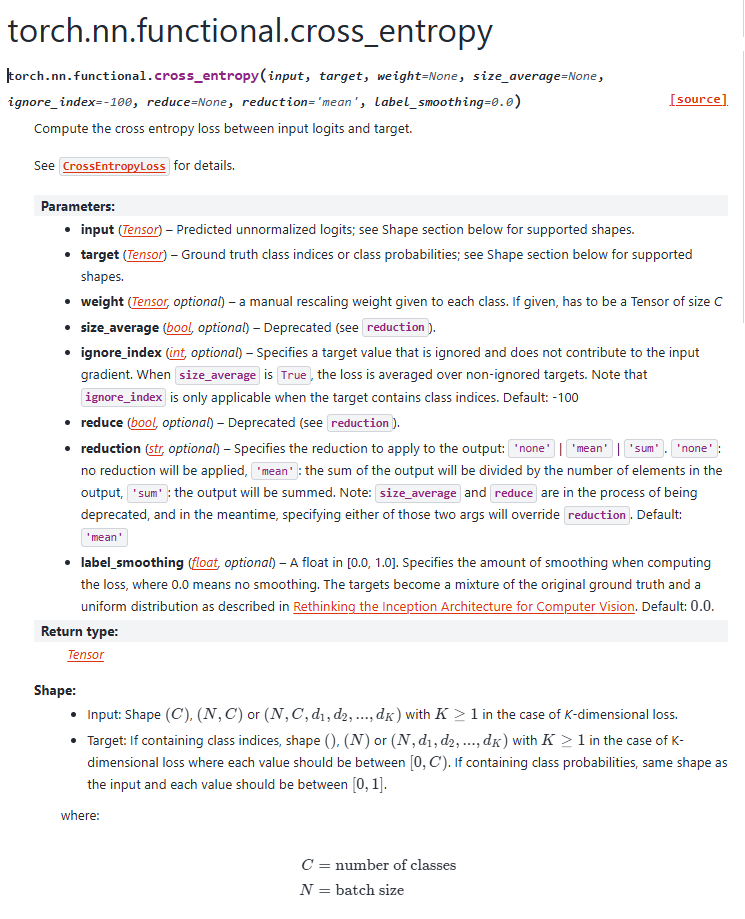

* ### **Cosine_Embedding_loss**

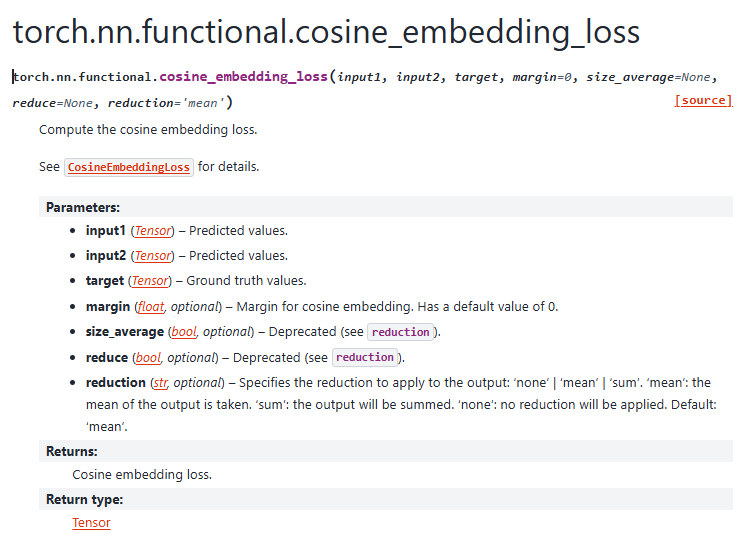

* ### **Poisson_NLL_loss**

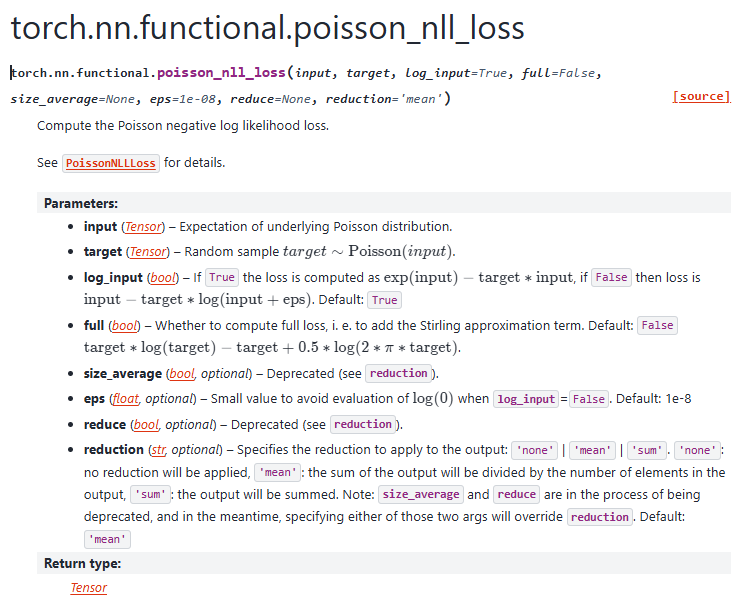

* ### **BCE_With_Logits**

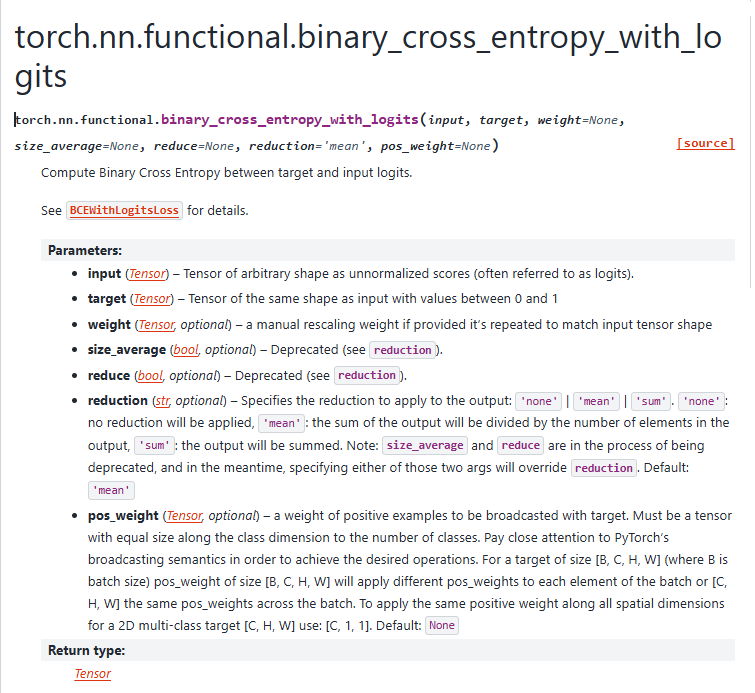

* ### **Binary_Cross_Entropy**

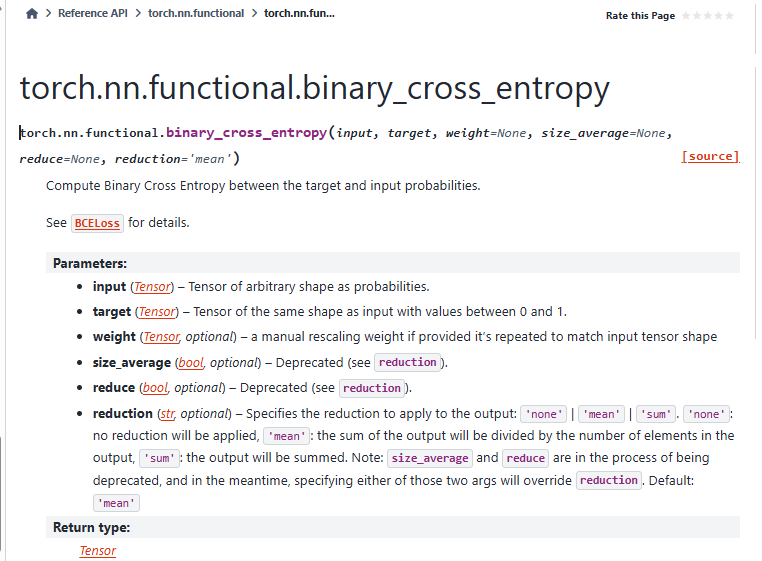

### **Functions for testing**

In [ ]:
def prepare_targets(loss_type,
                    loss_name,
                    target,
                    num_classes=10,
                    device='cuda'):
    """Подготовка таргетов для разных типов функций потерь"""
    batch_size = target.size(0)

    if loss_type == 'binary':
        # Для бинарной классификации создаем one-hot
        target_one_hot = torch.zeros(batch_size, num_classes).to(device)
        target_one_hot.scatter_(1, target.unsqueeze(1), 1.0)
        return target_one_hot

    elif loss_type == 'multilabel':
        # Для multilabel создаем one-hot encoding
        target_one_hot = torch.zeros(batch_size, num_classes).to(device)
        target_one_hot.scatter_(1, target.unsqueeze(1), 1.0)
        # Для MultiLabelMarginLoss нужен Long tensor с индексами
        if loss_name == 'MultiLabelMargin':
            return target_one_hot.long()
        return target_one_hot

    elif loss_type == 'regression':
        # Для регрессии создаем one-hot encoding
        target_one_hot = torch.zeros(batch_size, num_classes).to(device)
        target_one_hot.scatter_(1, target.unsqueeze(1), 1.0)
        return target_one_hot

    elif loss_type == 'special':
        if loss_name == 'PoissonNLL':
            # Для PoissonNLL нужны target той же формы, что и output
            target_expanded = torch.zeros(batch_size, num_classes).to(device)
            target_expanded.scatter_(1, target.unsqueeze(1), 1.0)
            return target_expanded

        elif loss_name == 'GaussianNLL':
            # Для GaussianNLL возвращаем кортеж (target, var)
            target_one_hot = torch.zeros(batch_size, num_classes).to(device)
            target_one_hot.scatter_(1, target.unsqueeze(1), 1.0)
            var = torch.ones(batch_size, num_classes).to(device) * 0.1
            return (target_one_hot, var)

        elif loss_name == 'KLDiv':
            # Для KLDiv нужны probabilities (не log!)
            target_probs = torch.zeros(batch_size, num_classes).to(device)
            target_probs.scatter_(1, target.unsqueeze(1), 1.0)
            return target_probs

        else:
            return target

    elif loss_type == 'embedding':
        return torch.ones(batch_size).to(device)

    elif loss_type == 'ranking':
        return torch.ones(batch_size).to(device)

    elif loss_type == 'triplet':
        return target

    else:  # classification
        return target

def prepare_output(loss_name, output, requires_sigmoid=False):
    """Подготовка выхода модели для разных функций потерь"""
    if requires_sigmoid:
        return torch.sigmoid(output)
    elif loss_name == 'NLLLoss':
        return F.log_softmax(output, dim=1)
    elif loss_name == 'KLDiv':
        return F.log_softmax(output, dim=1)
    elif loss_name == 'PoissonNLL':
        # Для PoissonNLL выход должен быть в логарифмическом масштабе и положительным
        return F.softmax(output, dim=1)  # или torch.exp(F.log_softmax(output, dim=1))
    else:
        return output

def setup_optimizer(optimizer_name, model_parameters):
    """Настройка оптимизатора"""
    config = optimizers_config[optimizer_name]
    return config['optimizer'](model_parameters, lr=config['lr'])

def weight_reset(m):
    """Сброс весов модели для нового эксперимента"""
    if isinstance(m, torch.nn.Conv2d) or isinstance(m, torch.nn.Linear):
        m.reset_parameters()

def plot_results(results):
    """Визуализация результатов всех экспериментов"""
    if not results:
        print("No results to plot")
        return

    fig, axes = plt.subplots(2, 2, figsize=(15, 10))

    # График тренировочных потерь
    for exp_name, result in results.items():
        train_losses = [float(loss) if torch.is_tensor(loss) else loss for loss in result['train_losses']]
        axes[0, 0].plot(train_losses, label=exp_name)
    axes[0, 0].set_title('Training Loss')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Loss')
    axes[0, 0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[0, 0].grid(True)

    # График тестовых потерь
    for exp_name, result in results.items():
        test_losses = [float(loss) if torch.is_tensor(loss) else loss for loss in result['test_losses']]
        axes[0, 1].plot(test_losses, label=exp_name)
    axes[0, 1].set_title('Test Loss')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('Loss')
    axes[0, 1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[0, 1].grid(True)

    # График точности
    for exp_name, result in results.items():
        if result['accuracies'] and result['accuracies'][0] > 0:  # Только где accuracy вычисляется
            accuracies = [float(acc) if torch.is_tensor(acc) else acc for acc in result['accuracies']]
            axes[1, 0].plot(accuracies, label=exp_name, alpha=0.7)
    axes[1, 0].set_title('Accuracy')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Accuracy (%)')
    axes[1, 0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[1, 0].grid(True, alpha=0.3)

    # Сравнение финальной точности
    names = []
    final_accs = []
    for name, result in results.items():
        if result['final_accuracy'] > 0:
            names.append(name)
            final_acc = float(result['final_accuracy']) if torch.is_tensor(result['final_accuracy']) else result['final_accuracy']
            final_accs.append(final_acc)

    if names:
        bars = axes[1, 1].barh(names, final_accs)
        axes[1, 1].set_title('Final Accuracy Comparison')
        axes[1, 1].set_xlabel('Accuracy (%)')

        # Добавляем значения на барчарт
        for bar, acc in zip(bars, final_accs):
            axes[1, 1].text(bar.get_width() + 0.5, bar.get_y() + bar.get_height()/2,
                           f'{acc:.2f}%', ha='left', va='center')

    plt.tight_layout()
    plt.show()

def experiment(optimizer_name, loss_name, epochs=10):
    """Проведение эксперимента с конкретным оптимизатором и функцией потерь"""
    print(f"\n{'='*60}")
    print(f"Experiment: {optimizer_name} + {loss_name}")
    print(f"{'='*60}")

    if loss_name in ['CosineEmbedding', 'MarginRanking', 'TripletMargin', 'TripletMarginWithDistance']:
        print(f"Skipping {loss_name} - not suitable for MNIST classification")
        return None

    model.apply(weight_reset)

    # Настраиваем оптимизатор и функцию потерь
    optimizer = setup_optimizer(optimizer_name, model.parameters())
    loss_config = loss_functions[loss_name]

    train_losses = []
    test_losses = []
    accuracies = []

    try:
        for epoch in range(1, epochs + 1):
            train_loss = train(epoch, optimizer, loss_config, loss_name)
            test_loss, accuracy = test(loss_config, loss_name)

            train_losses.append(train_loss)
            test_losses.append(test_loss)
            accuracies.append(accuracy)

        return {
            'train_losses': train_losses,
            'test_losses': test_losses,
            'accuracies': accuracies,
            'final_accuracy': accuracies[-1] if accuracies else 0
        }
    except Exception as e:
        print(f"Error in experiment {optimizer_name} + {loss_name}: {e}")
        return None

def run_Adam_experiments():
    results = {}

    test_combinations = [
    # Adam со всеми функциями потерь
    ('Adam', 'CrossEntropy'),
    ('Adam', 'NLLLoss'),

    # Бинарные и мультиклассовые
    ('Adam', 'BCEWithLogits'),
    ('Adam', 'MultiLabelSoftMargin'),

    # Регрессионные
    ('Adam', 'MSE'),
    ('Adam', 'L1'),

    ('Adam', 'MultiMargin'),
    ('Adam', 'Huber'),
    ('Adam', 'BCE'),
    ('Adam', 'MultiLabelMargin'),
    ('Adam', 'SmoothL1'),
    ('Adam', 'PoissonNLL'),
    ('Adam', 'GaussianNLL'),
    ('Adam', 'KLDiv'),
    ('Adam', 'CosineEmbedding'),
    ('Adam', 'HingeEmbedding'),
    ('Adam', 'MarginRanking'),
    ('Adam', 'SoftMargin'),
    ('Adam', 'TripletMargin'),
    ('Adam', 'TripletMarginWithDistance'),
]

    for optimizer_name, loss_name in test_combinations:
        exp_name = f"{optimizer_name}_{loss_name}"
        result = experiment(optimizer_name, loss_name, epochs=20)
        if result is not None:
            results[exp_name] = result

    return results

def run_AdamW_experiments():
    results = {}

    test_combinations = [
    # AdamW со всеми функциями потерь
    ('AdamW', 'CrossEntropy'),
    ('AdamW', 'NLLLoss'),
    ('AdamW', 'BCE'),
    ('AdamW', 'BCEWithLogits'),
    ('AdamW', 'MultiLabelMargin'),
    ('AdamW', 'MultiLabelSoftMargin'),
    ('AdamW', 'MSE'),
    ('AdamW', 'L1'),
    ('AdamW', 'SmoothL1'),
    ('AdamW', 'Huber'),
    ('AdamW', 'PoissonNLL'),
    ('AdamW', 'GaussianNLL'),
    ('AdamW', 'KLDiv'),
    ('AdamW', 'CosineEmbedding'),
    ('AdamW', 'HingeEmbedding'),
    ('AdamW', 'MarginRanking'),
    ('AdamW', 'MultiMargin'),
    ('AdamW', 'SoftMargin'),
    ('AdamW', 'TripletMargin'),
    ('AdamW', 'TripletMarginWithDistance'),
]

    for optimizer_name, loss_name in test_combinations:
        exp_name = f"{optimizer_name}_{loss_name}"
        result = experiment(optimizer_name, loss_name, epochs=20)
        if result is not None:
            results[exp_name] = result

    return results

def run_SGD_experiments():
    results = {}
    test_combinations = [
     # SGD со всеми функциями потерь
    ('SGD', 'CrossEntropy'),
    ('SGD', 'NLLLoss'),
    ('SGD', 'BCE'),
    ('SGD', 'BCEWithLogits'),
    ('SGD', 'MultiLabelMargin'),
    ('SGD', 'MultiLabelSoftMargin'),
    ('SGD', 'MSE'),
    ('SGD', 'L1'),
    ('SGD', 'SmoothL1'),
    ('SGD', 'Huber'),
    ('SGD', 'PoissonNLL'),
    ('SGD', 'GaussianNLL'),
    ('SGD', 'KLDiv'),
    ('SGD', 'CosineEmbedding'),
    ('SGD', 'HingeEmbedding'),
    ('SGD', 'MarginRanking'),
    ('SGD', 'MultiMargin'),
    ('SGD', 'SoftMargin'),
    ('SGD', 'TripletMargin'),
    ('SGD', 'TripletMarginWithDistance'),
]

    for optimizer_name, loss_name in test_combinations:
        exp_name = f"{optimizer_name}_{loss_name}"
        result = experiment(optimizer_name, loss_name, epochs=20)
        if result is not None:
            results[exp_name] = result

    return results

def run_RMSprop_experiments():
    results = {}
    test_combinations = [
    # RMSprop со всеми функциями потерь
    ('RMSprop', 'CrossEntropy'),
    ('RMSprop', 'NLLLoss'),
    ('RMSprop', 'BCE'),
    ('RMSprop', 'BCEWithLogits'),
    ('RMSprop', 'MultiLabelMargin'),
    ('RMSprop', 'MultiLabelSoftMargin'),
    ('RMSprop', 'MSE'),
    ('RMSprop', 'L1'),
    ('RMSprop', 'SmoothL1'),
    ('RMSprop', 'Huber'),
    ('RMSprop', 'PoissonNLL'),
    ('RMSprop', 'GaussianNLL'),
    ('RMSprop', 'KLDiv'),
    ('RMSprop', 'CosineEmbedding'),
    ('RMSprop', 'HingeEmbedding'),
    ('RMSprop', 'MarginRanking'),
    ('RMSprop', 'MultiMargin'),
    ('RMSprop', 'SoftMargin'),
    ('RMSprop', 'TripletMargin'),
    ('RMSprop', 'TripletMarginWithDistance'),
]

    for optimizer_name, loss_name in test_combinations:
        exp_name = f"{optimizer_name}_{loss_name}"
        result = experiment(optimizer_name, loss_name, epochs=20)
        if result is not None:
            results[exp_name] = result

    return results

def run_Rprop_experiments():
    results = {}
    test_combinations = [
    # Rprop со всеми функциями потерь
    ('Rprop', 'CrossEntropy'),
    ('Rprop', 'NLLLoss'),
    ('Rprop', 'BCE'),
    ('Rprop', 'BCEWithLogits'),
    ('Rprop', 'MultiLabelMargin'),
    ('Rprop', 'MultiLabelSoftMargin'),
    ('Rprop', 'MSE'),
    ('Rprop', 'L1'),
    ('Rprop', 'SmoothL1'),
    ('Rprop', 'Huber'),
    ('Rprop', 'PoissonNLL'),
    ('Rprop', 'GaussianNLL'),
    ('Rprop', 'KLDiv'),
    ('Rprop', 'CosineEmbedding'),
    ('Rprop', 'HingeEmbedding'),
    ('Rprop', 'MarginRanking'),
    ('Rprop', 'MultiMargin'),
    ('Rprop', 'SoftMargin'),
    ('Rprop', 'TripletMargin'),
    ('Rprop', 'TripletMarginWithDistance'),
]

    for optimizer_name, loss_name in test_combinations:
        exp_name = f"{optimizer_name}_{loss_name}"
        result = experiment(optimizer_name, loss_name, epochs=20)
        if result is not None:
            results[exp_name] = result

    return results

def run_Adagrad_experiments():
    results = {}
    test_combinations = [
    # Adagrad со всеми функциями потерь
    ('Adagrad', 'CrossEntropy'),
    ('Adagrad', 'NLLLoss'),
    ('Adagrad', 'BCE'),
    ('Adagrad', 'BCEWithLogits'),
    ('Adagrad', 'MultiLabelMargin'),
    ('Adagrad', 'MultiLabelSoftMargin'),
    ('Adagrad', 'MSE'),
    ('Adagrad', 'L1'),
    ('Adagrad', 'SmoothL1'),
    ('Adagrad', 'Huber'),
    ('Adagrad', 'PoissonNLL'),
    ('Adagrad', 'GaussianNLL'),
    ('Adagrad', 'KLDiv'),
    ('Adagrad', 'CosineEmbedding'),
    ('Adagrad', 'HingeEmbedding'),
    ('Adagrad', 'MarginRanking'),
    ('Adagrad', 'MultiMargin'),
    ('Adagrad', 'SoftMargin'),
    ('Adagrad', 'TripletMargin'),
    ('Adagrad', 'TripletMarginWithDistance'),
]

    for optimizer_name, loss_name in test_combinations:
        exp_name = f"{optimizer_name}_{loss_name}"
        result = experiment(optimizer_name, loss_name, epochs=20)
        if result is not None:
            results[exp_name] = result

    return results

def run_Adadelta_experiments():
    results = {}
    test_combinations = [
    # Adadelta со всеми функциями потерь
    ('Adadelta', 'CrossEntropy'),
    ('Adadelta', 'NLLLoss'),
    ('Adadelta', 'BCE'),
    ('Adadelta', 'BCEWithLogits'),
    ('Adadelta', 'MultiLabelMargin'),
    ('Adadelta', 'MultiLabelSoftMargin'),
    ('Adadelta', 'MSE'),
    ('Adadelta', 'L1'),
    ('Adadelta', 'SmoothL1'),
    ('Adadelta', 'Huber'),
    ('Adadelta', 'PoissonNLL'),
    ('Adadelta', 'GaussianNLL'),
    ('Adadelta', 'KLDiv'),
    ('Adadelta', 'CosineEmbedding'),
    ('Adadelta', 'HingeEmbedding'),
    ('Adadelta', 'MarginRanking'),
    ('Adadelta', 'MultiMargin'),
    ('Adadelta', 'SoftMargin'),
    ('Adadelta', 'TripletMargin'),
    ('Adadelta', 'TripletMarginWithDistance'),
]

    for optimizer_name, loss_name in test_combinations:
        exp_name = f"{optimizer_name}_{loss_name}"
        result = experiment(optimizer_name, loss_name, epochs=20)
        if result is not None:
            results[exp_name] = result

    return results

def run_NAdam_experiments():
    results = {}
    test_combinations = [
    # NAdam со всеми функциями потерь
    ('NAdam', 'CrossEntropy'),
    ('NAdam', 'NLLLoss'),
    ('NAdam', 'BCE'),
    ('NAdam', 'BCEWithLogits'),
    ('NAdam', 'MultiLabelMargin'),
    ('NAdam', 'MultiLabelSoftMargin'),
    ('NAdam', 'MSE'),
    ('NAdam', 'L1'),
    ('NAdam', 'SmoothL1'),
    ('NAdam', 'Huber'),
    ('NAdam', 'PoissonNLL'),
    ('NAdam', 'GaussianNLL'),
    ('NAdam', 'KLDiv'),
    ('NAdam', 'CosineEmbedding'),
    ('NAdam', 'HingeEmbedding'),
    ('NAdam', 'MarginRanking'),
    ('NAdam', 'MultiMargin'),
    ('NAdam', 'SoftMargin'),
    ('NAdam', 'TripletMargin'),
    ('NAdam', 'TripletMarginWithDistance'),
]

    for optimizer_name, loss_name in test_combinations:
        exp_name = f"{optimizer_name}_{loss_name}"
        result = experiment(optimizer_name, loss_name, epochs=20)
        if result is not None:
            results[exp_name] = result

    return results

def run_RAdam_experiments():
    results = {}
    test_combinations = [
    # RAdam со всеми функциями потерь
    ('RAdam', 'CrossEntropy'),
    ('RAdam', 'NLLLoss'),
    ('RAdam', 'BCE'),
    ('RAdam', 'BCEWithLogits'),
    ('RAdam', 'MultiLabelMargin'),
    ('RAdam', 'MultiLabelSoftMargin'),
    ('RAdam', 'MSE'),
    ('RAdam', 'L1'),
    ('RAdam', 'SmoothL1'),
    ('RAdam', 'Huber'),
    ('RAdam', 'PoissonNLL'),
    ('RAdam', 'GaussianNLL'),
    ('RAdam', 'KLDiv'),
    ('RAdam', 'CosineEmbedding'),
    ('RAdam', 'HingeEmbedding'),
    ('RAdam', 'MarginRanking'),
    ('RAdam', 'MultiMargin'),
    ('RAdam', 'SoftMargin'),
    ('RAdam', 'TripletMargin'),
    ('RAdam', 'TripletMarginWithDistance'),
]

    for optimizer_name, loss_name in test_combinations:
        exp_name = f"{optimizer_name}_{loss_name}"
        result = experiment(optimizer_name, loss_name, epochs=20)
        if result is not None:
            results[exp_name] = result

    return results

def run_LBFGS_experiments():
    results = {}
    test_combinations = [
    # LBFGS со всеми функциями потерь
    ('LBFGS', 'CrossEntropy'),
    ('LBFGS', 'NLLLoss'),
    ('LBFGS', 'BCE'),
    ('LBFGS', 'BCEWithLogits'),
    ('LBFGS', 'MultiLabelMargin'),
    ('LBFGS', 'MultiLabelSoftMargin'),
    ('LBFGS', 'MSE'),
    ('LBFGS', 'L1'),
    ('LBFGS', 'SmoothL1'),
    ('LBFGS', 'Huber'),
    ('LBFGS', 'PoissonNLL'),
    ('LBFGS', 'GaussianNLL'),
    ('LBFGS', 'KLDiv'),
    ('LBFGS', 'CosineEmbedding'),
    ('LBFGS', 'HingeEmbedding'),
    ('LBFGS', 'MarginRanking'),
    ('LBFGS', 'MultiMargin'),
    ('LBFGS', 'SoftMargin'),
    ('LBFGS', 'TripletMargin'),
    ('LBFGS', 'TripletMarginWithDistance'),
]

    for optimizer_name, loss_name in test_combinations:
        exp_name = f"{optimizer_name}_{loss_name}"
        result = experiment(optimizer_name, loss_name, epochs=20)
        if result is not None:
            results[exp_name] = result

    return results

def run_ASGD_experiments():
    results = {}
    test_combinations = [
    # ASGD со всеми функциями потерь
    ('ASGD', 'CrossEntropy'),
    ('ASGD', 'NLLLoss'),
    ('ASGD', 'BCE'),
    ('ASGD', 'BCEWithLogits'),
    ('ASGD', 'MultiLabelMargin'),
    ('ASGD', 'MultiLabelSoftMargin'),
    ('ASGD', 'MSE'),
    ('ASGD', 'L1'),
    ('ASGD', 'SmoothL1'),
    ('ASGD', 'Huber'),
    ('ASGD', 'PoissonNLL'),
    ('ASGD', 'GaussianNLL'),
    ('ASGD', 'KLDiv'),
    ('ASGD', 'CosineEmbedding'),
    ('ASGD', 'HingeEmbedding'),
    ('ASGD', 'MarginRanking'),
    ('ASGD', 'MultiMargin'),
    ('ASGD', 'SoftMargin'),
    ('ASGD', 'TripletMargin'),
    ('ASGD', 'TripletMarginWithDistance'),
]

    for optimizer_name, loss_name in test_combinations:
        exp_name = f"{optimizer_name}_{loss_name}"
        result = experiment(optimizer_name, loss_name, epochs=20)
        if result is not None:
            results[exp_name] = result

    return results

def run_Adamax_experiments():
    results = {}
    test_combinations = [
    # Adamax со всеми функциями потерь
    ('Adamax', 'CrossEntropy'),
    ('Adamax', 'NLLLoss'),
    ('Adamax', 'BCE'),
    ('Adamax', 'BCEWithLogits'),
    ('Adamax', 'MultiLabelMargin'),
    ('Adamax', 'MultiLabelSoftMargin'),
    ('Adamax', 'MSE'),
    ('Adamax', 'L1'),
    ('Adamax', 'SmoothL1'),
    ('Adamax', 'Huber'),
    ('Adamax', 'PoissonNLL'),
    ('Adamax', 'GaussianNLL'),
    ('Adamax', 'KLDiv'),
    ('Adamax', 'CosineEmbedding'),
    ('Adamax', 'HingeEmbedding'),
    ('Adamax', 'MarginRanking'),
    ('Adamax', 'MultiMargin'),
    ('Adamax', 'SoftMargin'),
    ('Adamax', 'TripletMargin'),
    ('Adamax', 'TripletMarginWithDistance'),
]

    for optimizer_name, loss_name in test_combinations:
        exp_name = f"{optimizer_name}_{loss_name}"
        result = experiment(optimizer_name, loss_name, epochs=20)
        if result is not None:
            results[exp_name] = result

    return results

def run_SparseAdam_experiments():
    results = {}
    test_combinations = [
    # SparseAdam со всеми функциями потерь
    ('SparseAdam', 'CrossEntropy'),
    ('SparseAdam', 'NLLLoss'),
    ('SparseAdam', 'BCE'),
    ('SparseAdam', 'BCEWithLogits'),
    ('SparseAdam', 'MultiLabelMargin'),
    ('SparseAdam', 'MultiLabelSoftMargin'),
    ('SparseAdam', 'MSE'),
    ('SparseAdam', 'L1'),
    ('SparseAdam', 'SmoothL1'),
    ('SparseAdam', 'Huber'),
    ('SparseAdam', 'PoissonNLL'),
    ('SparseAdam', 'GaussianNLL'),
    ('SparseAdam', 'KLDiv'),
    ('SparseAdam', 'CosineEmbedding'),
    ('SparseAdam', 'HingeEmbedding'),
    ('SparseAdam', 'MarginRanking'),
    ('SparseAdam', 'MultiMargin'),
    ('SparseAdam', 'SoftMargin'),
    ('SparseAdam', 'TripletMargin'),
    ('SparseAdam', 'TripletMarginWithDistance'),
]

    for optimizer_name, loss_name in test_combinations:
        exp_name = f"{optimizer_name}_{loss_name}"
        result = experiment(optimizer_name, loss_name, epochs=20)
        if result is not None:
            results[exp_name] = result

    return results

def run_Adafactor_experiments():
    results = {}
    test_combinations = [
    # Adafactor со всеми функциями потерь
    ('Adafactor', 'CrossEntropy'),
    ('Adafactor', 'NLLLoss'),
    ('Adafactor', 'BCE'),
    ('Adafactor', 'BCEWithLogits'),
    ('Adafactor', 'MultiLabelMargin'),
    ('Adafactor', 'MultiLabelSoftMargin'),
    ('Adafactor', 'MSE'),
    ('Adafactor', 'L1'),
    ('Adafactor', 'SmoothL1'),
    ('Adafactor', 'Huber'),
    ('Adafactor', 'PoissonNLL'),
    ('Adafactor', 'GaussianNLL'),
    ('Adafactor', 'KLDiv'),
    ('Adafactor', 'CosineEmbedding'),
    ('Adafactor', 'HingeEmbedding'),
    ('Adafactor', 'MarginRanking'),
    ('Adafactor', 'MultiMargin'),
    ('Adafactor', 'SoftMargin'),
    ('Adafactor', 'TripletMargin'),
    ('Adafactor', 'TripletMarginWithDistance'),
]

    for optimizer_name, loss_name in test_combinations:
        exp_name = f"{optimizer_name}_{loss_name}"
        result = experiment(optimizer_name, loss_name, epochs=20)
        if result is not None:
            results[exp_name] = result

    return results


### **Using the SGD algorithm**

In [ ]:
optimizer = optim.SGD(model.parameters(), lr=0.01) # May try another optimizers, like Adadelta, Adafactor, Adagrad, Adam, AdamW, SparseAdam,  Adamax, Averaged Stochastic Gradient Descent, L-BFGS,
# Muon, NAdam, RAdam, RMSprop, Rprop


def train(epoch):
    model.train()
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)

        optimizer.zero_grad()
        output = model(data)
        loss = F.nll_loss(output, target) # Basic negative log likelihood los
        loss.backward()
        optimizer.step()
        if batch_idx % 500 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))
#
# A simple test procedure to measure the STN performances on MNIST.
#


def test():
    with torch.no_grad():
        model.eval()
        test_loss = 0
        correct = 0
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)

            # sum up batch loss
            test_loss += F.nll_loss(output, target, size_average=False).item()
            # get the index of the max log-probability
            pred = output.max(1, keepdim=True)[1]
            correct += pred.eq(target.view_as(pred)).sum().item()

        test_loss /= len(test_loader.dataset)
        print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'
              .format(test_loss, correct, len(test_loader.dataset),
                      100. * correct / len(test_loader.dataset)))

## **Visualizing the STN results**

In [ ]:
def convert_image_np(inp):
    """Convert a Tensor to numpy image."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    return inp

# We want to visualize the output of the spatial transformers layer
# after the training, we visualize a batch of input images and
# the corresponding transformed batch using STN.


def visualize_stn():
    with torch.no_grad():
        # Get a batch of training data
        data = next(iter(test_loader))[0].to(device)

        input_tensor = data.cpu()
        transformed_input_tensor = model.stn(data).cpu()

        in_grid = convert_image_np(
            torchvision.utils.make_grid(input_tensor))

        out_grid = convert_image_np(
            torchvision.utils.make_grid(transformed_input_tensor))

        # Plot the results side-by-side
        f, axarr = plt.subplots(1, 2)
        axarr[0].imshow(in_grid)
        axarr[0].set_title('Dataset Images')

        axarr[1].imshow(out_grid)
        axarr[1].set_title('Transformed Images')

### **Original Tutorial results**

/usr/local/lib/python3.12/dist-packages/torch/nn/functional.py:5163: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/functional.py:5096: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


Train Epoch: 1 [0/60000 (0%)]	Loss: 2.291930
Train Epoch: 1 [32000/60000 (53%)]	Loss: 0.746539


/usr/local/lib/python3.12/dist-packages/torch/nn/_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Average loss: 0.2230, Accuracy: 9359/10000 (94%)

Train Epoch: 2 [0/60000 (0%)]	Loss: 0.275349
Train Epoch: 2 [32000/60000 (53%)]	Loss: 0.420153

Test set: Average loss: 0.1297, Accuracy: 9603/10000 (96%)

Train Epoch: 3 [0/60000 (0%)]	Loss: 0.301525
Train Epoch: 3 [32000/60000 (53%)]	Loss: 0.261023

Test set: Average loss: 0.0790, Accuracy: 9761/10000 (98%)

Train Epoch: 4 [0/60000 (0%)]	Loss: 0.491598
Train Epoch: 4 [32000/60000 (53%)]	Loss: 0.227666

Test set: Average loss: 0.0746, Accuracy: 9760/10000 (98%)

Train Epoch: 5 [0/60000 (0%)]	Loss: 0.164931
Train Epoch: 5 [32000/60000 (53%)]	Loss: 0.124880

Test set: Average loss: 0.0687, Accuracy: 9797/10000 (98%)

Train Epoch: 6 [0/60000 (0%)]	Loss: 0.117111
Train Epoch: 6 [32000/60000 (53%)]	Loss: 0.096872

Test set: Average loss: 0.0587, Accuracy: 9819/10000 (98%)

Train Epoch: 7 [0/60000 (0%)]	Loss: 0.098487
Train Epoch: 7 [32000/60000 (53%)]	Loss: 0.121896

Test set: Average loss: 0.0593, Accuracy: 9828/10000 (98%)

Tra

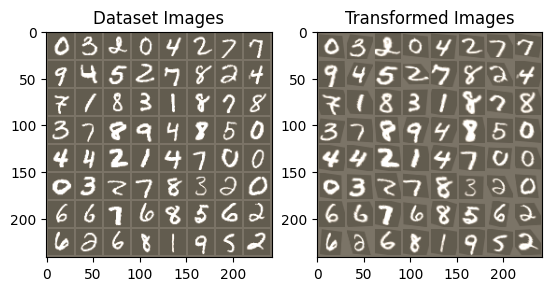

In [ ]:
for epoch in range(1, 20 + 1):
    train(epoch)
    test()

# Visualize the STN transformation on some input batch
visualize_stn()

plt.ioff()
plt.show()

### **Tutorial** - loss using optim.SGD and F.nll_loss: 0.0425, Accuracy: 98.74%.

### **Updated train and test functions for testing**

In [ ]:
def train(epoch, optimizer, loss_config, loss_name):
    model.train()
    total_loss = 0
    loss_func = loss_config['func']
    loss_type = loss_config['type']
    requires_sigmoid = loss_config.get('requires_sigmoid', False)

    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)

        optimizer.zero_grad()
        output = model(data)

        # Подготавливаем выход модели
        processed_output = prepare_output(loss_name, output, requires_sigmoid)

        # Подготавливаем таргеты
        processed_target = prepare_targets(loss_type, loss_name, target, device=device)

        # Вычисляем loss в зависимости от типа
        if loss_type == 'embedding':
            loss = loss_func(processed_output, processed_output, processed_target)
        elif loss_type == 'ranking':
            loss = loss_func(processed_output, processed_output - 0.1, processed_target)
        elif loss_type == 'triplet':
            loss = loss_func(processed_output, processed_output, processed_output - 0.1)
        elif loss_name == 'KLDiv':
            # KLDiv ожидает log probabilities на входе и probabilities как target
            loss = loss_func(processed_output, processed_target)
        elif loss_name == 'PoissonNLL':
            # PoissonNLL: output должен быть log(expected), target - expected
            loss = loss_func(processed_output, processed_target)
        elif loss_name == 'GaussianNLL':
            # GaussianNLL: (output, target, var)
            target_tensor, var_tensor = processed_target
            loss = loss_func(processed_output, target_tensor, var_tensor)
        else:
            loss = loss_func(processed_output, processed_target)

        loss.backward()
        optimizer.step()
        total_loss += loss.item()

        if batch_idx % 500 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))

    return total_loss / len(train_loader)

def test(loss_config, loss_name):
    with torch.no_grad():
        model.eval()
        test_loss = 0
        correct = 0
        loss_func = loss_config['func']
        loss_type = loss_config['type']
        requires_sigmoid = loss_config.get('requires_sigmoid', False)

        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)

            # Подготавливаем выход модели
            processed_output = prepare_output(loss_name, output, requires_sigmoid)

            # Подготавливаем таргеты (передаем loss_name!)
            processed_target = prepare_targets(loss_type, loss_name, target, device=device)

            # Вычисляем loss
            if loss_type == 'embedding':
                batch_loss = loss_func(processed_output, processed_output, processed_target)
            elif loss_type == 'ranking':
                batch_loss = loss_func(processed_output, processed_output - 0.1, processed_target)
            elif loss_type == 'triplet':
                batch_loss = loss_func(processed_output, processed_output, processed_output - 0.1)
            elif loss_name == 'KLDiv':
                batch_loss = loss_func(processed_output, processed_target)
            elif loss_name == 'PoissonNLL':
                batch_loss = loss_func(processed_output, processed_target)
            elif loss_name == 'GaussianNLL':
                target_tensor, var_tensor = processed_target
                batch_loss = loss_func(processed_output, target_tensor, var_tensor)
            else:
                batch_loss = loss_func(processed_output, processed_target, reduction='sum')

            test_loss += batch_loss.item()

            # Вычисляем accuracy
            if loss_type in ['classification', 'binary', 'multilabel']:
                if requires_sigmoid or loss_name in ['BCEWithLogits', 'MultiLabelSoftMargin']:
                    pred = (torch.sigmoid(output) > 0.5).max(1, keepdim=True)[1]
                else:
                    pred = output.max(1, keepdim=True)[1]
                correct += pred.eq(target.view_as(pred)).sum().item()

        test_loss /= len(test_loader.dataset)
        accuracy = 100. * correct / len(test_loader.dataset) if loss_type in ['classification', 'binary', 'multilabel'] else 0
        print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.2f}%)\n'
              .format(test_loss, correct, len(test_loader.dataset), accuracy))
        return test_loss, accuracy

In [ ]:
def plot_optimizer_groups(individual_results):
    """Визуализация результатов по группам оптимизаторов"""
    for opt_name, results in individual_results.items():
        if results:
            print(f"\n--- Графики для {opt_name} ({len(results)} экспериментов) ---")
            plot_optimizer_results(results, opt_name)

def plot_optimizer_results(results, optimizer_name):
    """Визуализация результатов для одного оптимизатора"""
    if not results:
        return

    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle(f'Results for {optimizer_name}', fontsize=16)

    # Только топ-5 по точности для читаемости
    top_results = dict(sorted(results.items(),
                            key=lambda x: x[1]['final_accuracy'] if x[1]['final_accuracy'] > 0 else -1,
                            reverse=True)[:5])

    # График тренировочных потерь (топ-5)
    for exp_name, result in top_results.items():
        train_losses = [float(loss) if torch.is_tensor(loss) else loss for loss in result['train_losses']]
        axes[0, 0].plot(train_losses, label=exp_name.split('_')[1])  # Только название loss
    axes[0, 0].set_title('Training Loss (Top 5)')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Loss')
    axes[0, 0].legend()
    axes[0, 0].grid(True)

    # График тестовых потерь (топ-5)
    for exp_name, result in top_results.items():
        test_losses = [float(loss) if torch.is_tensor(loss) else loss for loss in result['test_losses']]
        axes[0, 1].plot(test_losses, label=exp_name.split('_')[1])
    axes[0, 1].set_title('Test Loss (Top 5)')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('Loss')
    axes[0, 1].legend()
    axes[0, 1].grid(True)

    # График точности (топ-5)
    for exp_name, result in top_results.items():
        if result['accuracies'] and result['accuracies'][0] > 0:
            accuracies = [float(acc) if torch.is_tensor(acc) else acc for acc in result['accuracies']]
            axes[1, 0].plot(accuracies, label=exp_name.split('_')[1], alpha=0.7)
    axes[1, 0].set_title('Accuracy (Top 5)')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Accuracy (%)')
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)

    # Сравнение финальной точности всех экспериментов с этим оптимизатором
    names = []
    final_accs = []
    for name, result in results.items():
        if result['final_accuracy'] > 0:
            names.append(name.split('_')[1])
            final_acc = float(result['final_accuracy']) if torch.is_tensor(result['final_accuracy']) else result['final_accuracy']
            final_accs.append(final_acc)

    if names:
        # Сортируем по точности
        sorted_indices = np.argsort(final_accs)
        names = [names[i] for i in sorted_indices]
        final_accs = [final_accs[i] for i in sorted_indices]

        bars = axes[1, 1].barh(names, final_accs)
        axes[1, 1].set_title(f'Final Accuracy - {optimizer_name}')
        axes[1, 1].set_xlabel('Accuracy (%)')

        # Добавляем значения на барчарт
        for bar, acc in zip(bars, final_accs):
            axes[1, 1].text(bar.get_width() + 0.5, bar.get_y() + bar.get_height()/2,
                           f'{acc:.2f}%', ha='left', va='center', fontsize=8)

    plt.tight_layout()
    plt.show()

In [ ]:
def print_detailed_analysis(valid_results):
    """Детальный анализ результатов"""
    print("\nДетальная аналитика:")
    print("=" * 50)

    # Лучшие по оптимизаторам
    print("\nЛучшие результаты по оптимизаторам:")
    print("-" * 40)
    best_by_optimizer = {}
    for name, result in valid_results.items():
        optimizer = name.split('_')[0]
        if optimizer not in best_by_optimizer or result['final_accuracy'] > best_by_optimizer[optimizer]['accuracy']:
            best_by_optimizer[optimizer] = {
                'accuracy': result['final_accuracy'],
                'loss': name.split('_')[1],
                'full_name': name
            }

    for opt, stats in sorted(best_by_optimizer.items(), key=lambda x: x[1]['accuracy'], reverse=True):
        print(f"{opt:12} | {stats['loss']:20} | {stats['accuracy']:6.2f}%")

    # Лучшие по функциям потерь
    print("\nЛучшие результаты по функциям потерь:")
    print("-" * 40)
    best_by_loss = {}
    for name, result in valid_results.items():
        loss = name.split('_')[1]
        if loss not in best_by_loss or result['final_accuracy'] > best_by_loss[loss]['accuracy']:
            best_by_loss[loss] = {
                'accuracy': result['final_accuracy'],
                'optimizer': name.split('_')[0],
                'full_name': name
            }

    for loss, stats in sorted(best_by_loss.items(), key=lambda x: x[1]['accuracy'], reverse=True)[:10]:
        print(f"{loss:20} | {stats['optimizer']:12} | {stats['accuracy']:6.2f}%")

Starting comprehensive experiments...

Experiment: Adam + CrossEntropy


/usr/local/lib/python3.12/dist-packages/torch/nn/functional.py:5163: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/functional.py:5096: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


Train Epoch: 1 [0/60000 (0%)]	Loss: 2.325750
Train Epoch: 1 [32000/60000 (53%)]	Loss: 0.522985

Test set: Average loss: 0.1431, Accuracy: 9576/10000 (95.76%)

Train Epoch: 2 [0/60000 (0%)]	Loss: 0.211087
Train Epoch: 2 [32000/60000 (53%)]	Loss: 0.343525

Test set: Average loss: 0.1148, Accuracy: 9637/10000 (96.37%)

Train Epoch: 3 [0/60000 (0%)]	Loss: 0.153050
Train Epoch: 3 [32000/60000 (53%)]	Loss: 0.306094

Test set: Average loss: 0.0805, Accuracy: 9783/10000 (97.83%)

Train Epoch: 4 [0/60000 (0%)]	Loss: 0.169330
Train Epoch: 4 [32000/60000 (53%)]	Loss: 0.134265

Test set: Average loss: 0.0721, Accuracy: 9794/10000 (97.94%)

Train Epoch: 5 [0/60000 (0%)]	Loss: 0.127405
Train Epoch: 5 [32000/60000 (53%)]	Loss: 0.028239

Test set: Average loss: 0.0518, Accuracy: 9857/10000 (98.57%)

Train Epoch: 6 [0/60000 (0%)]	Loss: 0.015978
Train Epoch: 6 [32000/60000 (53%)]	Loss: 0.110220

Test set: Average loss: 0.0653, Accuracy: 9818/10000 (98.18%)

Train Epoch: 7 [0/60000 (0%)]	Loss: 0.046268
T

/usr/local/lib/python3.12/dist-packages/torch/nn/functional.py:3359: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn(


Train Epoch: 1 [32000/60000 (53%)]	Loss: 0.041543

Test set: Average loss: 0.0002, Accuracy: 0/10000 (0.00%)

Train Epoch: 2 [0/60000 (0%)]	Loss: 0.019623
Train Epoch: 2 [32000/60000 (53%)]	Loss: 0.023043

Test set: Average loss: 0.0002, Accuracy: 0/10000 (0.00%)

Train Epoch: 3 [0/60000 (0%)]	Loss: 0.023379
Train Epoch: 3 [32000/60000 (53%)]	Loss: 0.026082

Test set: Average loss: 0.0001, Accuracy: 0/10000 (0.00%)

Train Epoch: 4 [0/60000 (0%)]	Loss: 0.008239
Train Epoch: 4 [32000/60000 (53%)]	Loss: 0.013300

Test set: Average loss: 0.0001, Accuracy: 0/10000 (0.00%)

Train Epoch: 5 [0/60000 (0%)]	Loss: 0.013541
Train Epoch: 5 [32000/60000 (53%)]	Loss: 0.015246

Test set: Average loss: 0.0001, Accuracy: 0/10000 (0.00%)

Train Epoch: 6 [0/60000 (0%)]	Loss: 0.006652
Train Epoch: 6 [32000/60000 (53%)]	Loss: 0.007414

Test set: Average loss: 0.0001, Accuracy: 0/10000 (0.00%)

Train Epoch: 7 [0/60000 (0%)]	Loss: 0.007594
Train Epoch: 7 [32000/60000 (53%)]	Loss: 0.011748

Test set: Average l

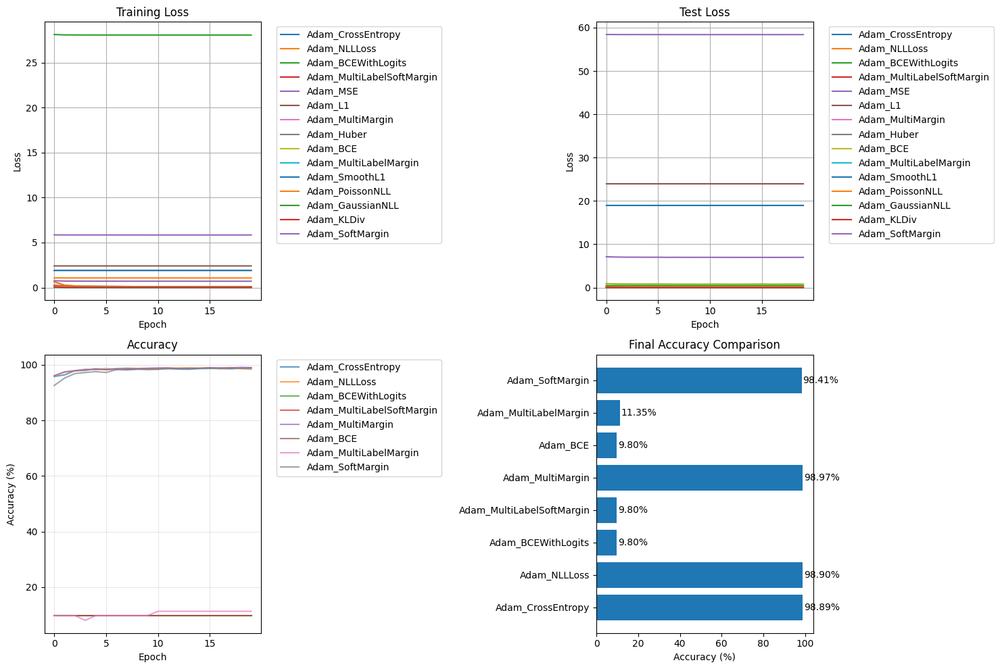


Experiment: AdamW + CrossEntropy
Train Epoch: 1 [0/60000 (0%)]	Loss: 2.309042
Train Epoch: 1 [32000/60000 (53%)]	Loss: 0.531848

Test set: Average loss: 0.1125, Accuracy: 9671/10000 (96.71%)

Train Epoch: 2 [0/60000 (0%)]	Loss: 0.234453
Train Epoch: 2 [32000/60000 (53%)]	Loss: 0.402218

Test set: Average loss: 0.0654, Accuracy: 9813/10000 (98.13%)

Train Epoch: 3 [0/60000 (0%)]	Loss: 0.072121
Train Epoch: 3 [32000/60000 (53%)]	Loss: 0.116921

Test set: Average loss: 0.0530, Accuracy: 9836/10000 (98.36%)

Train Epoch: 4 [0/60000 (0%)]	Loss: 0.171247
Train Epoch: 4 [32000/60000 (53%)]	Loss: 0.131088

Test set: Average loss: 0.0531, Accuracy: 9844/10000 (98.44%)

Train Epoch: 5 [0/60000 (0%)]	Loss: 0.040216
Train Epoch: 5 [32000/60000 (53%)]	Loss: 0.217418

Test set: Average loss: 0.0551, Accuracy: 9831/10000 (98.31%)

Train Epoch: 6 [0/60000 (0%)]	Loss: 0.041853
Train Epoch: 6 [32000/60000 (53%)]	Loss: 0.093094

Test set: Average loss: 0.0490, Accuracy: 9858/10000 (98.58%)

Train Epoch:

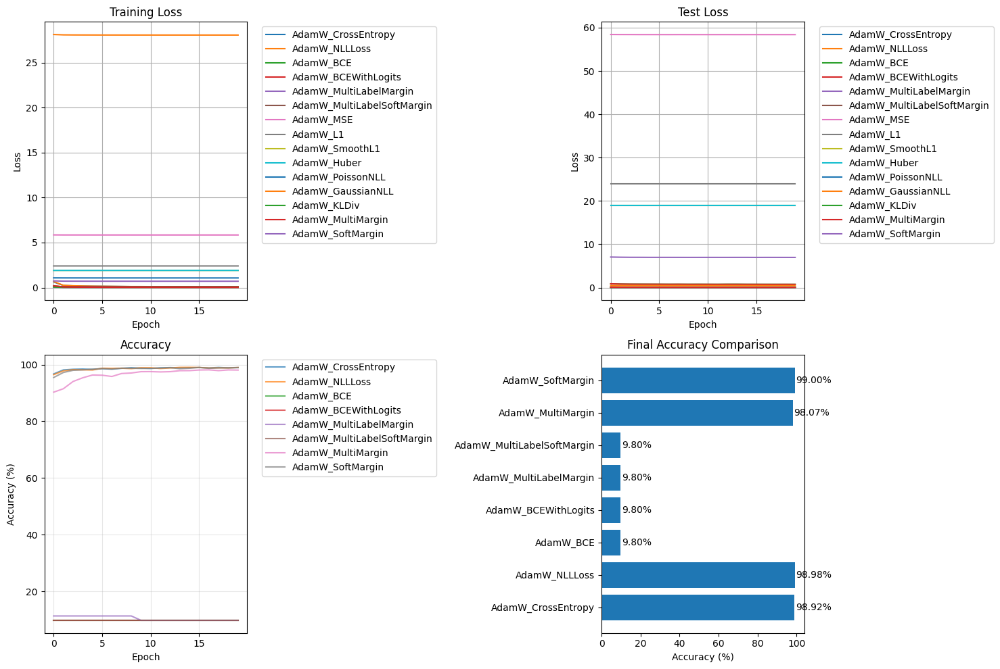


Experiment: SGD + CrossEntropy
Train Epoch: 1 [0/60000 (0%)]	Loss: 2.315223
Train Epoch: 1 [32000/60000 (53%)]	Loss: 1.053624

Test set: Average loss: 0.5223, Accuracy: 8391/10000 (83.91%)

Train Epoch: 2 [0/60000 (0%)]	Loss: 1.097726
Train Epoch: 2 [32000/60000 (53%)]	Loss: 0.381048

Test set: Average loss: 0.2677, Accuracy: 9239/10000 (92.39%)

Train Epoch: 3 [0/60000 (0%)]	Loss: 0.348048
Train Epoch: 3 [32000/60000 (53%)]	Loss: 0.364006

Test set: Average loss: 0.1301, Accuracy: 9602/10000 (96.02%)

Train Epoch: 4 [0/60000 (0%)]	Loss: 0.446514
Train Epoch: 4 [32000/60000 (53%)]	Loss: 0.232201

Test set: Average loss: 0.1171, Accuracy: 9631/10000 (96.31%)

Train Epoch: 5 [0/60000 (0%)]	Loss: 0.205626
Train Epoch: 5 [32000/60000 (53%)]	Loss: 0.229844

Test set: Average loss: 0.1028, Accuracy: 9689/10000 (96.89%)

Train Epoch: 6 [0/60000 (0%)]	Loss: 0.305981
Train Epoch: 6 [32000/60000 (53%)]	Loss: 0.175980

Test set: Average loss: 0.1016, Accuracy: 9692/10000 (96.92%)

Train Epoch: 7

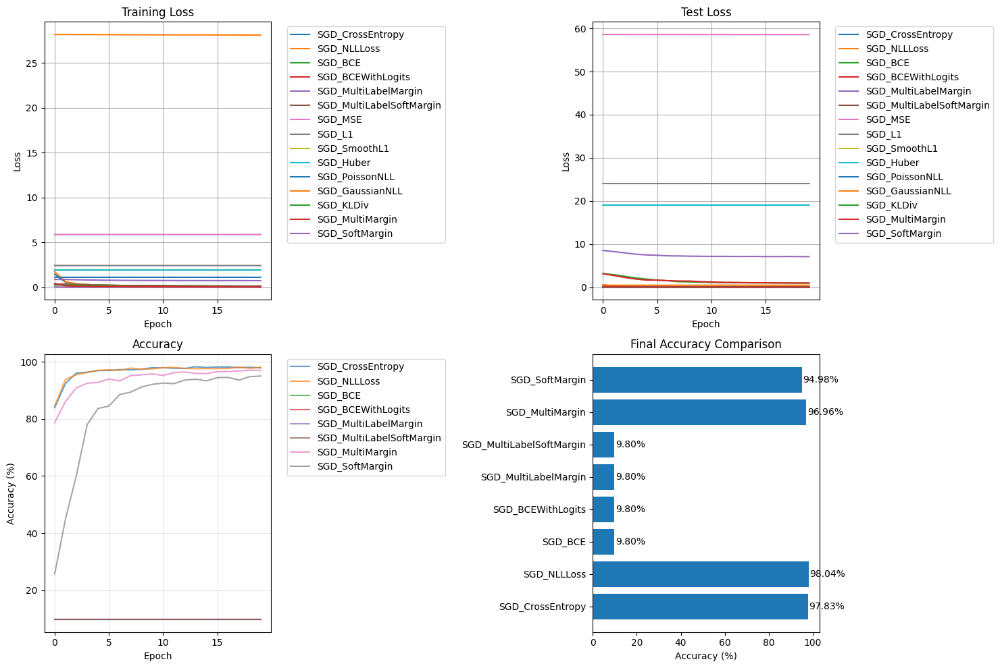


Experiment: RMSprop + CrossEntropy
Train Epoch: 1 [0/60000 (0%)]	Loss: 2.324580
Train Epoch: 1 [32000/60000 (53%)]	Loss: 2.306372

Test set: Average loss: 2.3015, Accuracy: 1135/10000 (11.35%)

Train Epoch: 2 [0/60000 (0%)]	Loss: 2.302198
Train Epoch: 2 [32000/60000 (53%)]	Loss: 2.304166

Test set: Average loss: 2.3020, Accuracy: 1135/10000 (11.35%)

Train Epoch: 3 [0/60000 (0%)]	Loss: 2.307952
Train Epoch: 3 [32000/60000 (53%)]	Loss: 2.310891

Test set: Average loss: 2.3015, Accuracy: 1135/10000 (11.35%)

Train Epoch: 4 [0/60000 (0%)]	Loss: 2.300941
Train Epoch: 4 [32000/60000 (53%)]	Loss: 2.290922

Test set: Average loss: 2.3019, Accuracy: 1135/10000 (11.35%)

Train Epoch: 5 [0/60000 (0%)]	Loss: 2.282586
Train Epoch: 5 [32000/60000 (53%)]	Loss: 2.300282

Test set: Average loss: 2.3021, Accuracy: 1135/10000 (11.35%)

Train Epoch: 6 [0/60000 (0%)]	Loss: 2.322182
Train Epoch: 6 [32000/60000 (53%)]	Loss: 2.294819

Test set: Average loss: 2.3018, Accuracy: 1028/10000 (10.28%)

Train Epoc

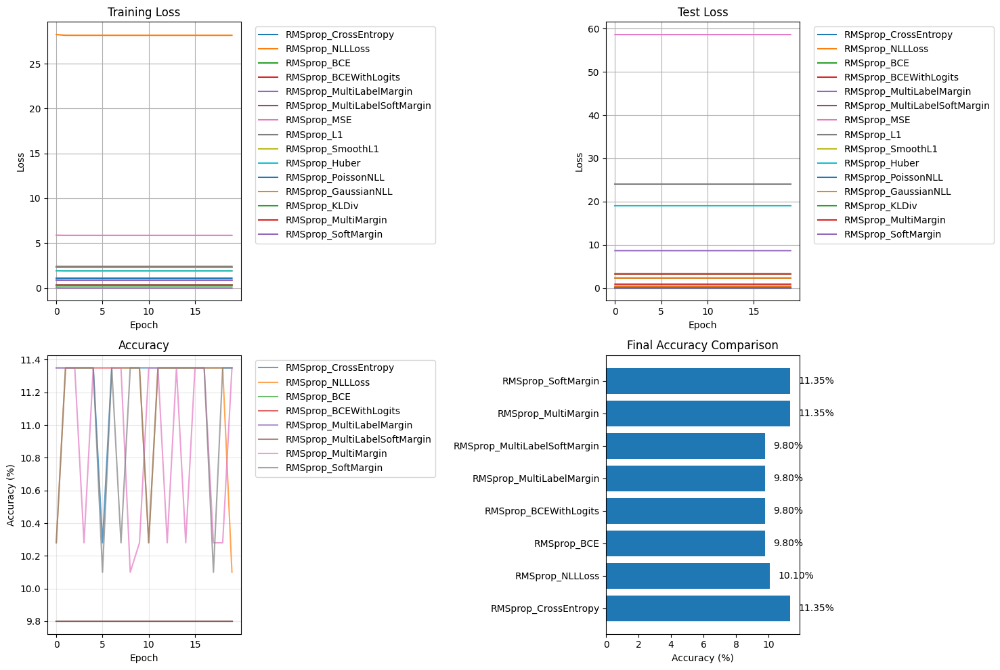


Experiment: Rprop + CrossEntropy
Train Epoch: 1 [0/60000 (0%)]	Loss: 2.335241
Train Epoch: 1 [32000/60000 (53%)]	Loss: 3.512895

Test set: Average loss: 9.3710, Accuracy: 2087/10000 (20.87%)

Train Epoch: 2 [0/60000 (0%)]	Loss: 2.103202
Train Epoch: 2 [32000/60000 (53%)]	Loss: 65.347458

Test set: Average loss: 20.7113, Accuracy: 2085/10000 (20.85%)

Train Epoch: 3 [0/60000 (0%)]	Loss: 2.011127
Train Epoch: 3 [32000/60000 (53%)]	Loss: 1.987693

Test set: Average loss: 23.0274, Accuracy: 2078/10000 (20.78%)

Train Epoch: 4 [0/60000 (0%)]	Loss: 4.740045
Train Epoch: 4 [32000/60000 (53%)]	Loss: 2.076947

Test set: Average loss: 36.4602, Accuracy: 2063/10000 (20.63%)

Train Epoch: 5 [0/60000 (0%)]	Loss: 49.649845
Train Epoch: 5 [32000/60000 (53%)]	Loss: 7.490765

Test set: Average loss: 35.0747, Accuracy: 2068/10000 (20.68%)

Train Epoch: 6 [0/60000 (0%)]	Loss: 1.833862
Train Epoch: 6 [32000/60000 (53%)]	Loss: 21.620525

Test set: Average loss: 34.3026, Accuracy: 2078/10000 (20.78%)

Trai

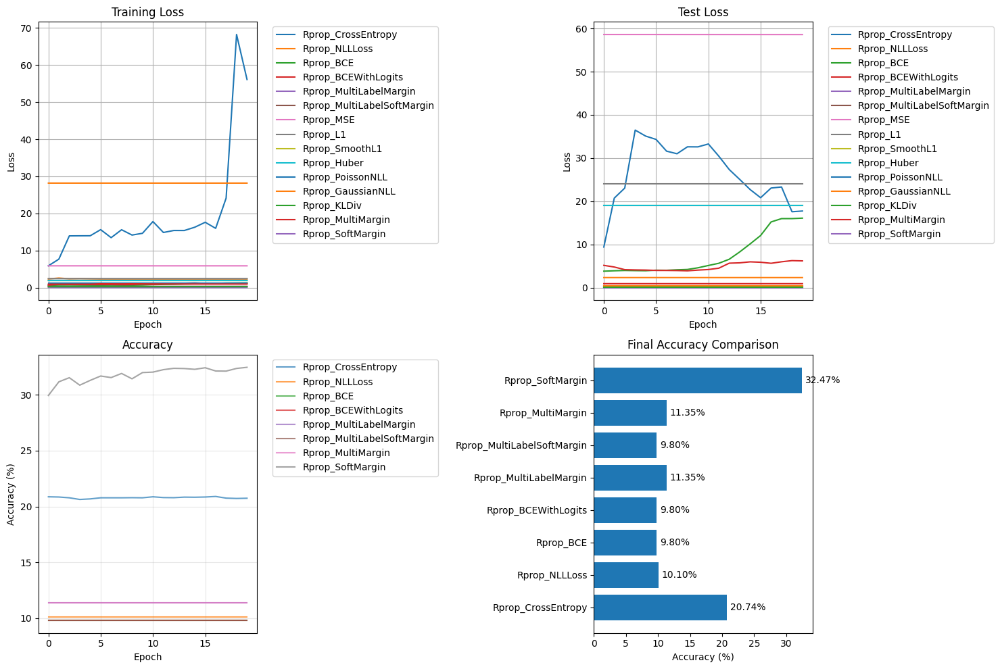


Experiment: Adagrad + CrossEntropy
Train Epoch: 1 [0/60000 (0%)]	Loss: 2.328637
Train Epoch: 1 [32000/60000 (53%)]	Loss: 2.309158

Test set: Average loss: 2.3011, Accuracy: 1135/10000 (11.35%)

Train Epoch: 2 [0/60000 (0%)]	Loss: 2.295666
Train Epoch: 2 [32000/60000 (53%)]	Loss: 2.300402

Test set: Average loss: 2.3010, Accuracy: 1135/10000 (11.35%)

Train Epoch: 3 [0/60000 (0%)]	Loss: 2.299469
Train Epoch: 3 [32000/60000 (53%)]	Loss: 2.288044

Test set: Average loss: 2.3010, Accuracy: 1135/10000 (11.35%)

Train Epoch: 4 [0/60000 (0%)]	Loss: 2.304101
Train Epoch: 4 [32000/60000 (53%)]	Loss: 2.298325

Test set: Average loss: 2.3010, Accuracy: 1135/10000 (11.35%)

Train Epoch: 5 [0/60000 (0%)]	Loss: 2.300353
Train Epoch: 5 [32000/60000 (53%)]	Loss: 2.308384

Test set: Average loss: 2.3010, Accuracy: 1135/10000 (11.35%)

Train Epoch: 6 [0/60000 (0%)]	Loss: 2.302812
Train Epoch: 6 [32000/60000 (53%)]	Loss: 2.297703

Test set: Average loss: 2.3010, Accuracy: 1135/10000 (11.35%)

Train Epoc

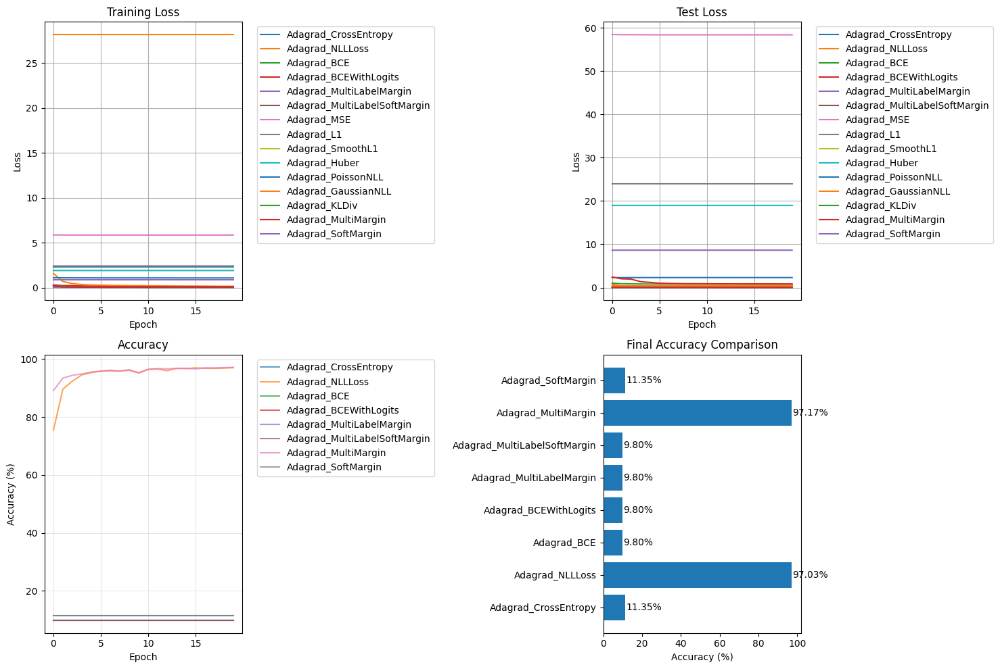


Experiment: Adadelta + CrossEntropy
Train Epoch: 1 [0/60000 (0%)]	Loss: 2.307420
Train Epoch: 1 [32000/60000 (53%)]	Loss: 0.329503

Test set: Average loss: 0.1681, Accuracy: 9495/10000 (94.95%)

Train Epoch: 2 [0/60000 (0%)]	Loss: 0.308695
Train Epoch: 2 [32000/60000 (53%)]	Loss: 0.097404

Test set: Average loss: 0.0853, Accuracy: 9761/10000 (97.61%)

Train Epoch: 3 [0/60000 (0%)]	Loss: 0.240623
Train Epoch: 3 [32000/60000 (53%)]	Loss: 0.050126

Test set: Average loss: 0.0582, Accuracy: 9828/10000 (98.28%)

Train Epoch: 4 [0/60000 (0%)]	Loss: 0.180114
Train Epoch: 4 [32000/60000 (53%)]	Loss: 0.086186

Test set: Average loss: 0.0550, Accuracy: 9840/10000 (98.40%)

Train Epoch: 5 [0/60000 (0%)]	Loss: 0.054563
Train Epoch: 5 [32000/60000 (53%)]	Loss: 0.149526

Test set: Average loss: 0.0610, Accuracy: 9832/10000 (98.32%)

Train Epoch: 6 [0/60000 (0%)]	Loss: 0.116342
Train Epoch: 6 [32000/60000 (53%)]	Loss: 0.109568

Test set: Average loss: 0.0533, Accuracy: 9853/10000 (98.53%)

Train Epo

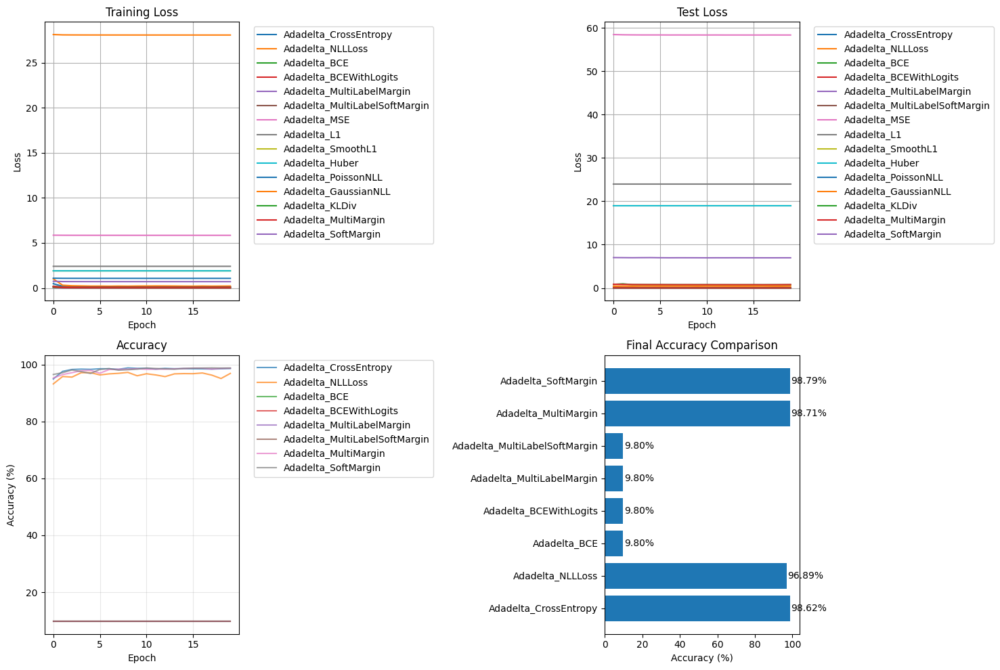


Experiment: NAdam + CrossEntropy
Train Epoch: 1 [0/60000 (0%)]	Loss: 2.330312
Train Epoch: 1 [32000/60000 (53%)]	Loss: 0.436142

Test set: Average loss: 0.1333, Accuracy: 9590/10000 (95.90%)

Train Epoch: 2 [0/60000 (0%)]	Loss: 0.182919
Train Epoch: 2 [32000/60000 (53%)]	Loss: 0.144365

Test set: Average loss: 0.0735, Accuracy: 9790/10000 (97.90%)

Train Epoch: 3 [0/60000 (0%)]	Loss: 0.089757
Train Epoch: 3 [32000/60000 (53%)]	Loss: 0.277883

Test set: Average loss: 0.0595, Accuracy: 9812/10000 (98.12%)

Train Epoch: 4 [0/60000 (0%)]	Loss: 0.147285
Train Epoch: 4 [32000/60000 (53%)]	Loss: 0.084874

Test set: Average loss: 0.0459, Accuracy: 9873/10000 (98.73%)

Train Epoch: 5 [0/60000 (0%)]	Loss: 0.038988
Train Epoch: 5 [32000/60000 (53%)]	Loss: 0.193942

Test set: Average loss: 0.0507, Accuracy: 9851/10000 (98.51%)

Train Epoch: 6 [0/60000 (0%)]	Loss: 0.049370
Train Epoch: 6 [32000/60000 (53%)]	Loss: 0.212015

Test set: Average loss: 0.0428, Accuracy: 9858/10000 (98.58%)

Train Epoch:

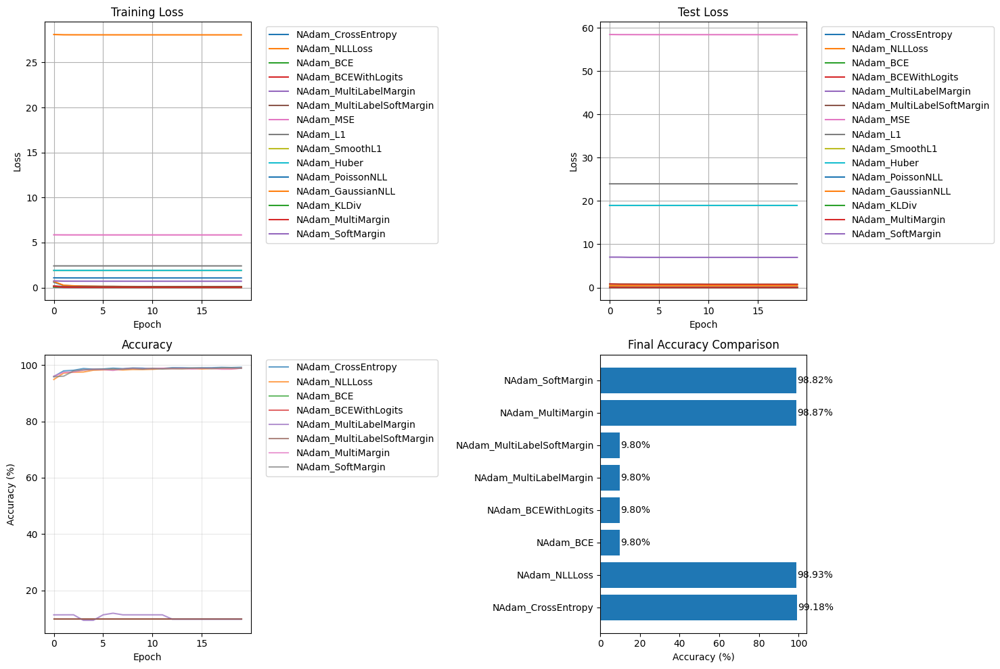


Experiment: RAdam + CrossEntropy
Train Epoch: 1 [0/60000 (0%)]	Loss: 2.316700
Train Epoch: 1 [32000/60000 (53%)]	Loss: 1.096632

Test set: Average loss: 0.2192, Accuracy: 9317/10000 (93.17%)

Train Epoch: 2 [0/60000 (0%)]	Loss: 0.622537
Train Epoch: 2 [32000/60000 (53%)]	Loss: 0.239256

Test set: Average loss: 0.1242, Accuracy: 9633/10000 (96.33%)

Train Epoch: 3 [0/60000 (0%)]	Loss: 0.371541
Train Epoch: 3 [32000/60000 (53%)]	Loss: 0.274811

Test set: Average loss: 0.0918, Accuracy: 9714/10000 (97.14%)

Train Epoch: 4 [0/60000 (0%)]	Loss: 0.226019
Train Epoch: 4 [32000/60000 (53%)]	Loss: 0.255664

Test set: Average loss: 0.0668, Accuracy: 9806/10000 (98.06%)

Train Epoch: 5 [0/60000 (0%)]	Loss: 0.129347
Train Epoch: 5 [32000/60000 (53%)]	Loss: 0.016720

Test set: Average loss: 0.0759, Accuracy: 9778/10000 (97.78%)

Train Epoch: 6 [0/60000 (0%)]	Loss: 0.179126
Train Epoch: 6 [32000/60000 (53%)]	Loss: 0.215499

Test set: Average loss: 0.0593, Accuracy: 9827/10000 (98.27%)

Train Epoch:

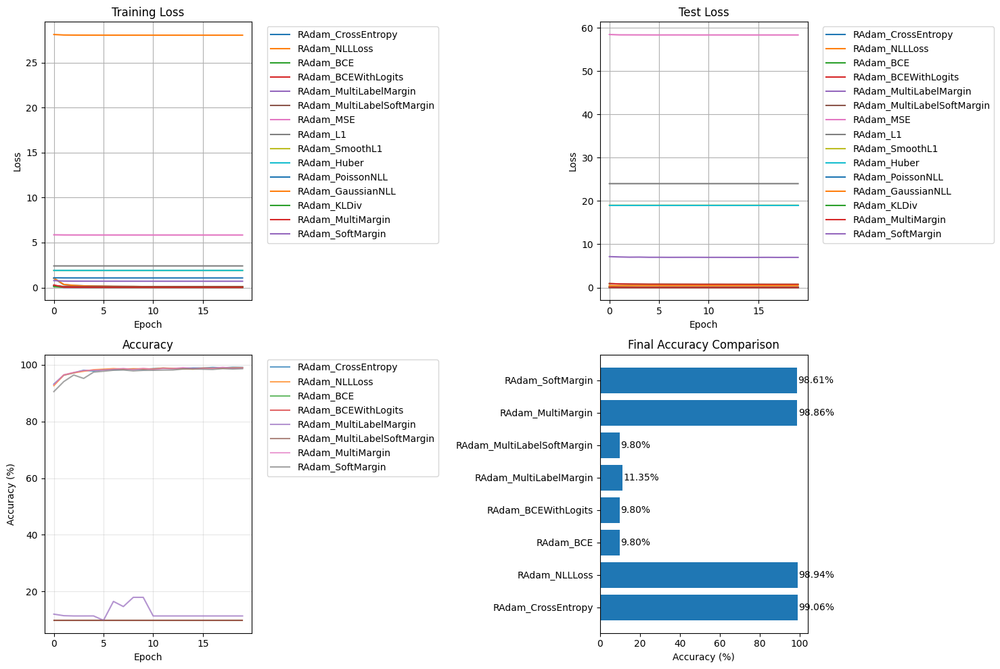


Experiment: LBFGS + CrossEntropy
Error in experiment LBFGS + CrossEntropy: LBFGS.step() missing 1 required positional argument: 'closure'

Experiment: LBFGS + NLLLoss
Error in experiment LBFGS + NLLLoss: LBFGS.step() missing 1 required positional argument: 'closure'

Experiment: LBFGS + BCE
Error in experiment LBFGS + BCE: LBFGS.step() missing 1 required positional argument: 'closure'

Experiment: LBFGS + BCEWithLogits
Error in experiment LBFGS + BCEWithLogits: LBFGS.step() missing 1 required positional argument: 'closure'

Experiment: LBFGS + MultiLabelMargin
Error in experiment LBFGS + MultiLabelMargin: LBFGS.step() missing 1 required positional argument: 'closure'

Experiment: LBFGS + MultiLabelSoftMargin
Error in experiment LBFGS + MultiLabelSoftMargin: LBFGS.step() missing 1 required positional argument: 'closure'

Experiment: LBFGS + MSE
Error in experiment LBFGS + MSE: LBFGS.step() missing 1 required positional argument: 'closure'

Experiment: LBFGS + L1
Error in experiment LBF

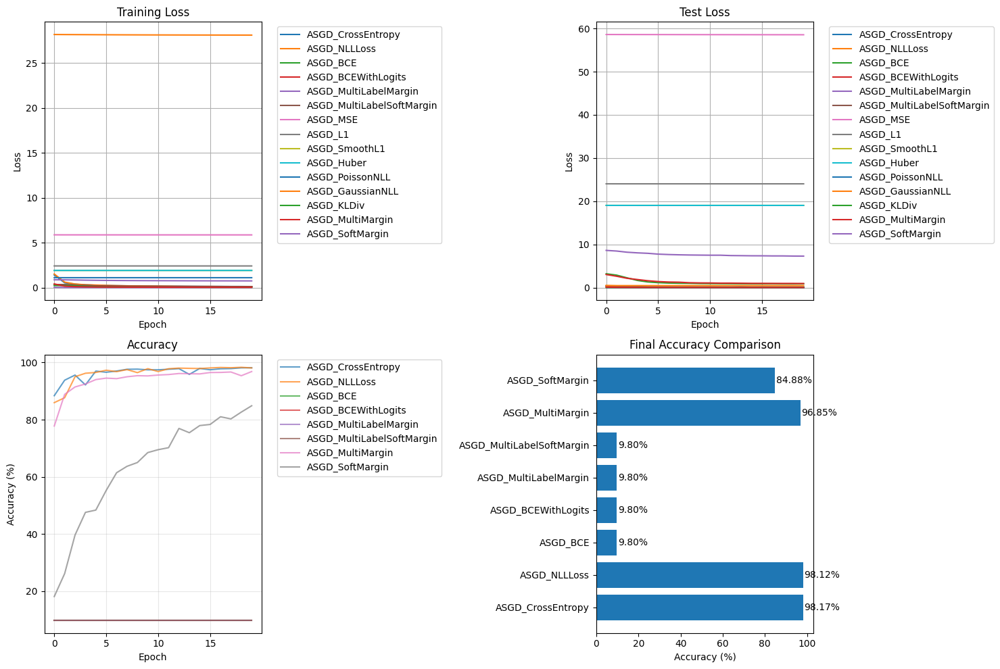


Experiment: Adamax + CrossEntropy
Train Epoch: 1 [0/60000 (0%)]	Loss: 2.334463
Train Epoch: 1 [32000/60000 (53%)]	Loss: 0.562571

Test set: Average loss: 0.2602, Accuracy: 9204/10000 (92.04%)

Train Epoch: 2 [0/60000 (0%)]	Loss: 0.530566
Train Epoch: 2 [32000/60000 (53%)]	Loss: 0.366814

Test set: Average loss: 0.1467, Accuracy: 9567/10000 (95.67%)

Train Epoch: 3 [0/60000 (0%)]	Loss: 0.346047
Train Epoch: 3 [32000/60000 (53%)]	Loss: 0.346633

Test set: Average loss: 0.1258, Accuracy: 9634/10000 (96.34%)

Train Epoch: 4 [0/60000 (0%)]	Loss: 0.209616
Train Epoch: 4 [32000/60000 (53%)]	Loss: 0.327750

Test set: Average loss: 0.0933, Accuracy: 9739/10000 (97.39%)

Train Epoch: 5 [0/60000 (0%)]	Loss: 0.224407
Train Epoch: 5 [32000/60000 (53%)]	Loss: 0.043629

Test set: Average loss: 0.0877, Accuracy: 9759/10000 (97.59%)

Train Epoch: 6 [0/60000 (0%)]	Loss: 0.222809
Train Epoch: 6 [32000/60000 (53%)]	Loss: 0.331380

Test set: Average loss: 0.0804, Accuracy: 9774/10000 (97.74%)

Train Epoch

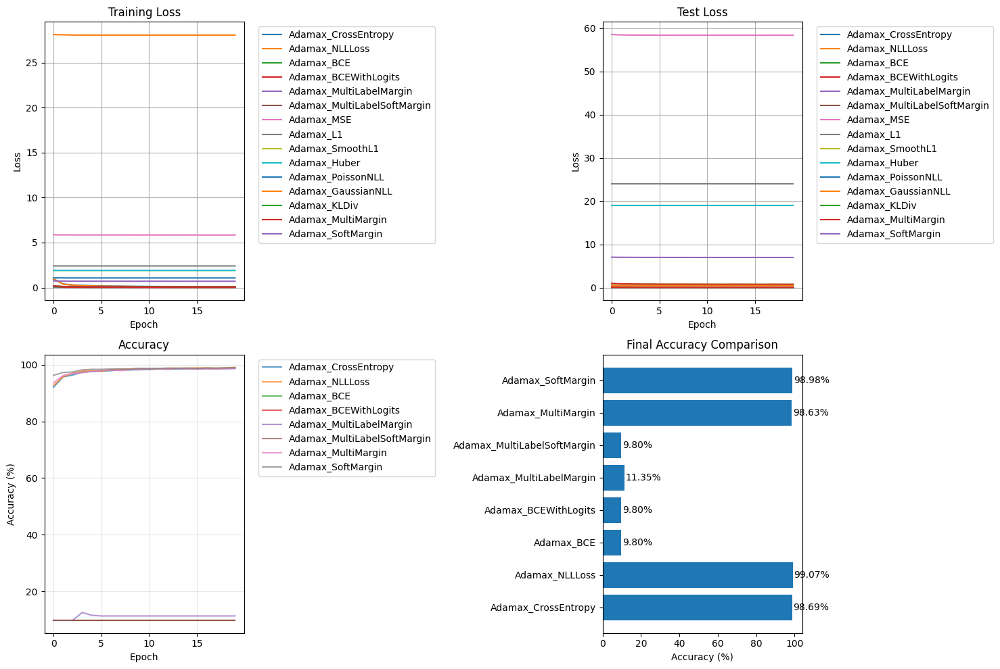


Experiment: SparseAdam + CrossEntropy
Error in experiment SparseAdam + CrossEntropy: SparseAdam does not support dense gradients, please consider Adam instead

Experiment: SparseAdam + NLLLoss
Error in experiment SparseAdam + NLLLoss: SparseAdam does not support dense gradients, please consider Adam instead

Experiment: SparseAdam + BCE
Error in experiment SparseAdam + BCE: SparseAdam does not support dense gradients, please consider Adam instead

Experiment: SparseAdam + BCEWithLogits
Error in experiment SparseAdam + BCEWithLogits: SparseAdam does not support dense gradients, please consider Adam instead

Experiment: SparseAdam + MultiLabelMargin
Error in experiment SparseAdam + MultiLabelMargin: SparseAdam does not support dense gradients, please consider Adam instead

Experiment: SparseAdam + MultiLabelSoftMargin
Error in experiment SparseAdam + MultiLabelSoftMargin: SparseAdam does not support dense gradients, please consider Adam instead

Experiment: SparseAdam + MSE
Error in exp

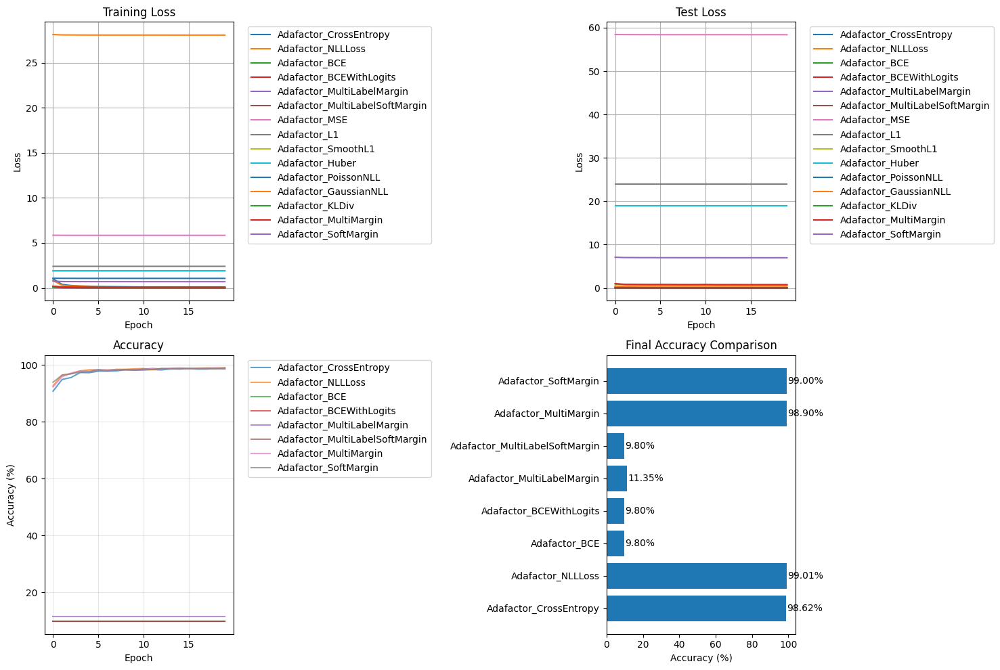

Всего проведено экспериментов: 180

=== Графики по группам оптимизаторов ===

--- Графики для Adam (15 экспериментов) ---


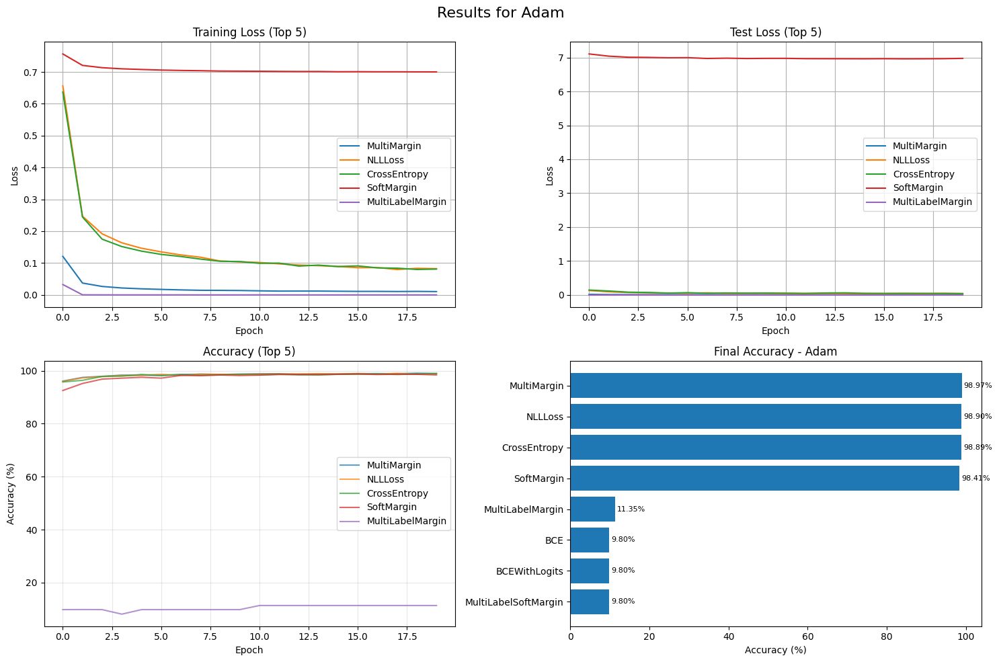


--- Графики для AdamW (15 экспериментов) ---


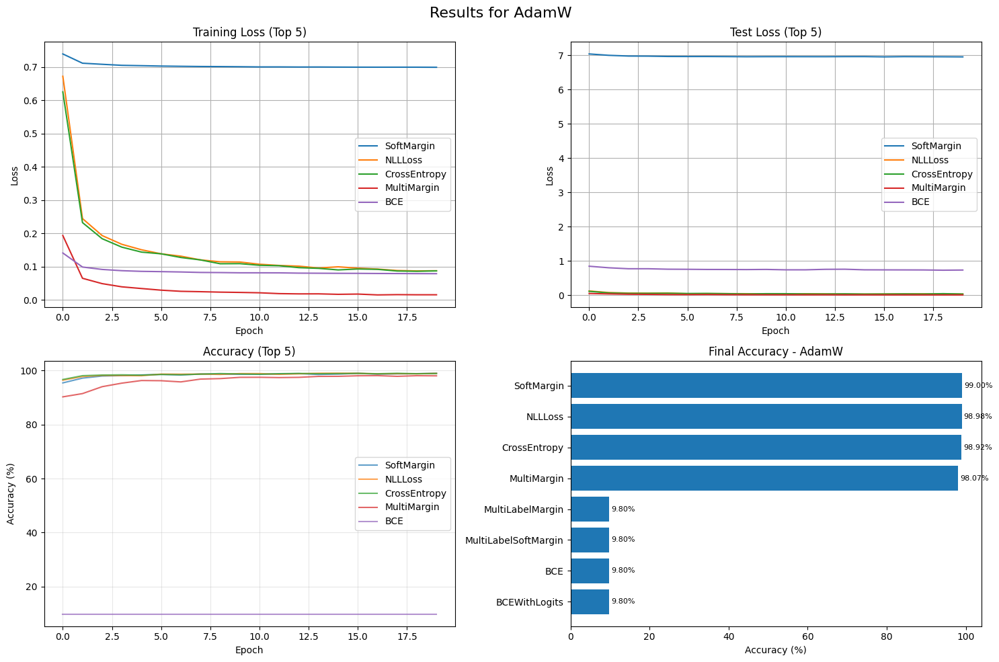


--- Графики для SGD (15 экспериментов) ---


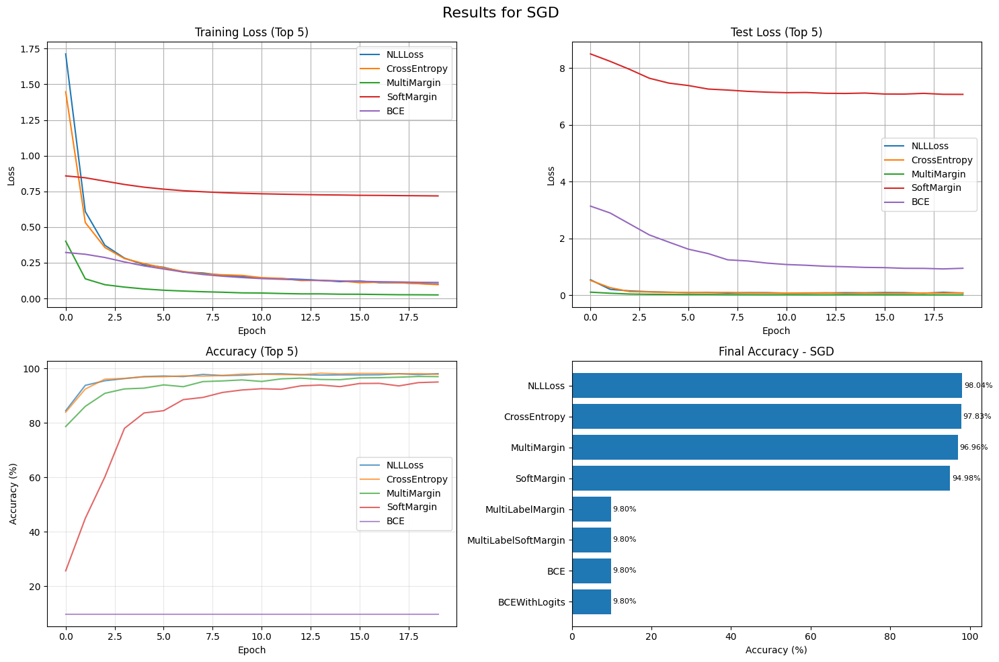


--- Графики для RMSprop (15 экспериментов) ---


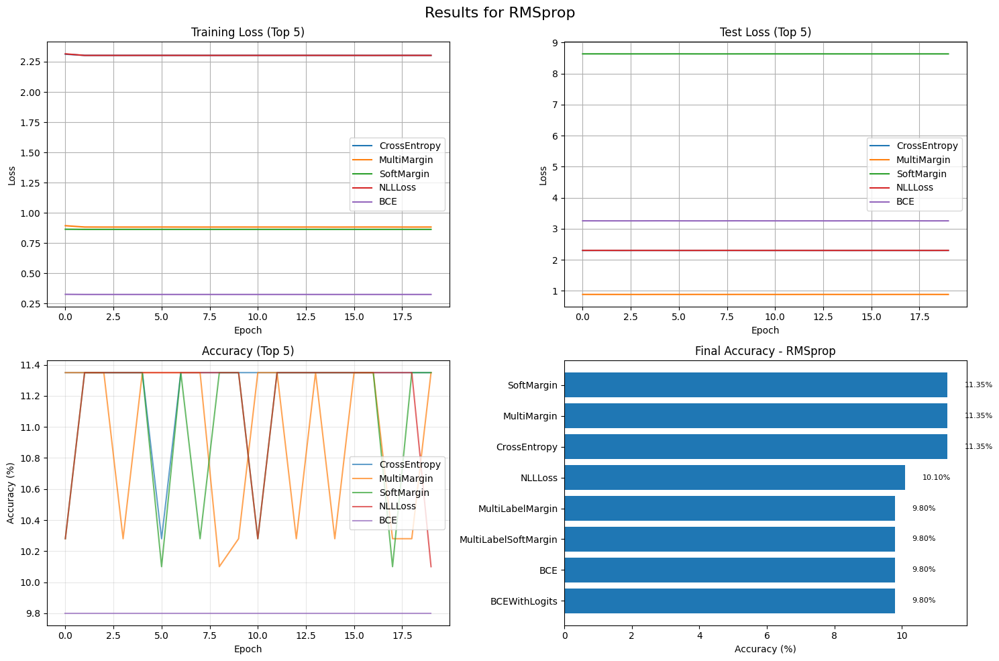


--- Графики для Rprop (15 экспериментов) ---


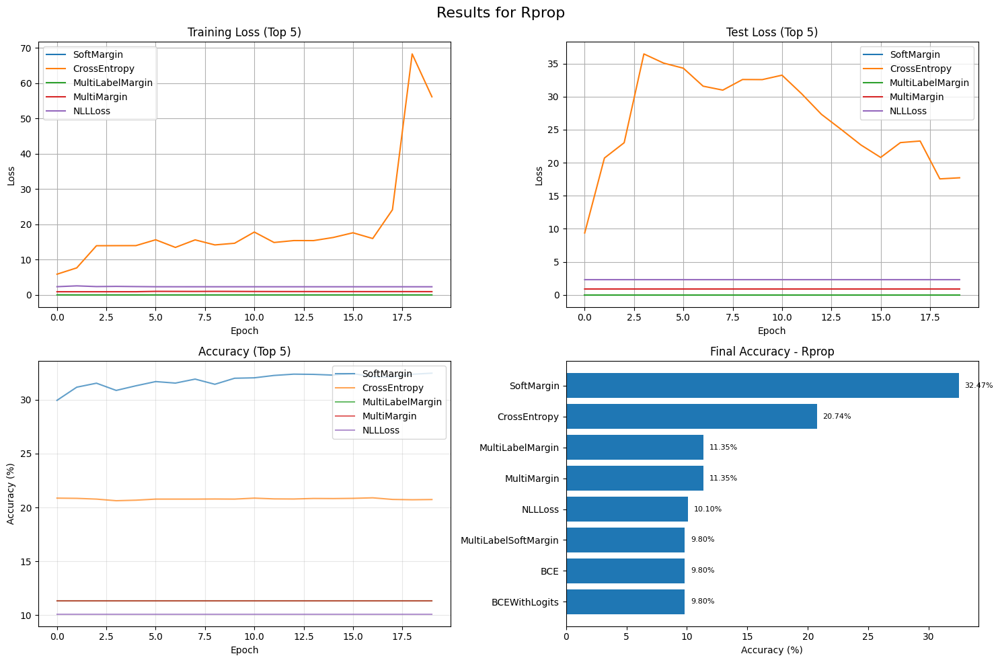


--- Графики для Adagrad (15 экспериментов) ---


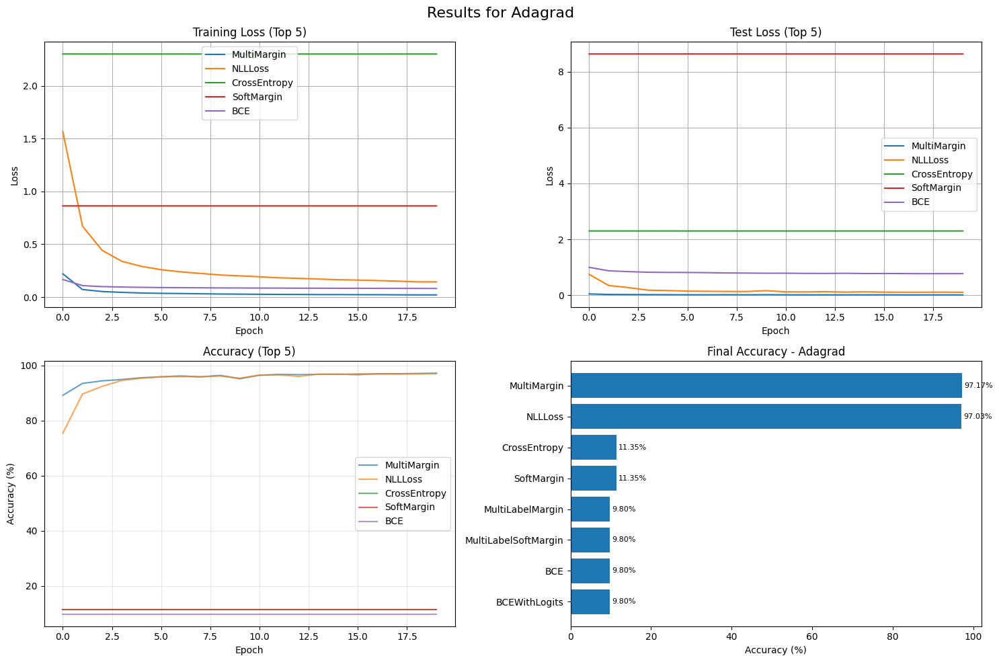


--- Графики для Adadelta (15 экспериментов) ---


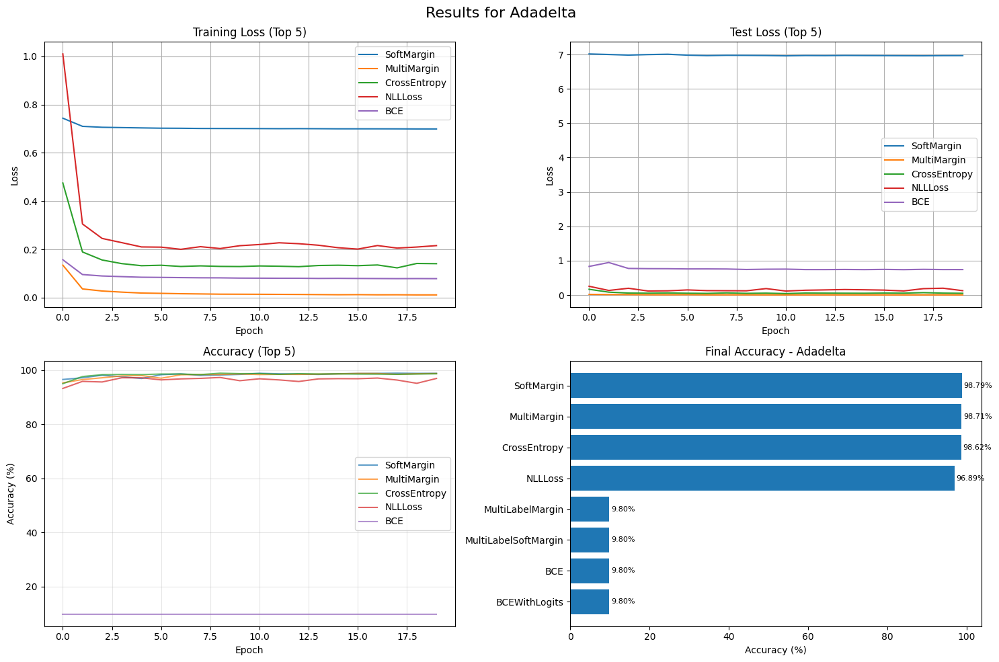


--- Графики для NAdam (15 экспериментов) ---


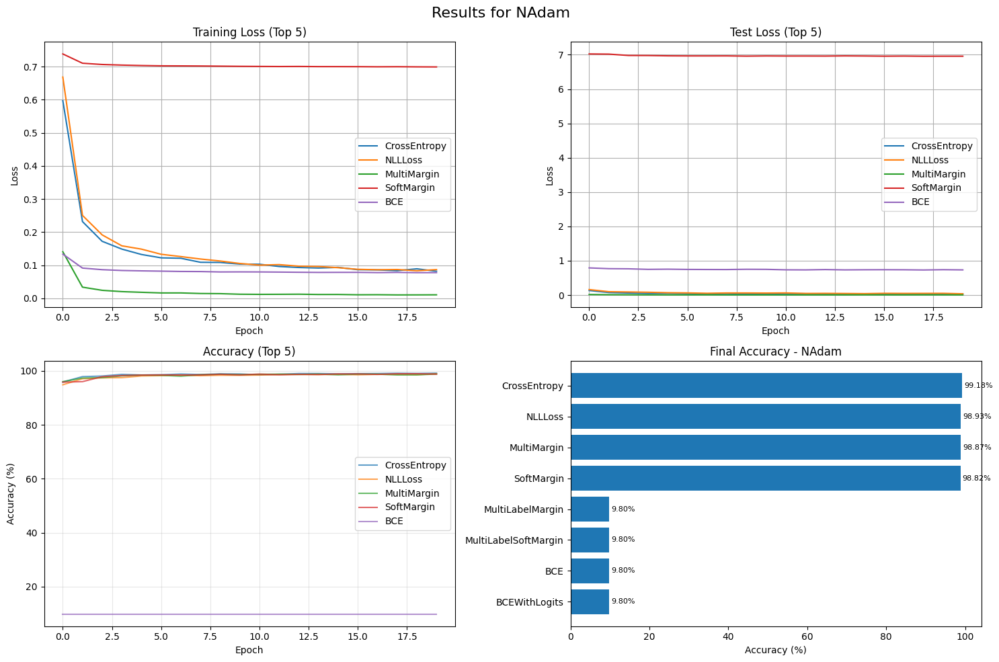


--- Графики для RAdam (15 экспериментов) ---


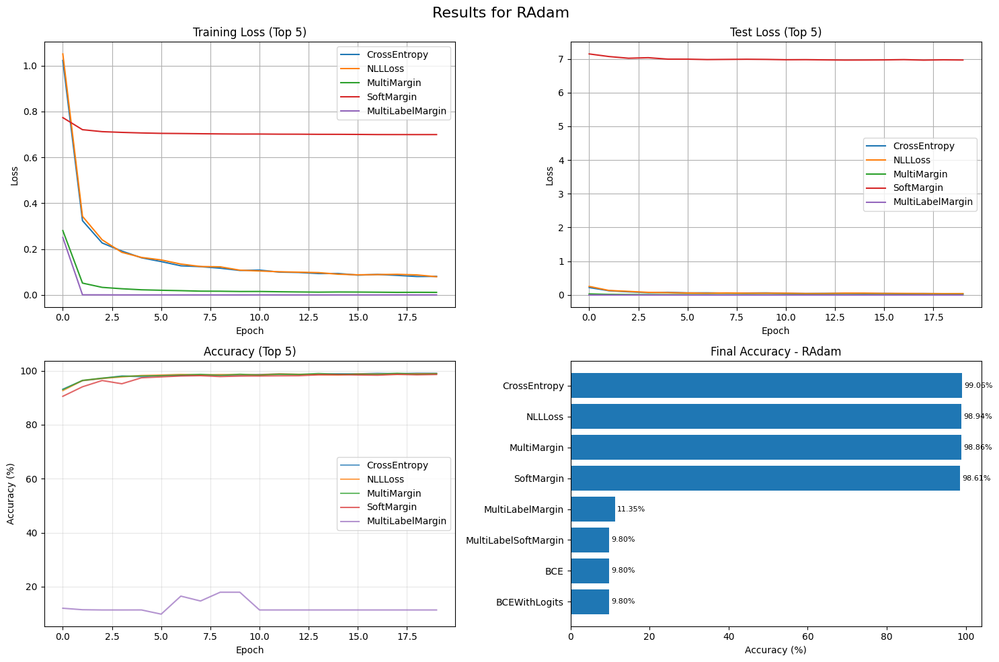


--- Графики для ASGD (15 экспериментов) ---


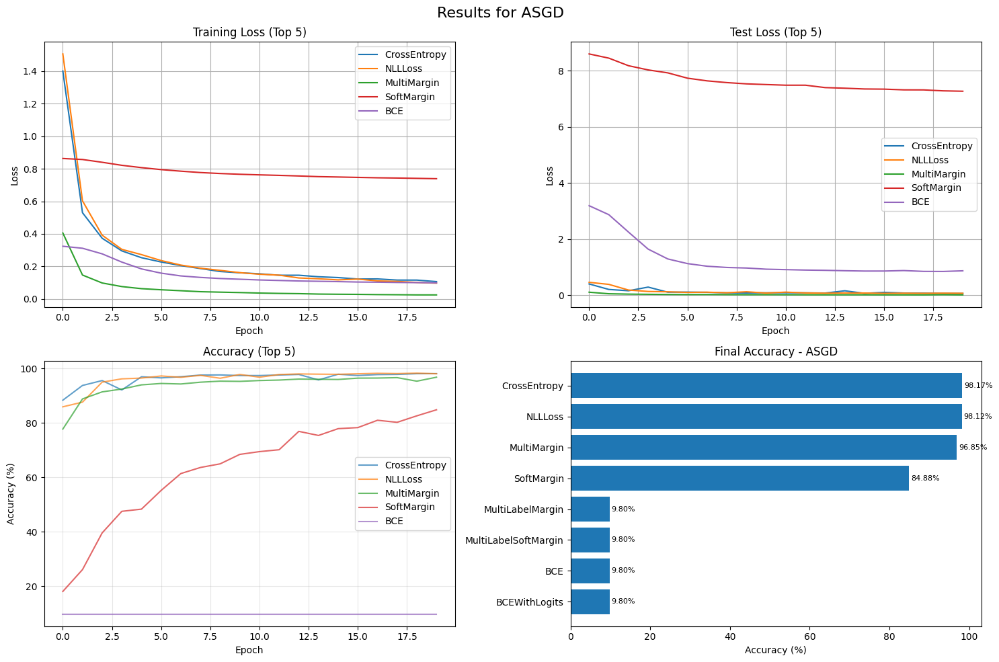


--- Графики для Adamax (15 экспериментов) ---


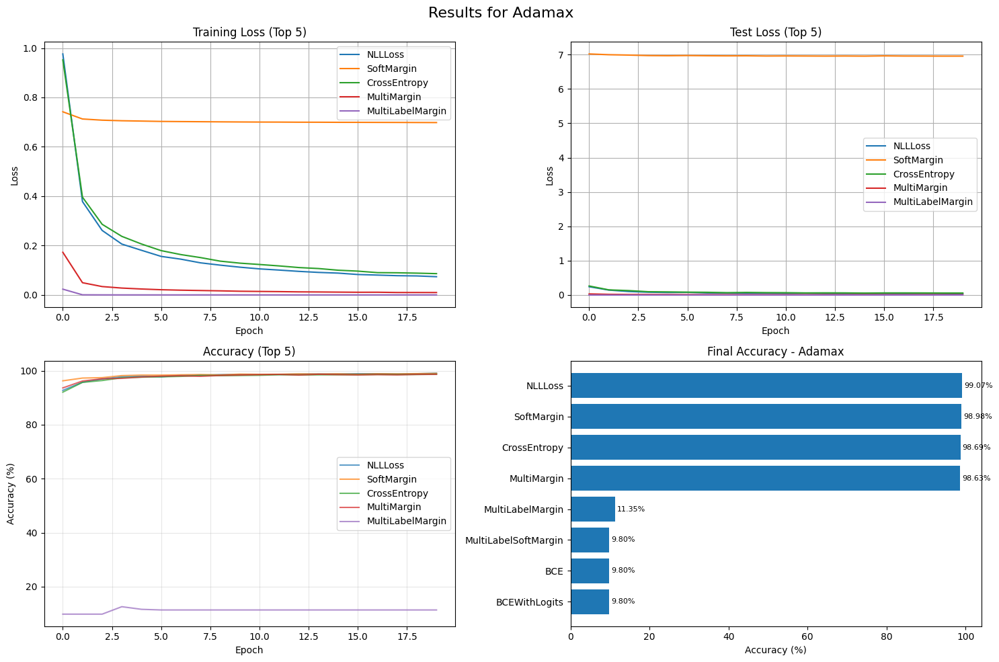


--- Графики для Adafactor (15 экспериментов) ---


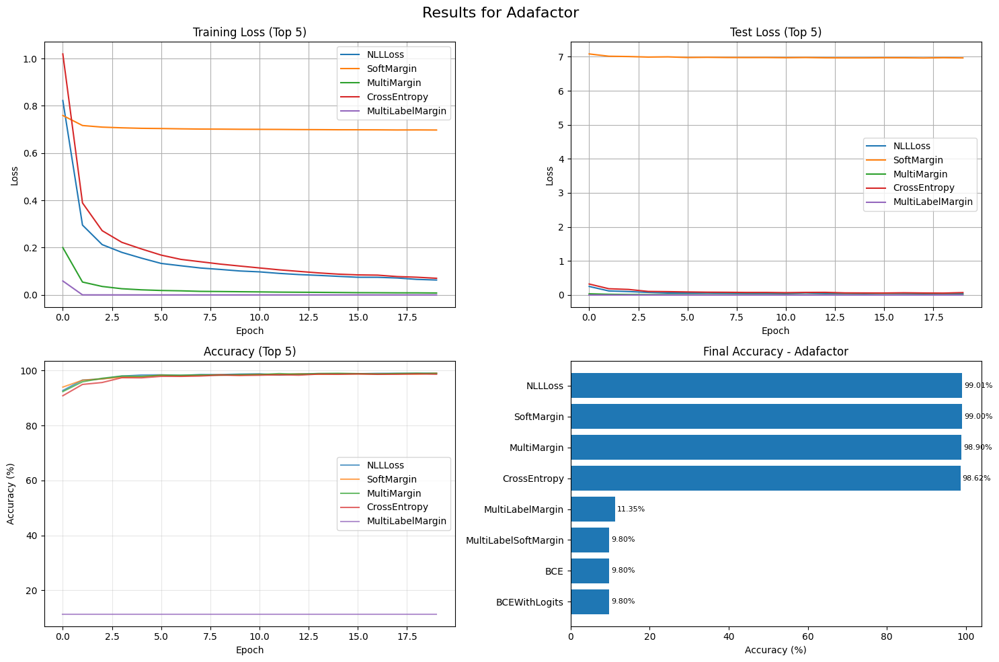


=== Сводный анализ ===

🎯 Лучшая комбинация: NAdam_CrossEntropy
🎯 Точность: 99.18%

🎯 Дотренировка лучшей модели (NAdam_CrossEntropy)...
Train Epoch: 1 [0/60000 (0%)]	Loss: 2.292898
Train Epoch: 1 [32000/60000 (53%)]	Loss: 0.305774

Test set: Average loss: 0.1534, Accuracy: 9523/10000 (95.23%)

Train Epoch: 2 [0/60000 (0%)]	Loss: 0.240353
Train Epoch: 2 [32000/60000 (53%)]	Loss: 0.500179

Test set: Average loss: 0.1003, Accuracy: 9699/10000 (96.99%)

Train Epoch: 3 [0/60000 (0%)]	Loss: 0.126715
Train Epoch: 3 [32000/60000 (53%)]	Loss: 0.197012

Test set: Average loss: 0.1152, Accuracy: 9677/10000 (96.77%)

Train Epoch: 4 [0/60000 (0%)]	Loss: 0.152837
Train Epoch: 4 [32000/60000 (53%)]	Loss: 0.157150

Test set: Average loss: 0.0851, Accuracy: 9771/10000 (97.71%)

Train Epoch: 5 [0/60000 (0%)]	Loss: 0.221260
Train Epoch: 5 [32000/60000 (53%)]	Loss: 0.138647

Test set: Average loss: 0.0872, Accuracy: 9718/10000 (97.18%)


🏆 Топ-20 комбинаций:
---------------------------------------------

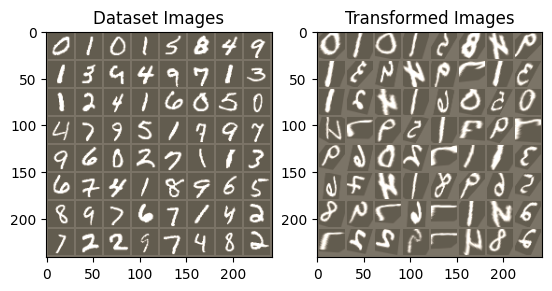

NameError: name 'print_detailed_analysis' is not defined

In [ ]:
# Запуск экспериментов
print("Starting comprehensive experiments...")

# Optim.Adam
results_1 = run_Adam_experiments()
# Визуализация результатов
plot_results(results_1)

# Optim.AdamW
results_2 = run_AdamW_experiments()
plot_results(results_2)

# Optim.SGD
results_3 = run_SGD_experiments()
plot_results(results_3)

# Optim.RMSprop
results_4 = run_RMSprop_experiments()
plot_results(results_4)

# Optim.Rprop
results_5 = run_Rprop_experiments()
plot_results(results_5)

# Optim.Adagrad
results_6 = run_Adagrad_experiments()
plot_results(results_6)

# Optim.Adadelta
results_7 = run_Adadelta_experiments()
plot_results(results_7)

# Optim.NAdam
results_8 = run_NAdam_experiments()
plot_results(results_8)

# Optim.RAdam
results_9 = run_RAdam_experiments()
plot_results(results_9)

# Optim.LBFGS
results_10 = run_LBFGS_experiments()
plot_results(results_10)

# Optim.ASGD
results_11 = run_ASGD_experiments()
plot_results(results_11)

# Optim.Adamax
results_12 = run_Adamax_experiments()
plot_results(results_12)

# Optim.SparseAdam
results_13 = run_SparseAdam_experiments()
plot_results(results_13)

# Optim.Adafactor
results_14 = run_Adafactor_experiments()
plot_results(results_14)

# Объединяем все результаты
all_results = {}
all_results.update(results_1)
all_results.update(results_2)
all_results.update(results_3)
all_results.update(results_4)
all_results.update(results_5)
all_results.update(results_6)
all_results.update(results_7)
all_results.update(results_8)
all_results.update(results_9)
all_results.update(results_10)
all_results.update(results_11)
all_results.update(results_12)
all_results.update(results_13)
all_results.update(results_14)

print(f"Всего проведено экспериментов: {len(all_results)}")

# Визуализация отдельных групп
print("\n=== Графики по группам оптимизаторов ===")
plot_optimizer_groups(individual_results={
    'Adam': results_1,
    'AdamW': results_2,
    'SGD': results_3,
    'RMSprop': results_4,
    'Rprop': results_5,
    'Adagrad': results_6,
    'Adadelta': results_7,
    'NAdam': results_8,
    'RAdam': results_9,
    'LBFGS': results_10,
    'ASGD': results_11,
    'Adamax': results_12,
    'SparseAdam': results_13,
    'Adafactor': results_14
})

# Сводный анализ лучших результатов
print("\n=== Сводный анализ ===")
if all_results:
    valid_results = {k: v for k, v in all_results.items() if v['final_accuracy'] > 0}
    if valid_results:
        best_exp = max(valid_results.items(), key=lambda x: x[1]['final_accuracy'])[0]
        print(f"\n🎯 Лучшая комбинация: {best_exp}")
        print(f"🎯 Точность: {valid_results[best_exp]['final_accuracy']:.2f}%")

        # Переобучаем модель с лучшими параметрами для визуализации
        best_optimizer, best_loss = best_exp.split('_')
        optimizer = setup_optimizer(best_optimizer, model.parameters())
        loss_config = loss_functions[best_loss]

        # Сбрасываем модель
        model.apply(weight_reset)

        print(f"\n🎯 Дотренировка лучшей модели ({best_exp})...")
        for epoch in range(1, 6):  # 5 эпох для визуализации
            train(epoch, optimizer, loss_config, best_loss)
            test(loss_config, best_loss)

        # Вывод таблицы результатов (топ-20)
        print("\n🏆 Топ-20 комбинаций:")
        print("-" * 60)
        sorted_results = sorted(valid_results.items(), key=lambda x: x[1]['final_accuracy'], reverse=True)[:20]
        for i, (name, result) in enumerate(sorted_results, 1):
            print(f"{i:2d}. {name:30} | {result['final_accuracy']:6.2f}%")

        # Визуализация STN для лучшей модели
        print(f"\n🎨 Визуализация STN для {best_exp}...")
        visualize_stn()
        plt.show()

        # Дополнительная аналитика
        print_detailed_analysis(valid_results)
    else:
        print("Нет валидных результатов с вычисленной точностью")
else:
    print("Не собрано ни одного результата")

###  ***RESULTS:***
### 1. **Optimizer-Adam**:
* Adam + CrossEntropy: Average loss: 0.0396, Accuracy: 9889/10000 (98.89%);
* Adam + NLLLoss: Average loss: 0.0377, Accuracy: 9890/10000 (98.90%) (Best - 99.01% on Epoch 18);
* Adam + BCEWithLogits: Average loss: 0.7565, Accuracy: 980/10000 (9.80%) (Not suitable combination for that task);
* Adam + MultiLabelSoftMargin: Average loss: 0.0838, Accuracy: 980/10000 (9.80%) (Not suitable combination for that task);
* Adam + MSE: Average loss: 58.3923, Accuracy: 0/10000 (0.00%) (Not suitable combination for that task);
* Adam + L1: Average loss: 24.0259, Accuracy: 0/10000 (0.00%) (Not suitable combination for that task);
* Adam + MultiMargin: Average loss: 0.0035, Accuracy: 9897/10000 (98.97%) (Best - 99.07% on Epoch 19);
* Adam + Huber: Average loss: 19.0259, Accuracy: 0/10000 (0.00%) (Not suitable combination for that task);
* Adam + BCE: Average loss: 0.7370, Accuracy: 980/10000 (9.80%) (Not suitable combination for that task);
* Adam + MultiLabelMargin: Average loss: 0.0000, Accuracy: 1135/10000 (11.35%) (Not suitable combination for that task);
* Adam + SmoothL1: Average loss: 19.0259, Accuracy: 0/10000 (0.00%) (Not suitable combination for that task);
* Adam + PoissonNLL: Average loss: 0.0167, Accuracy: 0/10000 (0.00%) (Not suitable combination for that task);
* Adam + GaussionNLL: Average loss: 0.4403, Accuracy: 0/10000 (0.00%) (Not suitable combination for that task);
* Adam + KLDiv: Average loss: 0.0001, Accuracy: 0/10000 (0.00%) (Not suitable combination for that task);
* Adam + CousineEmbedding, HingeEmbedding, MarginRanking, TripletMargin, TripletMarginWithDistance: Average loss: 0.0001, Accuracy: 0/10000 (0.00%) (Not suitable combination for that task);
* Adam + SoftMargin: Average loss: 6.9656, Accuracy: 9877/10000 (98.77%).
### **Adam RESULTS**: Only cobinations of Adam Optimizer with CrossEntropy, NLLLoss, MultiMargin and SoftMargin (98.89%, 99.01%, 99.07%, 98.77%) showed good results, that are shown on Accuracy and Final Accuracy graphs.

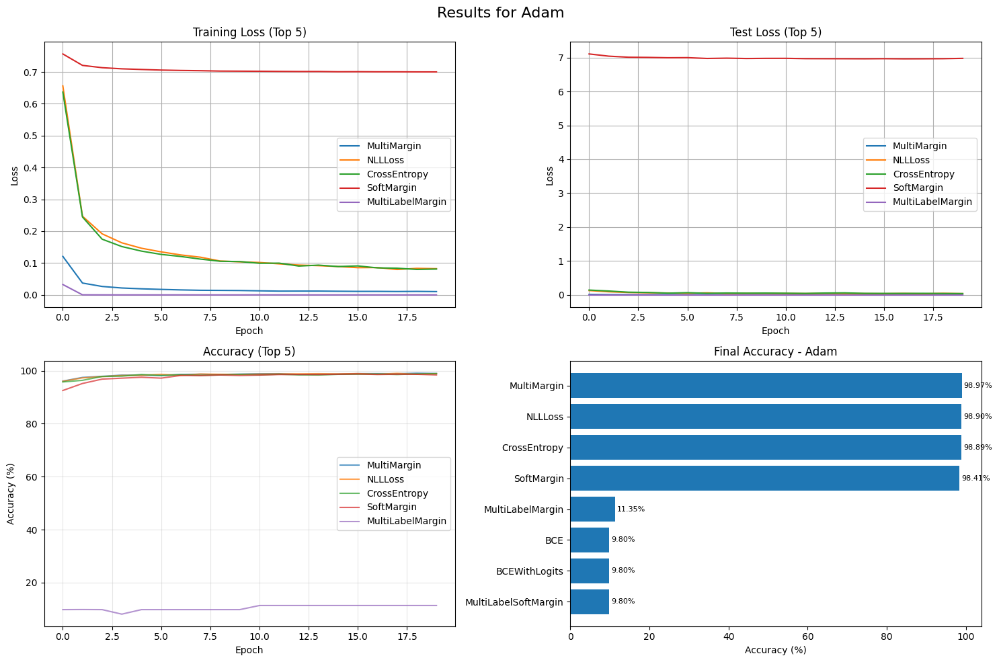

### 2. **Optimizer-AdamW**:
* AdamW + CrossEntropy: Average loss: 0.0339, Accuracy: 9901/10000 (99.01% with final 98.92%);
* AdamW + NLLLoss: Average loss: 0.0305, Accuracy: 9905/10000 (99.05% with final 98.98%);
* AdamW + BCE: Average loss: 0.7337, Accuracy: 980/10000 (9.80%) (Not suitable combination for that task);
* AdamW + BCEWithLogits: Average loss: 0.7294, Accuracy: 980/10000 (Not suitable combination for that task);
* AdamW + MultiLabelSoftMargin: Average loss: 0.0744, Accuracy: 980/10000 (9.80%) (Not suitable combination for that task);
* AdamW + MSE: Average loss: 58.3937, Accuracy: 0/10000 (0.00%) (Not suitable combination for that task);
* AdamW + L1: Average loss: 24.0259, Accuracy: 0/10000 (0.00%) (Not suitable combination for that task);
* AdamW + MultiMargin: Average loss: 0.0084, Accuracy: 9814/10000 (98.14%)
* AdamW + Huber: Average loss: 19.0259, Accuracy: 0/10000 (0.00%) (Not suitable combination for that task);
* AdamW + MultiLabelMargin: 0.0000, Accuracy: 980/10000 (9.80%) (Not suitable combination for that task);
* AdamW + SmoothL1: Average loss: 19.0259, Accuracy: 0/10000 (0.00%) (Not suitable combination for that task);
* AdamW + PoissonNLL: Average loss: 0.0167, Accuracy: 0/10000 (0.00%) (Not suitable combination for that task);
* AdamW + GaussionNLL: Average loss: 0.4403, Accuracy: 0/10000 (0.00%) (Not suitable combination for that task);
* AdamW + KLDiv: Average loss: 0.0001, Accuracy: 0/10000 (0.00%) (Not suitable combination for that task);
* AdamW + CousineEmbedding, HingeEmbedding, MarginRanking, TripletMargin, TripletMarginWithDistance: Average loss: 0.0001, Accuracy: 0/10000 (0.00%) (Not suitable combination for that task);
* AdamW + SoftMargin: Average loss: 6.9545, Accuracy: 9900/10000 (99.00%).
### **AdamW RESULTS**: Like an Adam Optimizer, AdamW Optimizer is suitable with with CrossEntropy, NLLLoss, MultiMargin and SoftMargin Loss function, where model showed good results (99.01%, 99.05%, 98.14%, 99.00%), that are shown on Accuracy and Final Accuracy graphs.

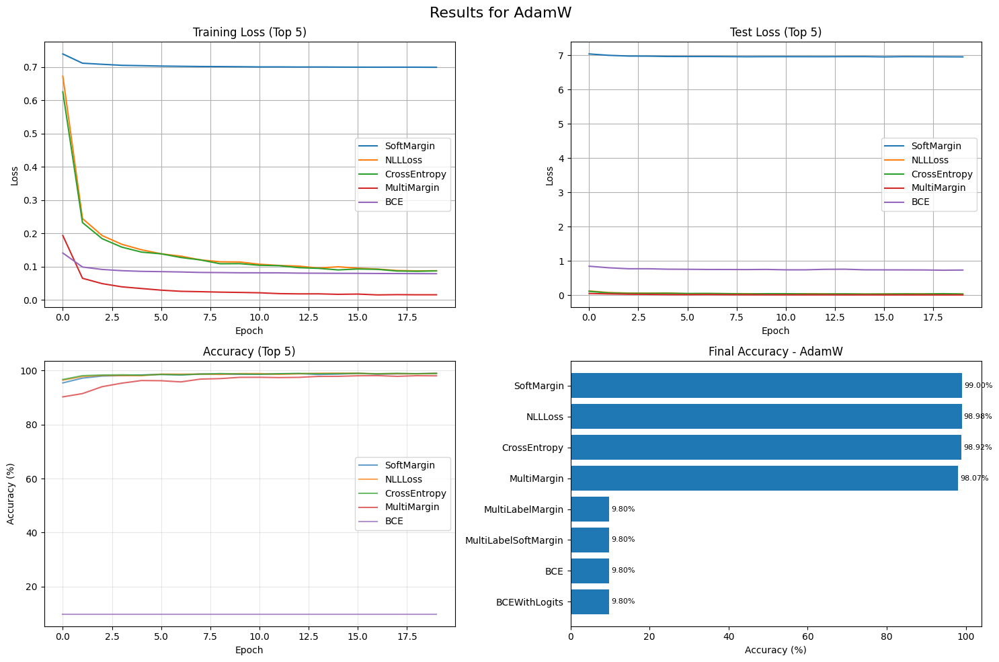

### 3. **Optimizer-SGD** (Only cobinations with Accuracy > 50%):
* SGD + CrossEntropy: Average loss: 0.0647, Accuracy: 9822/10000 (98.22% with final 97.83%);
* SGD + NLLLoss: Average loss: 0.0729, Accuracy: 9806/10000 (98.06% with final 98.04%);
* SGD + MultiMargin: Average loss: 0.0135, Accuracy: 9701/10000 (97.01% with final 96.96%);
* SGD + SoftMargin: Average loss: 7.0708, Accuracy: 9498/10000 (94.98%).
### **SGD RESULTS**: Like an AdamW and Adam Optimizers, SGD Optimizer is suitable with with CrossEntropy, NLLLoss, MultiMargin and SoftMargin loss function, where model showed good results (98.22%, 98.06%, 97.01%, 94.98%), that are shown on Accuracy and Final Accuracy graphs.

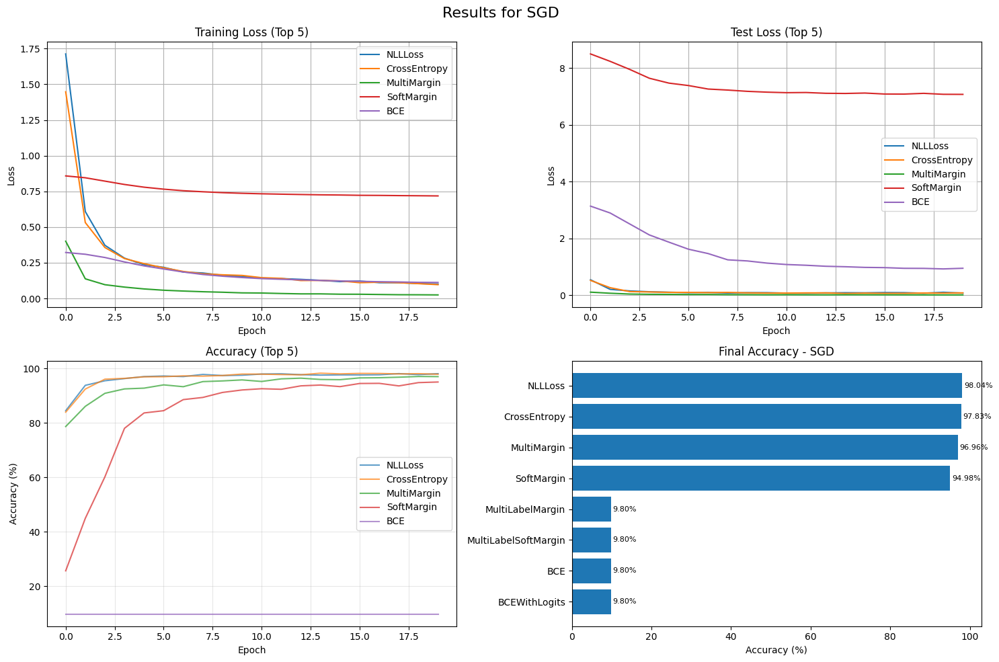

### 4. **Optimizer-RMSprop** (Only cobinations with Accuracy > 50%):
### **RMSprop RESULTS**: RMS-prop Optimizer showed quite bad results with different loss functions with maximum accuracy in 11.35%.

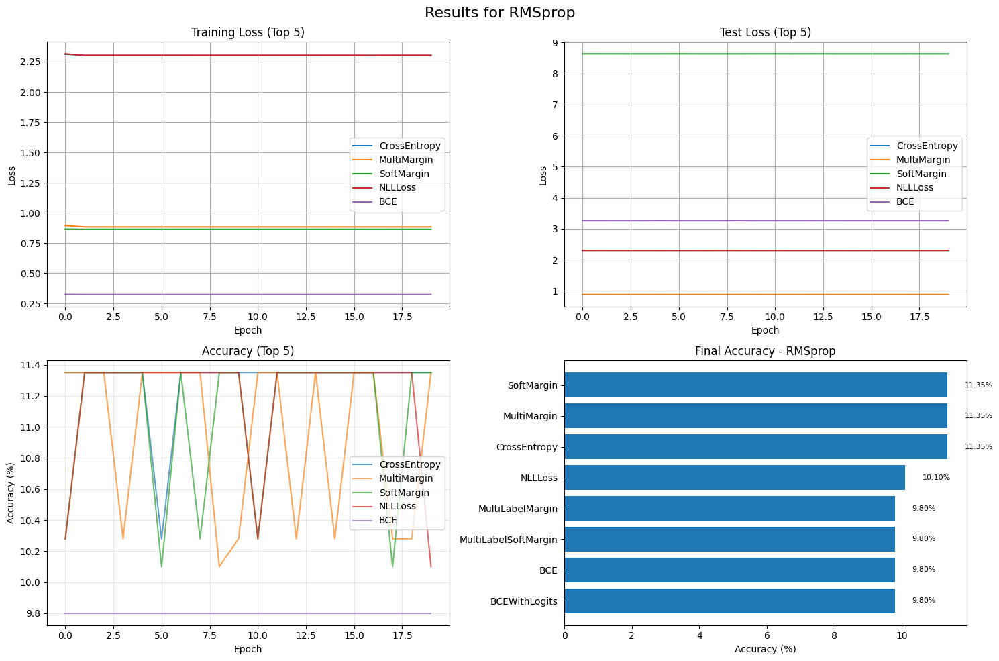

### 5. **Optimizer-Rprop** (Only cobinations with Accuracy > 30%):
* Rprop + SoftMargin: Average loss: inf, Accuracy: 3247/10000 (32.47%).
### **Rprop RESULTS**: Rprop Optimizer showed quite bad results, reaching the maximum accuracy with SoftMargin Loss in 32.47%, that is less that 1/3. The second place is Prop + CrossEntropy, showing 20.74% accuracy.

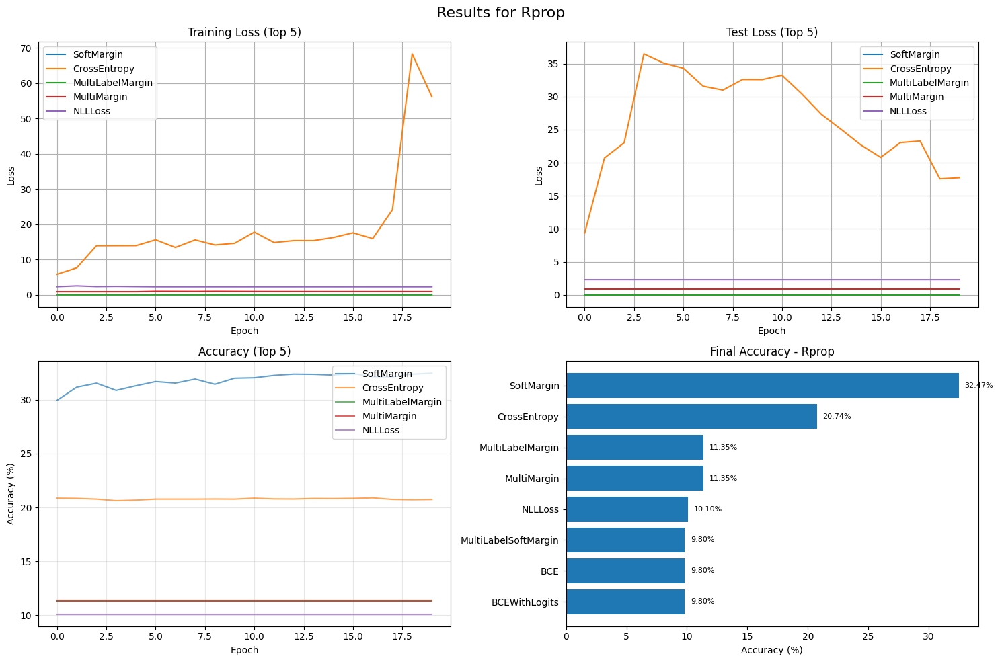

### 6. **Optimizer-Adagrad** (Only cobinations with Accuracy > 30%):
* Adagrad + NLLLoss: Average loss: 0.1058, Accuracy: 9703/10000 (97.03%);
* Adagrad + MultiMargin: Average loss: 0.0128, Accuracy: 9717/10000 (97.17%);
### **Adagrad RESULTS**: Only 2 combinations of Adagrad Optimizer and loss function showed good resuls: Adagrad with NLLLoss and 97.03% Accuracy and with MultiMargin, that showed 97.17% of Accuracy.

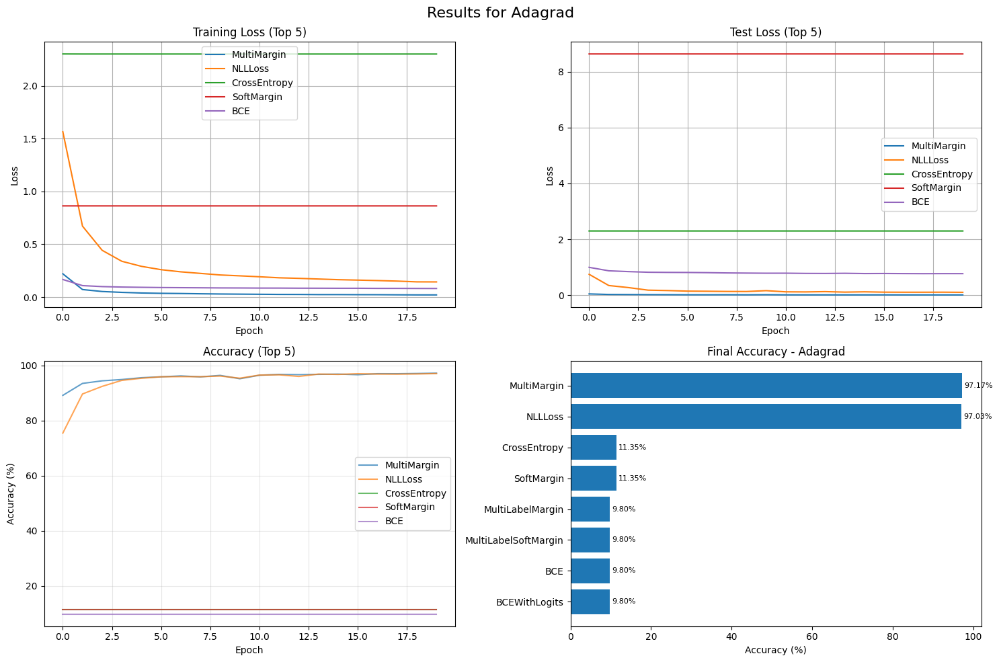

### 7. **Optimizer-Adadelta** (Only cobinations with Accuracy > 30%):
* Adadelta + CrossEntropy: Average loss: 0.0502, Accuracy: 9883/10000 (98.83%) (On epoch 9);
* Adagrad + NLLLoss: Average loss: 0.1240, Accuracy: 9725/10000 (97.25%) (On epoch 9);
* Adagrad + MultiMargin: Average loss: 0.0047, Accuracy: 9874/10000 (98.74%) (On epoch 16);
* Adagrad + SoftMargin: Average loss: 6.9625, Accuracy: 9884/10000 (98.84%) (On epoch 18);
### **Adadelta RESULTS**: 4 usual Loss combinations with Adadelta optimizer showed good results. All other loss combinations showed bad accuarcy results in 9.8%.

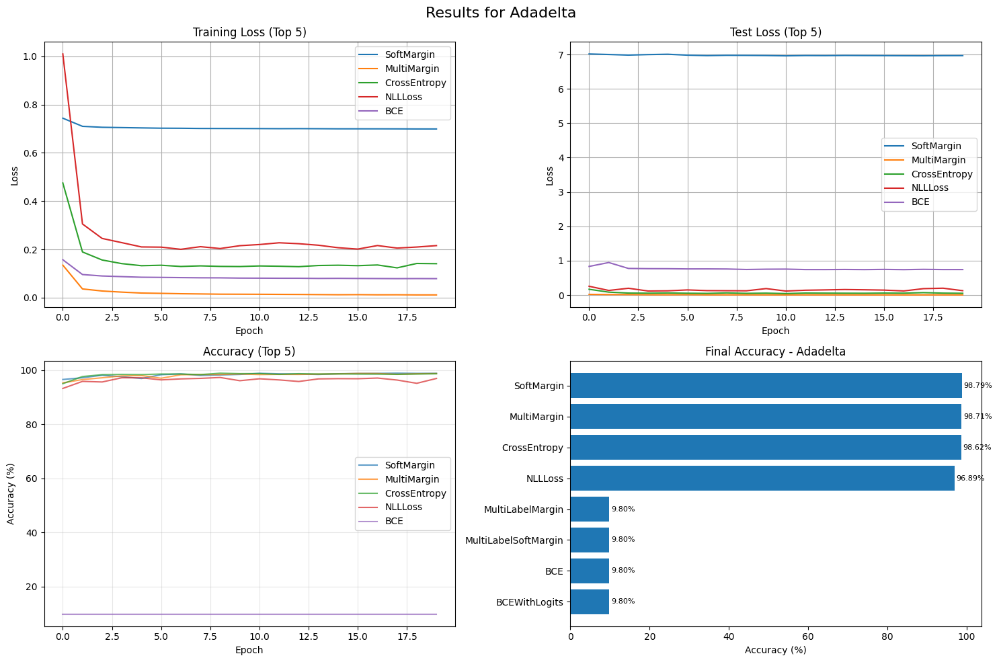

### 8. **Optimizer-NAdam** (Only cobinations with Accuracy > 30%):
* NAdam + CrossEntropy: Average loss: 0.0298, Accuracy: 9918/10000 (99.18%);
* NAdam + NLLLoss: Average loss: 0.0372, Accuracy: 9893/10000 (98.93%);
* NAdam + MultiMargin: Average loss: 0.0049, Accuracy: 9887/10000 (98.87%);
* NAdam + SoftMargin: Average loss: 6.9565, Accuracy: 9899/10000 (98.99%)(On epoch 19);
### **NAdam RESULTS**: Basic Loss combinations with NAdam optimizers showed good results. All other loss combinations showed bad accuarcy results in 9.8%.

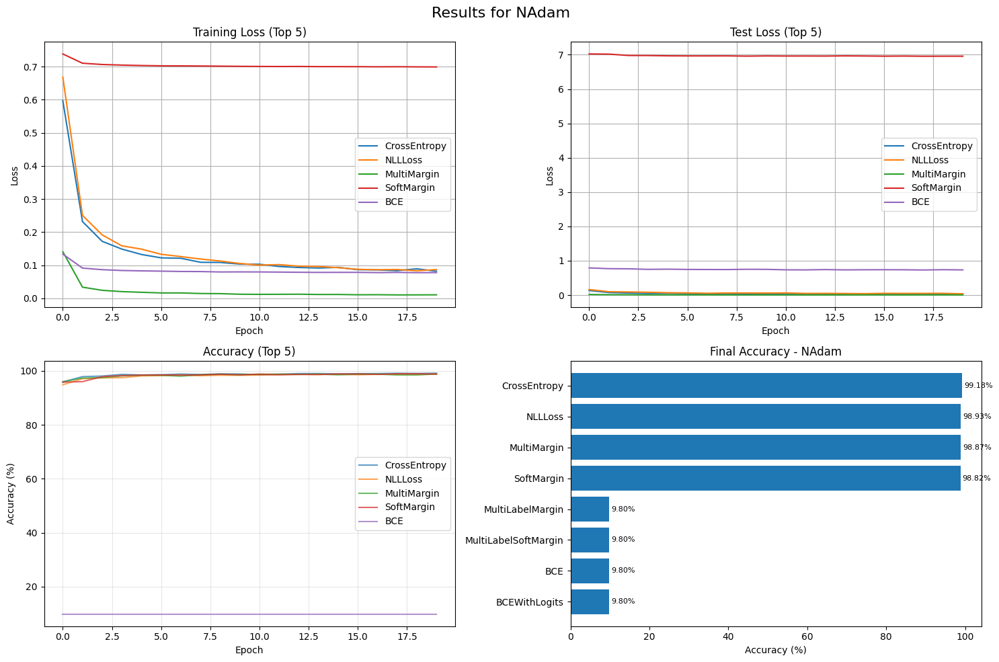

### 9. **Optimizer-RAdam** (Only cobinations with Accuracy > 30%):
* RAdam + CrossEntropy: Average loss: 0.0347, Accuracy: 9910/10000 (99.10%)
 (On epoch 19);
* RAdam + NLLLoss: Average loss: 0.0385, Accuracy: 9894/10000 (98.94%);
* RAdam + MultiMargin: Average loss: 0.0034, Accuracy: 9908/10000 (99.08%) (On epoch 18);
* RAdam + SoftMargin: Average loss: 6.9647, Accuracy: 9864/10000 (98.64%)(On epoch 18);
### **RAdam RESULTS**: 4 Basic Loss combinations with RAdam optimizers showed good results. All other loss combinations showed bad accuarcy results in 9.8%.

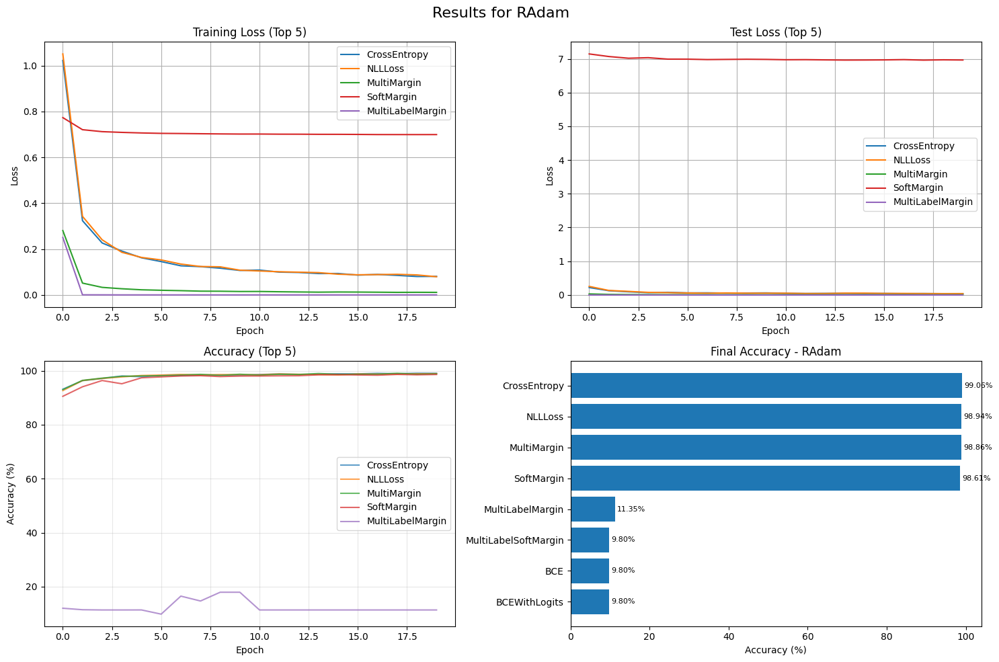

### 10. **Optimizer-ASGD** (Only cobinations with Accuracy > 30%):
* ASGD + CrossEntropy: Average loss: 0.0656, Accuracy: 9817/10000 (98.17%);
* ASGD + NLLLoss: Average loss: 0.0753, Accuracy: 9833/10000 (98.33%) (On epoch 19);
* ASGD + MultiMargin: Average loss: 0.0136, Accuracy: 9685/10000 (96.85%);
* ASGD + SoftMargin: Average loss: 7.2750, Accuracy: 8488/10000 (84.88%);
### **ASGD RESULTS**: 4 Basic Loss combinations with ASGD optimizers showed good results. All other loss combinations showed bad accuarcy results in 9.8%.

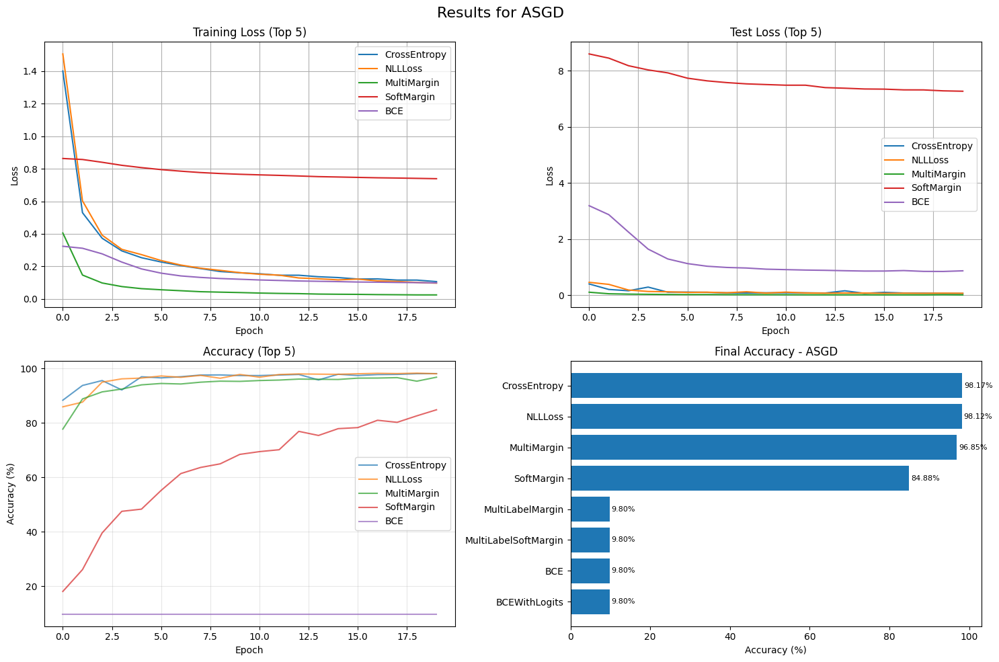

### 11. **Optimizer-Adamax** (Only cobinations with Accuracy > 30%):
* Adamax + CrossEntropy: Average loss: 0.0549, Accuracy: 9869/10000 (98.69%);
* Adamax + NLLLoss: Average loss: 0.0340, Accuracy: 9907/10000 (99.07%);
* Adamax + MultiMargin: Average loss: 0.0060, Accuracy: 9867/10000 (98.67%) (On epoch 14);
* Adamax + SoftMargin: Average loss: 6.9579, Accuracy: 9898/10000 (98.98%);
### **Adamax RESULTS**: 4 Basic Loss combinations with Adamax optimizers showed good results. All other loss combinations showed bad accuarcy results in 9.8%.

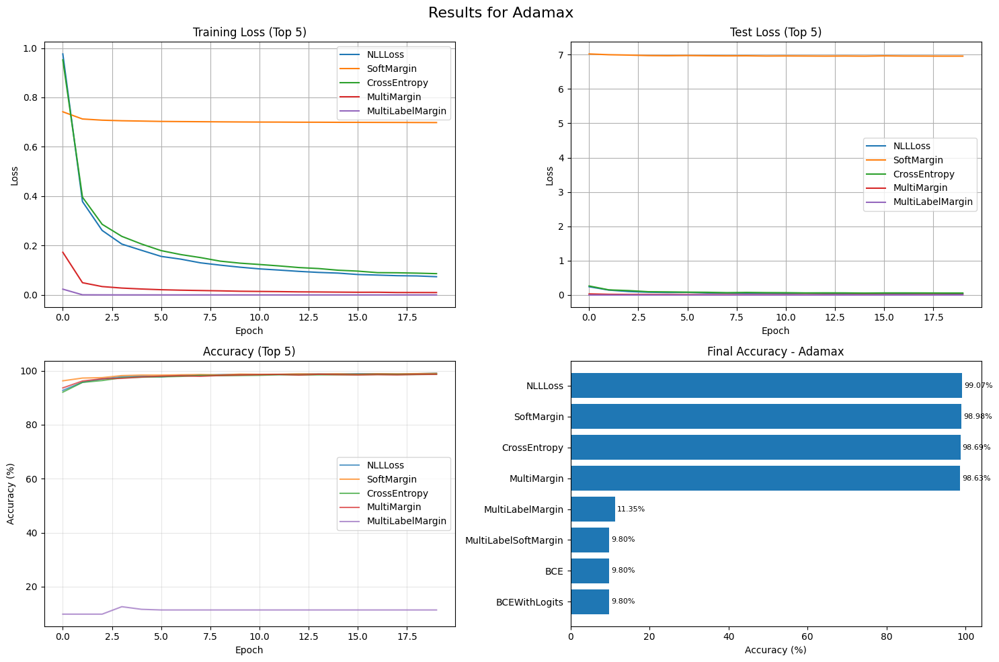

### 12. **Optimizer-Adafactor** (Only cobinations with Accuracy > 30%):
* Adafactor + CrossEntropy: Average loss: 0.0528, Accuracy: 9874/10000 (98.74%) (Epoch 19);
* Adafactor + NLLLoss: Average loss: 0.0393, Accuracy: 9901/10000 (99.01%);
* Adafactor + MultiMargin: Average loss: 0.0036, Accuracy: 9901/10000 (99.01%) (On epoch 19);
* Adafactor + SoftMargin: Average loss: 6.9653, Accuracy: 9900/10000 (99.00%);
### **Adafactor RESULTS**: 4 Basic Loss combinations with Adafactor optimizers showed good results. All other loss combinations showed bad accuarcy results in 9.8%.

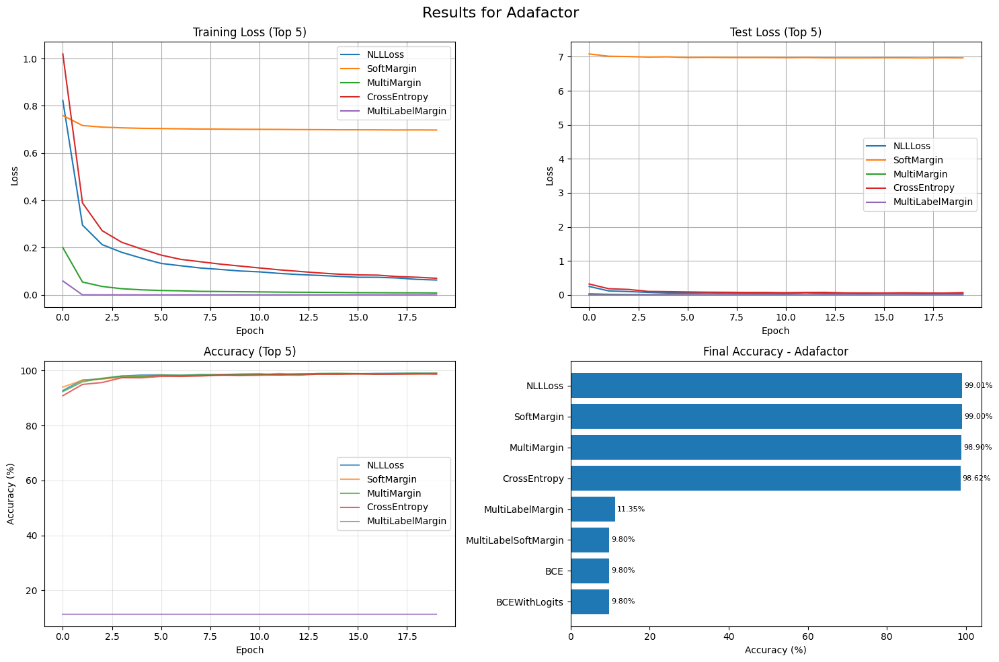

## **Final results**:
* Total of experiements: 180.
* Success experiements (counting results with 80% and more accuracy):
* Number of success Adam Optimizer experiements: 4.
* Number of success AdamW Optimizer experiements: 4.
* Number of success SGD Optimizer experiements: 4.
* Number of success RMSprop Optimizer experiements: 0.
* Number of success Rprop Optimizer experiements: 0.
* Number of success Adagrad Optimizer experiements: 2.
* Number of success Adadelta Optimizer experiements: 4.
* Number of success NAdam Optimizer experiements: 4.
* Number of success RAdam Optimizer experiements: 4.
* Number of success ASGD Optimizer experiements: 4.
* Number of success Adamax Optimizer experiements: 4.
* Number of success Adafactor Optimizer experiements: 4.
* Total number of successed experiements: 38.
* Percent of successed experiements: 21.12%.
* Percent of unsuccessed experiements: 78.88%.
* The best combination: NAdam with CrossEntropy Loss (99.18% of Accuracy).
* Top 20 of best combinations, based on their final results:
------------------------------------------------------------
 1. NAdam_CrossEntropy             |  99.18%
 2. Adamax_NLLLoss                 |  99.07%
 3. RAdam_CrossEntropy             |  99.06%
 4. Adafactor_NLLLoss              |  99.01%
 5. AdamW_SoftMargin               |  99.00%
 6. Adafactor_SoftMargin           |  99.00%
 7. AdamW_NLLLoss                  |  98.98%
 8. Adamax_SoftMargin              |  98.98%
 9. Adam_MultiMargin               |  98.97%
10. RAdam_NLLLoss                  |  98.94%
11. NAdam_NLLLoss                  |  98.93%
12. AdamW_CrossEntropy             |  98.92%
13. Adam_NLLLoss                   |  98.90%
14. Adafactor_MultiMargin          |  98.90%
15. Adam_CrossEntropy              |  98.89%
16. NAdam_MultiMargin              |  98.87%
17. RAdam_MultiMargin              |  98.86%
18. NAdam_SoftMargin               |  98.82%
19. Adadelta_SoftMargin            |  98.79%
20. Adadelta_MultiMargin           |  98.71%

* Best combinations, based on temporary loss result:
------------------------------------------------------------
|Optimizer | Loss Function | Average Loss | Accuracy | Max Epoch Accuracy|
|--|--|--|--|--|
|Adam|CrossEntropy|0.0396|98.89%|20|
|Adam|NLLLoss|0.0377|99.01%|18|
|Adam|MultiMargin|0.0035|99.07%|19|
|Adam|SoftMargin|6.9656|98.77%|20|
|AdamW|CrossEntropy|0.0339|99.01%|19|
|AdamW|NLLLoss|0.0305|99.05%|19|
|AdamW|MultiMargin|0.0084|98.14%|20|
|AdamW|SoftMargin|6.9545|99.00%|20|
|SGD|CrossEntropy|0.0647|98.22%|14|
|SGD|NLLLoss|0.0729|98.06%|18|
|SGD|MultiMargin|0.0135|97.01%|19|
|SGD|SoftMargin|7.0708|94.98%|20|
|Adagrad|NLLLoss|0.1058|97.03%|20|
|Adagrad|MultiMargin|0.0128|97.17%|20|
|Adadelta|CrossEntropy|0.0502|98.83%|9|
|Adadelta|NLLLoss|0.1240|97.25%|9|
|Adadelta|MultiMargin|0.0047|98.74%|16|
|Adadelta|SoftMargin|6.9625|98.84%|18|
|NAdam|CrossEntropy|0.0298|99.18%|20|
|NAdam|NLLLoss|0.0372|98.93%|20|
|NAdam|MultiMargin|0.0049|98.87%|20|
|NAdam|SoftMargin|6.9565|98.99%|19|
|RAdam|CrossEntropy|0.0347|99.10%|19|
|RAdam|NLLLoss|0.0385|98.94%|20|
|RAdam|MultiMargin|0.0034|99.08%|18|
|RAdam|SoftMargin|6.9647|98.64%|18|
|ASGD|CrossEntropy|0.0656|98.17%|20|
|ASGD|NLLLoss|0.0753|98.33%|19|
|ASGD|MultiMargin|0.0136|96.85%|20|
|ASGD|SoftMargin|7.2750|84.88%|20|
|Adamax|CrossEntropy|0.0549|98.69%|20|
|Adamax|NLLLoss|0.0340|99.07%|20|
|Adamax|MultiMargin|0.0060|98.67%|14|
|Adamax|SoftMargin|6.9579|98.98%|20|
|Adafactor|CrossEntropy|0.0528|98.74%|19|
|Adafactor|NLLLoss|0.0393|99.01%|20|
|Adafactor|MultiMargin|0.0036|99.01%|19|
|Adafactor|SoftMargin|6.9653|99.00%|20|

* Top combinations, based on accuracy result (rating):
------------------------------------------------------------
|Place|Optimizer | Loss Function | Average Loss | Accuracy | Max Epoch Accuracy|Fact|
|--|--|--|--|--|--|--|
|1|NAdam|CrossEntropy|0.0298|99.18%|20|Higher accuracy from all tests; Best result with CrossEntropy Loss; Best result with NAdam|
|2|RAdam|CrossEntropy|0.0347|99.10%|19|Best result with RAdam|
|3|RAdam|MultiMargin|0.0034|99.08%|18|Less avarage loss value; Best result with MultiMargin Loss|
|4|Adamax|NLLLoss|0.0340|99.07%|20|Best result with NLLLoss; Best result with Adamax|
|4|Adam|MultiMargin|0.0035|99.07%|19|Best result with Adam|
|5|AdamW|NLLLoss|0.0305|99.05%|19|Best result with AdamW|
|6|Adam|NLLLoss|0.0377|99.01%|18||
|6|AdamW|CrossEntropy|0.0339|99.01%|19||
|6|Adafactor|MultiMargin|0.0036|99.01%|19|Best result with Adafactor|
|6|Adafactor|NLLLoss|0.0393|99.01%|20||
|7|Adafactor|SoftMargin|6.9653|99.00%|20|Biggest average loss with strong accuracy; Best result with SoftMargin Loss|
|7|AdamW|SoftMargin|6.9545|99.00%|20||
|8|NAdam|SoftMargin|6.9565|98.99%|19||
|9|Adamax|SoftMargin|6.9579|98.98%|20||
|10|RAdam|NLLLoss|0.0385|98.94%|20||
|11|NAdam|NLLLoss|0.0372|98.93%|20||
|12|Adam|CrossEntropy|0.0396|98.89%|20||
|13|NAdam|MultiMargin|0.0049|98.87%|20|Worst result with NAdam|
|14|Adadelta|SoftMargin|6.9625|98.84%|18|Best result with Adadelta|
|15|Adadelta|CrossEntropy|0.0502|98.83%|9|Less epoch value|
|16|Adam|SoftMargin|6.9656|98.77%|20|Worst result with Adam|
|17|Adafactor|CrossEntropy|0.0528|98.74%|19|Worst result with Adafactor|
|17|Adadelta|MultiMargin|0.0047|98.74%|16|
|18|Adamax|CrossEntropy|0.0549|98.69%|20||
|19|Adamax|MultiMargin|0.0060|98.67%|14|Worst result with Adamax|
|20|RAdam|SoftMargin|6.9647|98.64%|18|Worst result with RAdam|
|21|ASGD|NLLLoss|0.0753|98.33%|19|Best result with ASGD|
|22|SGD|CrossEntropy|0.0647|98.22%|14|Best result with SGD|
|23|ASGD|CrossEntropy|0.0656|98.17%|20|Worst result with CrossEntropy Loss|
|24|AdamW|MultiMargin|0.0084|98.14%|20|Worst result with AdamW|
|25|SGD|NLLLoss|0.0729|98.06%|18||
|26|Adadelta|NLLLoss|0.1240|97.25%|9|Less epoch value; Worst result with Adadelta|
|27|Adagrad|MultiMargin|0.0128|97.17%|20|Best result with Adagrad|
|28|Adagrad|NLLLoss|0.1058|97.03%|20|Worst result with NLLLoss Loss; Worst result with Adagrad|
|29|SGD|MultiMargin|0.0135|97.01%|19||
|30|ASGD|MultiMargin|0.0136|96.85%|20|Worst result with MultiMargin Loss|
|31|SGD|SoftMargin|7.0708|94.98%|20|Worst result with SGD|
|32|ASGD|SoftMargin|7.2750|84.88%|20|Less accuracy from all tests; Worst result with SoftMargin Loss; Worst result with ASGD; biggest avarage loss value|

### !: The best result was shown by model with NAdam optimizer and CrossEntropy Loss function.

### **STN Visualizer for NAdam CrossEntropy Test**

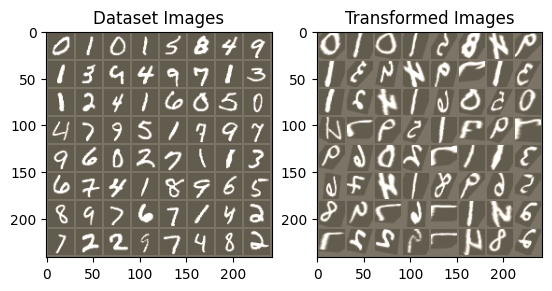

### **Tests on 5 combinations**


Experiment: Adam + CrossEntropy


/usr/local/lib/python3.12/dist-packages/torch/nn/functional.py:5163: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/functional.py:5096: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


Train Epoch: 1 [0/60000 (0%)]	Loss: 2.331627
Train Epoch: 1 [32000/60000 (53%)]	Loss: 0.315287

Test set: Average loss: 0.1301, Accuracy: 9581/10000 (95.81%)

Train Epoch: 2 [0/60000 (0%)]	Loss: 0.595535
Train Epoch: 2 [32000/60000 (53%)]	Loss: 0.331797

Test set: Average loss: 0.0868, Accuracy: 9745/10000 (97.45%)

Train Epoch: 3 [0/60000 (0%)]	Loss: 0.143009
Train Epoch: 3 [32000/60000 (53%)]	Loss: 0.230201

Test set: Average loss: 0.0663, Accuracy: 9809/10000 (98.09%)

Train Epoch: 4 [0/60000 (0%)]	Loss: 0.199928
Train Epoch: 4 [32000/60000 (53%)]	Loss: 0.308615

Test set: Average loss: 0.0588, Accuracy: 9842/10000 (98.42%)

Train Epoch: 5 [0/60000 (0%)]	Loss: 0.063810
Train Epoch: 5 [32000/60000 (53%)]	Loss: 0.149202

Test set: Average loss: 0.0563, Accuracy: 9822/10000 (98.22%)

Train Epoch: 6 [0/60000 (0%)]	Loss: 0.145327
Train Epoch: 6 [32000/60000 (53%)]	Loss: 0.043618

Test set: Average loss: 0.0565, Accuracy: 9833/10000 (98.33%)

Train Epoch: 7 [0/60000 (0%)]	Loss: 0.145706
T

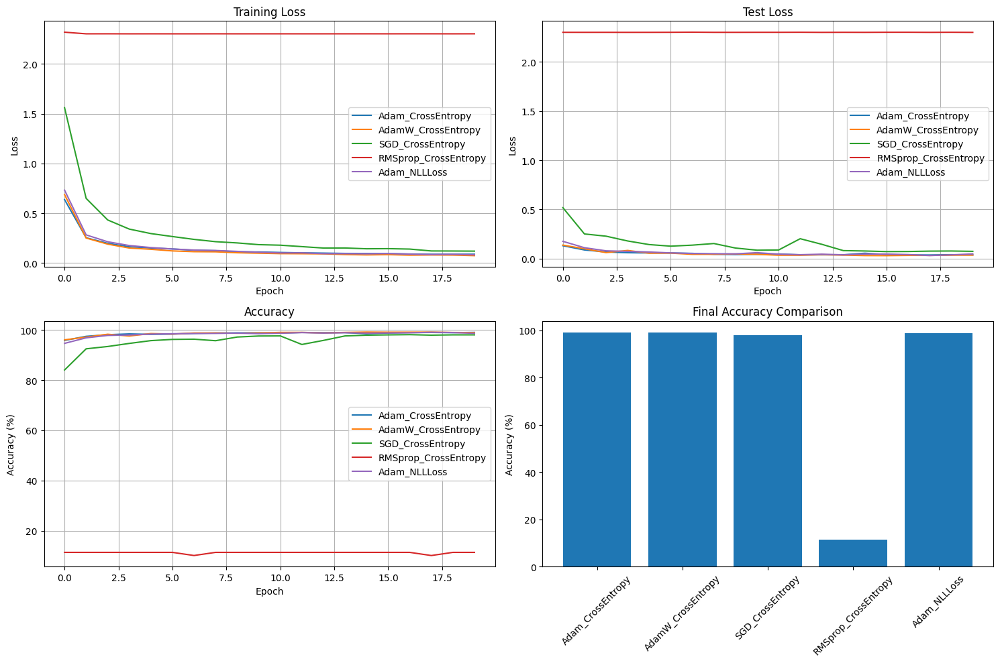


Best combination: Adam_CrossEntropy
Visualizing STN for best combination...
Train Epoch: 1 [0/60000 (0%)]	Loss: 0.068550
Train Epoch: 1 [32000/60000 (53%)]	Loss: 0.116652
Train Epoch: 2 [0/60000 (0%)]	Loss: 0.023618
Train Epoch: 2 [32000/60000 (53%)]	Loss: 0.140877
Train Epoch: 3 [0/60000 (0%)]	Loss: 0.009227
Train Epoch: 3 [32000/60000 (53%)]	Loss: 0.153696
Train Epoch: 4 [0/60000 (0%)]	Loss: 0.065025
Train Epoch: 4 [32000/60000 (53%)]	Loss: 0.072329


NameError: name 'visualize_stn' is not defined

In [ ]:
results = {}

test_combinations = [
    ('Adam', 'CrossEntropy'),
    ('AdamW', 'CrossEntropy'),
    ('SGD', 'CrossEntropy'),
    ('RMSprop', 'CrossEntropy'),
    ('Adam', 'NLLLoss')
]

for optimizer_name, loss_name in test_combinations:
    exp_name = f"{optimizer_name}_{loss_name}"
    results[exp_name] = experiment(optimizer_name, loss_name, epochs=20)

# Визуализация результатов
plot_results(results)

# Визуализация STN для лучшего эксперимента
best_exp = max(results.items(), key=lambda x: x[1]['final_accuracy'])[0]
print(f"\nBest combination: {best_exp}")
print("Visualizing STN for best combination...")

# Переобучаем модель с лучшими параметрами для визуализации
best_optimizer, best_loss = best_exp.split('_')
optimizer = setup_optimizer(best_optimizer, model.parameters())
loss_fn = loss_functions[best_loss]

for epoch in range(1, 5):  # Быстрая тренировка для визуализации
    train(epoch, optimizer, loss_fn, best_loss)

visualize_stn()
plt.show()

### **Best test**: Adam Optimizer with CrossEntropy Loss (Average loss: 0.0297, Accuracy: 9905/10000 (99.05%)).
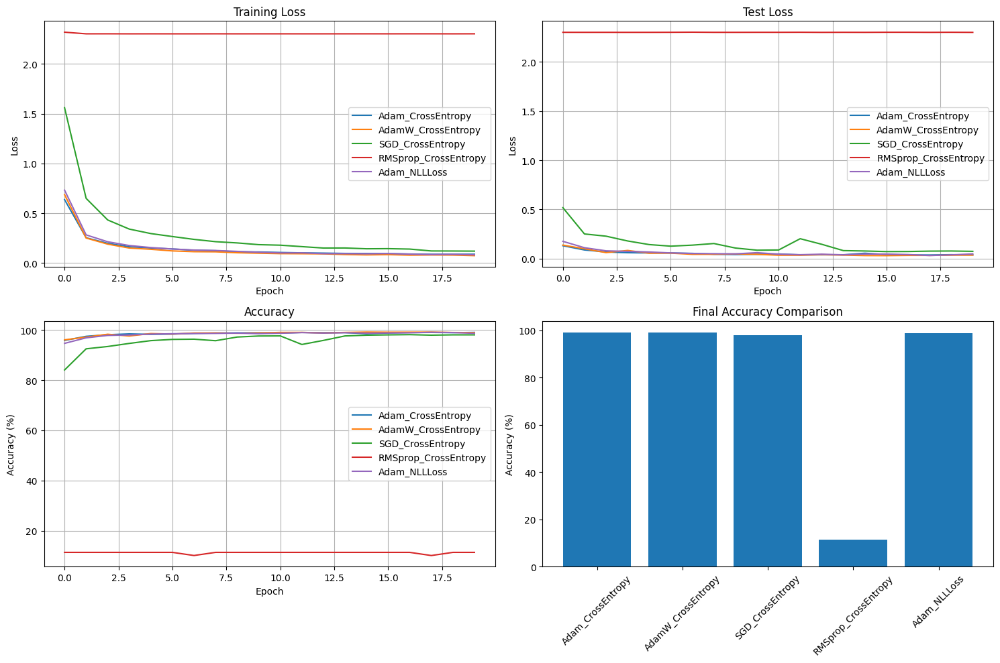